In [2]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# import plotly.graph_objects as go
import seaborn as sns
import h5py
from collections import Counter
import scipy.sparse as sp
from matplotlib.patches import Patch
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.patheffects as path_effects
# from matplotlib_venn import venn3
# import pyranges as pr
import yaml
import time
from itertools import combinations
import gget
# import gseapy as gp
from scipy import sparse

import anndata as an
import scanpy as sc
import rapids_singlecell as rsc

sc.settings.verbosity = 3

# Load gene resources

In [3]:
%%time 
# === Load and filter GTF ===
gpath = "/scratch/indikar_root/indikar1/shared_data/HYB/resources/refdata-gex-GRCh38-2024-A_genes.csv.gz"

gtf = pd.read_csv(gpath)

exons = gtf[gtf['Feature'] == 'exon']
print(f"{exons.shape=}")
exons.head()

exons.shape=(1586950, 27)
CPU times: user 7.94 s, sys: 1.35 s, total: 9.28 s
Wall time: 9.37 s


,Chromosome,Source,Feature,Start,End,Score,Strand,Frame,gene_id,gene_version,...,transcript_name,transcript_support_level,havana_transcript,exon_number,exon_id,exon_version,hgnc_id,havana_gene,protein_id,ccdsid
2,GL000009.2,ENSEMBL,exon,56139,58376,.,-,.,ENSG00000278704,1,...,ENST00000618686,NaN,NaN,1.0,ENSE00003753029,1.0,NaN,NaN,ENSP00000484918.1,NaN
10,GL000194.1,ENSEMBL,exon,114985,115018,.,-,.,ENSG00000277400,1,...,ENST00000613230,1.0,NaN,1.0,ENSE00002299440,2.0,NaN,NaN,ENSP00000483280.1,NaN
11,GL000194.1,ENSEMBL,exon,112791,112850,.,-,.,ENSG00000277400,1,...,ENST00000613230,1.0,NaN,2.0,ENSE00003739295,1.0,NaN,NaN,ENSP00000483280.1,NaN
12,GL000194.1,ENSEMBL,exon,53589,55676,.,-,.,ENSG00000277400,1,...,ENST00000613230,1.0,NaN,3.0,ENSE00003723764,1.0,NaN,NaN,ENSP00000483280.1,NaN
22,GL000194.1,ENSEMBL,exon,114985,115055,.,-,.,ENSG00000274847,1,...,MAFIP-201,1.0,NaN,1.0,ENSE00003736481,1.0,HGNC:31102,NaN,ENSP00000478910.1,NaN


In [4]:
fpath = "../../resources/isoform_map.csv.gz"

idf = pd.read_csv(fpath)
print(f"{idf.shape=}")

idf['uniprot'] = np.where(idf['UniProtKB/TrEMBL ID'].isna(), idf['UniProtKB/Swiss-Prot ID'], idf['UniProtKB/TrEMBL ID'])

transcript_2_uniprot = dict(zip(idf['Transcript name'].values, idf['uniprot'].values))

idf.head()

idf.shape=(110149, 11)


,Gene stable ID,Gene stable ID version,Transcript stable ID,Transcript stable ID version,Protein stable ID,Protein stable ID version,Transcript length (including UTRs and CDS),Transcript name,Gene name,UniProtKB/Swiss-Prot ID,UniProtKB/TrEMBL ID,uniprot
0,ENSG00000198888,ENSG00000198888.2,ENST00000361390,ENST00000361390.2,ENSP00000354687,ENSP00000354687.2,956,MT-ND1-201,MT-ND1,P03886,U5Z754,U5Z754
1,ENSG00000198763,ENSG00000198763.3,ENST00000361453,ENST00000361453.3,ENSP00000355046,ENSP00000355046.4,1042,MT-ND2-201,MT-ND2,P03891,Q7GXY9,Q7GXY9
2,ENSG00000198804,ENSG00000198804.2,ENST00000361624,ENST00000361624.2,ENSP00000354499,ENSP00000354499.2,1542,MT-CO1-201,MT-CO1,P00395,U5YWV7,U5YWV7
3,ENSG00000198712,ENSG00000198712.1,ENST00000361739,ENST00000361739.1,ENSP00000354876,ENSP00000354876.1,684,MT-CO2-201,MT-CO2,P00403,U5Z487,U5Z487
4,ENSG00000228253,ENSG00000228253.1,ENST00000361851,ENST00000361851.1,ENSP00000355265,ENSP00000355265.1,207,MT-ATP8-201,MT-ATP8,P03928,U5YV54,U5YV54


In [5]:
idf['uniprot'].nunique()

73747

In [9]:
upath = "/scratch/indikar_root/indikar1/jrcwycy/hsc_temp/HUMAN_9606_idmapping_selected.tab.gz"

columns = [
    'UniProtKB-AC',
    'UniProtKB-ID',
    'GeneID (EntrezGene)',
    'RefSeq',
    'GI',
    'PDB',
    'GO',
    'UniRef100',
    'UniRef90',
    'UniRef50',
    'UniParc',
    'PIR',
    'NCBI-taxon',
    'MIM',
    'UniGene',
    'PubMed',
    'EMBL',
    'EMBL-CDS',
    'Ensembl',
    'Ensembl_TRS',
    'Ensembl_PRO',
    'Additional PubMed',
]

udf = pd.read_csv(
    upath, 
    sep='\t',
    header=None,
    low_memory=False,
    names=columns,
)

keep_columns = [
    'UniProtKB-AC',
    'UniProtKB-ID',
    # 'Ensembl',
    'Ensembl_TRS',
]

udf = udf[keep_columns]
udf = udf.assign(Ensembl_TRS=udf['Ensembl_TRS'].str.split(';')).explode('Ensembl_TRS')
udf['transcript_id'] = udf['Ensembl_TRS'].apply(lambda x: str(x).split(".")[0])
udf = udf.rename(columns={'UniProtKB-AC': 'uniprot'})

transcript_map = dict(zip(udf['transcript_id'].values, udf['uniprot'].values))

udf.head()

,uniprot,UniProtKB-ID,Ensembl_TRS,transcript_id
0,P31946,1433B_HUMAN,ENST00000353703.9,ENST00000353703
0,P31946,1433B_HUMAN,ENST00000372839.7,ENST00000372839
1,P62258,1433E_HUMAN,ENST00000264335.13,ENST00000264335
1,P62258,1433E_HUMAN,ENST00000571732.5,ENST00000571732
1,P62258,1433E_HUMAN,ENST00000616643.3,ENST00000616643


In [25]:
gtf_sub = gtf[['transcript_id', 'transcript_name']].drop_duplicates()
gtf_sub = gtf_sub.dropna()
print(gtf_sub.shape)
gtf_sub.head()

(226005, 2)


,transcript_id,transcript_name
1,ENST00000618686,ENST00000618686
9,ENST00000613230,ENST00000613230
21,ENST00000400754,MAFIP-201
35,ENST00000612465,ENST00000612465
45,ENST00000616049,ENST00000616049


In [27]:
udf1 = pd.merge(udf, gtf_sub, how='left', on='transcript_id')
print(udf1.shape)

udf1 = udf1.dropna(subset='transcript_name')

print(udf1.shape)
udf1.head()

(246523, 5)
(78415, 5)


,uniprot,UniProtKB-ID,Ensembl_TRS,transcript_id,transcript_name
0,P31946,1433B_HUMAN,ENST00000353703.9,ENST00000353703,YWHAB-201
2,P62258,1433E_HUMAN,ENST00000264335.13,ENST00000264335,YWHAE-201
6,Q04917,1433F_HUMAN,ENST00000248975.6,ENST00000248975,YWHAH-201
7,P61981,1433G_HUMAN,ENST00000307630.5,ENST00000307630,YWHAG-201
8,P31947,1433S_HUMAN,ENST00000339276.6,ENST00000339276,SFN-201


In [28]:
print(udf['uniprot'].nunique())
print(udf1['uniprot'].nunique())

205003
78415


In [29]:
transcript_map = dict(zip(udf1['transcript_name'].values, udf1['uniprot'].values))

In [11]:
fpath = "../../resources/allTFs_hg38.txt"
tf_list = [x.strip() for x in open(fpath)]
tf_list[:10]

['ZNF354C',
 'KLF12',
 'ZNF143',
 'ZIC2',
 'ZNF274',
 'SP2',
 'ZBTB7A',
 'BCL6B',
 'ZBTB49',
 'ZIC1']

# Load gene data

In [12]:
%%time
# path = "/nfs/turbo/umms-indikar/shared/projects/hybrid_reprogramming/anndata/processed_merged_gene_data.h5ad"
path = "/nfs/turbo/umms-indikar/shared/projects/hybrid_reprogramming/anndata/processed_all_groups.h5ad"
gdata = sc.read_h5ad(path)
gdata

CPU times: user 264 ms, sys: 1.37 s, total: 1.63 s
Wall time: 3.79 s


AnnData object with n_obs × n_vars = 15950 × 25042
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'leiden_split'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'filter_pass', 'highly_variable', 'highly_variable_rank', 'm

# Load isoform data

In [13]:
%%time

path = "/scratch/indikar_root/indikar1/shared_data/HYB/anndata/isoforms.h5ad"
adata = sc.read_h5ad(path)
adata.var.set_index('transcript_name', inplace=True)
print(adata)
adata.var.head()

AnnData object with n_obs × n_vars = 19858 × 89570
    obs: 'dataset', 'n_reads', 'n_transcripts'
    var: 'gene_id', 'gene_name', 'gene_type', 'transcript_type', 'Chromosome', 'Start', 'End', 'transcript_id', 'UniProtKB'
CPU times: user 228 ms, sys: 245 ms, total: 473 ms
Wall time: 1.16 s


,gene_id,gene_name,gene_type,transcript_type,Chromosome,Start,End,transcript_id,UniProtKB
transcript_name,,,,,,,,,
ARF5-201,ENSG00000004059,ARF5,protein_coding,protein_coding,chr7,127588410,127591700,ENST00000000233,P84085
M6PR-201,ENSG00000003056,M6PR,protein_coding,protein_coding,chr12,8940360,8949645,ENST00000000412,P20645
ESRRA-201,ENSG00000173153,ESRRA,protein_coding,protein_coding,chr11,64305523,64316743,ENST00000000442,P11474
FKBP4-201,ENSG00000004478,FKBP4,protein_coding,protein_coding,chr12,2794969,2805423,ENST00000001008,Q02790
CYP26B1-201,ENSG00000003137,CYP26B1,protein_coding,protein_coding,chr2,72129237,72147862,ENST00000001146,Q9NR63


In [14]:
%%time

print(f"Initial number of cells in adata: {adata.n_obs}")
print(f"Number of cells in gdata: {gdata.n_obs}")

# Subset adata to those present in bdata
cells_to_keep = adata.obs_names.isin(gdata.obs_names)
print(f"Number of cells in adata after filtering by gdata: {cells_to_keep.sum()}")

adata = adata[cells_to_keep, :].copy()
print(f"Final number of cells in adata: {adata.n_obs}")

# Sort adata and bdata to the same order (shared cells only)
shared_cells = gdata.obs_names.intersection(adata.obs_names)
print(f"Number of shared cells: {len(shared_cells)}")

# Sort both AnnData objects
adata = adata[shared_cells, :].copy()
gdata_sorted = gdata[shared_cells, :].copy()

# Assert same order
assert all(adata.obs_names == gdata_sorted.obs_names), "Cell ordering does not match!"
print("Cell ordering is identical between adata and bdata (shared cells).")
adata

Initial number of cells in adata: 19858
Number of cells in gdata: 15950
Number of cells in adata after filtering by gdata: 15950
Final number of cells in adata: 15950
Number of shared cells: 15950
Cell ordering is identical between adata and bdata (shared cells).
CPU times: user 892 ms, sys: 2.17 s, total: 3.07 s
Wall time: 3.11 s


AnnData object with n_obs × n_vars = 15950 × 89570
    obs: 'dataset', 'n_reads', 'n_transcripts'
    var: 'gene_id', 'gene_name', 'gene_type', 'transcript_type', 'Chromosome', 'Start', 'End', 'transcript_id', 'UniProtKB'

Before merge: adata.obs columns = ['dataset', 'n_reads', 'n_transcripts']
After merge: adata.obs columns = ['dataset', 'n_reads', 'n_transcripts', 'leiden_split', 'pooled_condition', 'phase', 'dataset_gdata']
AnnData object with n_obs × n_vars = 15950 × 89570
    obs: 'dataset', 'n_reads', 'n_transcripts', 'leiden_split', 'pooled_condition', 'phase', 'dataset_gdata'
    var: 'gene_id', 'gene_name', 'gene_type', 'transcript_type', 'Chromosome', 'Start', 'End', 'transcript_id', 'UniProtKB'
    uns: 'leiden_split_colors', 'dataset_colors', 'pooled_condition_colors', 'umap'
    obsm: 'X_umap'


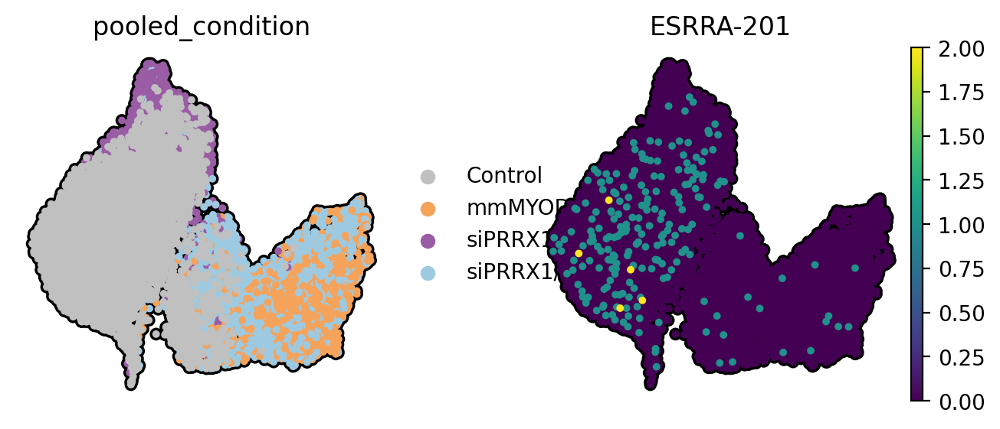

CPU times: user 832 ms, sys: 31.6 ms, total: 864 ms
Wall time: 922 ms


In [15]:
%%time

obs_columns = [
    'leiden_split',
    'pooled_condition',
    'phase',
    'dataset',
]

print(f"Before merge: adata.obs columns = {list(adata.obs.columns)}")

# Subset bdata.obs to the needed columns
df_merge = gdata.obs[obs_columns].copy()
df_merge.index.name = "cell"

# Merge by index (obs_names)
adata.obs = adata.obs.merge(df_merge, left_index=True, right_index=True, suffixes=('', '_gdata'))

print(f"After merge: adata.obs columns = {list(adata.obs.columns)}")

# Add uns
adata.uns['leiden_split_colors'] = gdata.uns['leiden_split_colors'].copy()
adata.uns['dataset_colors'] = gdata.uns['dataset_colors'].copy()
adata.uns['pooled_condition_colors'] = gdata.uns['pooled_condition_colors'].copy()

# Merge embeddings
adata.obsm['X_umap'] = gdata.obsm['X_umap'].copy()
adata.uns['umap'] = gdata.uns['umap'].copy()

print(adata)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    ncols=2,
    sort_order=True,
    color=['pooled_condition', 'ESRRA-201'],
    size=50,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    frameon=False,
)

In [16]:
sc.pp.filter_genes(adata, min_counts=20)

adata.layers['counts'] = adata.X.copy()

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

adata.layers['log_norm'] = adata.X.copy()
adata

filtered out 32111 genes that are detected in less than 20 counts
normalizing counts per cell
    finished (0:00:00)


AnnData object with n_obs × n_vars = 15950 × 57459
    obs: 'dataset', 'n_reads', 'n_transcripts', 'leiden_split', 'pooled_condition', 'phase', 'dataset_gdata'
    var: 'gene_id', 'gene_name', 'gene_type', 'transcript_type', 'Chromosome', 'Start', 'End', 'transcript_id', 'UniProtKB', 'n_counts'
    uns: 'leiden_split_colors', 'dataset_colors', 'pooled_condition_colors', 'umap', 'log1p'
    obsm: 'X_umap'
    layers: 'counts', 'log_norm'

In [10]:
adata.obs.head()

,dataset,n_reads,n_transcripts,leiden_split,pooled_condition,phase,dataset_gdata
AAACCAAAGCAACTGC_hybrid,Hybrid,10383,3090,H1,siPRRX1/mmMYOD1,G2M,Hybrid
AAACCAAAGTAGGGCA_hybrid,Hybrid,5458,2211,M1,mmMYOD1,S,Hybrid
AAACCAAAGTCTAGGC_hybrid,Hybrid,15520,4099,H1,siPRRX1/mmMYOD1,G1,Hybrid
AAACCATTCACGTAAT_hybrid,Hybrid,5523,2053,P2,siPRRX1,G2M,Hybrid
AAACCATTCAGGCAGA_hybrid,Hybrid,11290,2922,P2,siPRRX1,G2M,Hybrid


In [17]:
adata.var.head()

,gene_id,gene_name,gene_type,transcript_type,Chromosome,Start,End,transcript_id,UniProtKB,n_counts
transcript_name,,,,,,,,,,
ARF5-201,ENSG00000004059,ARF5,protein_coding,protein_coding,chr7,127588410,127591700,ENST00000000233,P84085,14856
M6PR-201,ENSG00000003056,M6PR,protein_coding,protein_coding,chr12,8940360,8949645,ENST00000000412,P20645,4527
ESRRA-201,ENSG00000173153,ESRRA,protein_coding,protein_coding,chr11,64305523,64316743,ENST00000000442,P11474,225
FKBP4-201,ENSG00000004478,FKBP4,protein_coding,protein_coding,chr12,2794969,2805423,ENST00000001008,Q02790,2828
NDUFAF7-201,ENSG00000003509,NDUFAF7,protein_coding,protein_coding,chr2,37231657,37249160,ENST00000002125,Q7L592,484


# Isoform table

In [30]:
%%time 

adata.X = adata.layers['counts'].copy()

aggdata = sc.get.aggregate(
    adata, 
    # by='pooled_condition',
    by='leiden_split',
    func='sum',
    axis=0,
)

aggdata.X = aggdata.layers['sum'].copy()

sc.pp.normalize_total(aggdata, target_sum=1e4)
sc.pp.log1p(aggdata)

aggdata.layers['log_norm'] = aggdata.X.copy()

aggdata


df = aggdata.to_df(layer='sum').T
df['total_transcript'] = df.sum(axis=1)

df = pd.merge(
    df, adata.var[['gene_name', 'gene_type', 'transcript_type']],#, 'transcript_name']],
    how='left',
    left_index=True,
    right_index=True,
)

df = df.reset_index(names='transcript_name')
df = df.sort_values(by=['gene_name', 'transcript_name'])
df = df.reset_index(drop=True)
df['is_tf'] = df['gene_name'].isin(tf_list)
df['uniprot'] = df['transcript_name'].map(transcript_map)
# df['uniprot'] = df['transcript_name'].map(transcript_2_uniprot)
print(f"{df.shape=}")
df.head()

normalizing counts per cell
    finished (0:00:00)
df.shape=(57459, 19)
CPU times: user 320 ms, sys: 286 ms, total: 607 ms
Wall time: 618 ms


,transcript_name,C1,C2,C3,H1,H3,H2,M1,M2,M3,P2,P1,P3,total_transcript,gene_name,gene_type,transcript_type,is_tf,uniprot
0,A1BG-203,8.0,1.0,0.0,8.0,1.0,4.0,1.0,2.0,3.0,5.0,7.0,3.0,43.0,A1BG,protein_coding,protein_coding_CDS_not_defined,False,NaN
1,A1BG-204,5573.0,636.0,24.0,997.0,206.0,446.0,363.0,388.0,181.0,894.0,1188.0,430.0,11326.0,A1BG,protein_coding,retained_intron,False,NaN
2,A1BG-AS1-202,31.0,5.0,0.0,14.0,3.0,0.0,0.0,2.0,2.0,5.0,13.0,2.0,77.0,A1BG-AS1,lncRNA,lncRNA,False,NaN
3,A1BG-AS1-203,18.0,1.0,0.0,9.0,1.0,2.0,0.0,1.0,1.0,3.0,5.0,0.0,41.0,A1BG-AS1,lncRNA,lncRNA,False,NaN
4,A1BG-AS1-204,88.0,9.0,0.0,40.0,12.0,15.0,14.0,14.0,13.0,19.0,31.0,7.0,262.0,A1BG-AS1,lncRNA,lncRNA,False,NaN


In [31]:
df['uniprot'].nunique()

22951

In [ ]:
# %%time 
# adata.X = adata.layers['log_norm'].copy()
# # rsc.get.anndata_to_GPU(adata)
# print(f"{type(adata.X)=}")

# aggdata = rsc.get.aggregate(
#     adata, 
#     by='pooled_condition',
#     func='sum',
#     axis=0,
# )

# # rsc.get.anndata_to_CPU(aggdata, convert_all=True,)

# aggdata

# df = aggdata.to_df(layer='sum')
# df = df.T
# df['total_transcript'] = df.sum(axis=1)

# df = pd.merge(
#     df, adata.var[['gene_name', 'gene_type', 'transcript_type']],#, 'transcript_name']],
#     how='left',
#     left_index=True,
#     right_index=True,
# )
# df = df.reset_index(names='transcript_name')
# df = df.sort_values(by=['gene_name', 'transcript_name'])
# df = df.reset_index(drop=True)
# df['is_tf'] = df['gene_name'].isin(tf_list)
# df['uniprot'] = df['transcript_name'].map(transcript_2_uniprot)
# print(f"{df.shape=}")
# df.head()

# Add splicing events

In [32]:
fpath = "../../resources/AS_events.csv.gz"

asdf = pd.read_csv(fpath)
asdf = asdf[asdf['gene_name'].notna()]
asdf = asdf.drop(columns=['gene_id', 'transcript_id', 'gene_name'])
asdf.head()

df = pd.merge(
    df, asdf,
    how='left',
    on='transcript_name',
)
print(f"{df.shape=}")
print()

df.head()

df.shape=(57459, 27)



,transcript_name,C1,C2,C3,H1,H3,H2,M1,M2,M3,...,is_tf,uniprot,A3,A5,AF,AL,MX,RI,SE,num_events
0,A1BG-203,8.0,1.0,0.0,8.0,1.0,4.0,1.0,2.0,3.0,...,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,A1BG-204,5573.0,636.0,24.0,997.0,206.0,446.0,363.0,388.0,181.0,...,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,A1BG-AS1-202,31.0,5.0,0.0,14.0,3.0,0.0,0.0,2.0,2.0,...,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,A1BG-AS1-203,18.0,1.0,0.0,9.0,1.0,2.0,0.0,1.0,1.0,...,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,A1BG-AS1-204,88.0,9.0,0.0,40.0,12.0,15.0,14.0,14.0,13.0,...,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Add metadata

In [33]:
clusters = sorted(adata.obs['leiden_split'].unique())

print(clusters)

['C1', 'C2', 'C3', 'H1', 'H2', 'H3', 'M1', 'M2', 'M3', 'P1', 'P2', 'P3']


In [45]:
sorted(adata.obs['pooled_condition'].unique())

['Control', 'mmMYOD1', 'siPRRX1', 'siPRRX1/mmMYOD1']

In [34]:
%%time
pdf = df.copy()

# count the number of isoforms per gene
pdf['n_isoforms'] = pdf.groupby('gene_name', observed=True)['transcript_name'].transform('nunique')
pdf['n_protiens'] = pdf.groupby('gene_name', observed=True)['uniprot'].transform('nunique')


# clusters = ['C1', 'C2', 'C3', 'C4', 'C5', 'C6']
# clusters = ['Control', 'mmMYOD1', 'siPRRX1', 'siPRRX1/mmMYOD1']

clusters = sorted(adata.obs['leiden_split'].unique())

# add grouped expression counts
grouped = pdf.groupby('gene_name', observed=True)[clusters].sum()
sum_columns  = [f'{col}_sum' for col in grouped.columns]
grouped.columns = sum_columns
pdf = pdf.merge(grouped, on='gene_name', how='left')

pdf['total_gene'] = pdf[sum_columns].sum(axis=1)

# add percentages
for col in clusters:
    sum_col = f'{col}_sum'
    pct_col = f'{col}_pct'
    pdf[pct_col] = pdf[col] / pdf[sum_col]

pdf.head()
    
# print(pdf[['gene_name', 'transcript_name', 'Control_pct', 'mmMYOD1_pct', 'siPRRX1_pct']].head().to_string())

CPU times: user 83.6 ms, sys: 5.82 ms, total: 89.4 ms
Wall time: 98.8 ms


,transcript_name,C1,C2,C3,H1,H3,H2,M1,M2,M3,...,C3_pct,H1_pct,H2_pct,H3_pct,M1_pct,M2_pct,M3_pct,P1_pct,P2_pct,P3_pct
0,A1BG-203,8.0,1.0,0.0,8.0,1.0,4.0,1.0,2.0,3.0,...,0.0,0.007960,0.008889,0.004831,0.002747,0.005128,0.016304,0.005858,0.005562,0.006928
1,A1BG-204,5573.0,636.0,24.0,997.0,206.0,446.0,363.0,388.0,181.0,...,1.0,0.992040,0.991111,0.995169,0.997253,0.994872,0.983696,0.994142,0.994438,0.993072
2,A1BG-AS1-202,31.0,5.0,0.0,14.0,3.0,0.0,0.0,2.0,2.0,...,NaN,0.099291,0.000000,0.111111,0.000000,0.040816,0.060606,0.107438,0.069444,0.062500
3,A1BG-AS1-203,18.0,1.0,0.0,9.0,1.0,2.0,0.0,1.0,1.0,...,NaN,0.063830,0.042553,0.037037,0.000000,0.020408,0.030303,0.041322,0.041667,0.000000
4,A1BG-AS1-204,88.0,9.0,0.0,40.0,12.0,15.0,14.0,14.0,13.0,...,NaN,0.283688,0.319149,0.444444,0.388889,0.285714,0.393939,0.256198,0.263889,0.218750


In [35]:
columns_init = [
    'gene_name', 'transcript_name',
    'transcript_type', 'uniprot',
     'A3', 'A5', 'AF', 'AL', 'MX', 'RI', 'SE',
]

columns = columns_init + clusters

columns

['gene_name',
 'transcript_name',
 'transcript_type',
 'uniprot',
 'A3',
 'A5',
 'AF',
 'AL',
 'MX',
 'RI',
 'SE',
 'C1',
 'C2',
 'C3',
 'H1',
 'H2',
 'H3',
 'M1',
 'M2',
 'M3',
 'P1',
 'P2',
 'P3']

         SE    A5    A3   MX   RI    AF   AL
group                                       
C1     6166  2432  3300  425  381  3115  903
C2     5832  2292  3123  400  356  2948  855
C3     2867  1080  1503  147  170  1418  375
H1     6543  2570  3488  460  395  3287  956
H2     6251  2439  3325  429  377  3142  916
H3     5983  2330  3153  423  354  2966  880
M1     6243  2434  3323  446  381  3109  901
M2     6229  2438  3291  435  374  3108  888
M3     5972  2298  3144  413  356  2959  876
P1     6407  2519  3397  456  387  3201  931
P2     6441  2526  3426  457  390  3212  930
P3     6222  2443  3282  435  372  3099  901


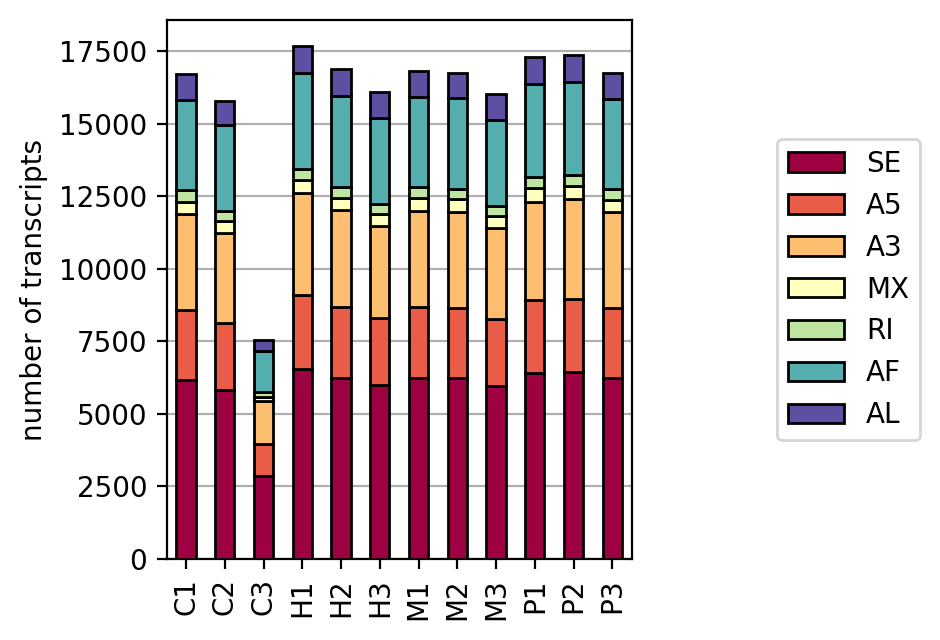

In [36]:
plot_df = pdf.copy()

# columns = [
#     'gene_name', 'transcript_name',
#     'transcript_type', 'uniprot',
#      'A3', 'A5', 'AF', 'AL', 'MX', 'RI', 'SE',
#     'Control', 'mmMYOD1', 'siPRRX1', 'siPRRX1/mmMYOD1',
# ]

columns_init = [
    'gene_name', 'transcript_name',
    'transcript_type', 'uniprot',
     'A3', 'A5', 'AF', 'AL', 'MX', 'RI', 'SE',
]

columns = columns_init + clusters

col_select = len(clusters)

plot_df = plot_df[columns]
plot_df = pd.melt(
    plot_df, id_vars=columns[:-col_select],
)

plot_df.head()

event_types = {
    'SE': 'skipping exon',
    'A5': "alternative 5' splice site",
    'A3': "alternative 3' splice site",
    'MX': 'mutually exclusive exon',
    'RI': 'retained intron',
    'AF': 'alternative first exon',
    'AL': 'alternative last exon',
}

results = []
for group_name, group in plot_df.groupby('variable'):
    group = group[group['transcript_type'] == 'protein_coding']
    group = group[group['uniprot'].notna()]

    row = {
        'group' : group_name,
    }

    for event_type, event_label in event_types.items():
        count = group[(group[event_type] == True) & (group['value'] > 0)]['transcript_name'].nunique()
        row[event_type] = count

    results.append(row)
    
results = pd.DataFrame(results)
results = results.set_index('group')
print(results.to_string())

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3.5
results.plot(
    kind='bar',
    stacked=True,
    ec='k',
    zorder=10,
    cmap='Spectral'
)

plt.grid(axis='y', zorder=0)
plt.xlabel("")
plt.ylabel("number of transcripts")
sns.move_legend(
    plt.gca(),
    loc='center right',
    title='',
    bbox_to_anchor=(1.65, 0.5)
)

In [38]:
pdf['transcript_type'].value_counts()

transcript_type
protein_coding                    30311
lncRNA                            10774
retained_intron                    7611
protein_coding_CDS_not_defined     5049
nonsense_mediated_decay            3636
non_stop_decay                       32
TEC                                  29
protein_coding_LoF                    5
TR_V_gene                             5
IG_V_gene                             2
IG_V_pseudogene                       1
TR_J_gene                             1
TR_C_gene                             1
IG_C_pseudogene                       1
TR_V_pseudogene                       1
Name: count, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'C1'),
  Text(1, 0, 'C2'),
  Text(2, 0, 'C3'),
  Text(3, 0, 'H1'),
  Text(4, 0, 'H2'),
  Text(5, 0, 'H3'),
  Text(6, 0, 'M1'),
  Text(7, 0, 'M2'),
  Text(8, 0, 'M3'),
  Text(9, 0, 'P1'),
  Text(10, 0, 'P2'),
  Text(11, 0, 'P3')])

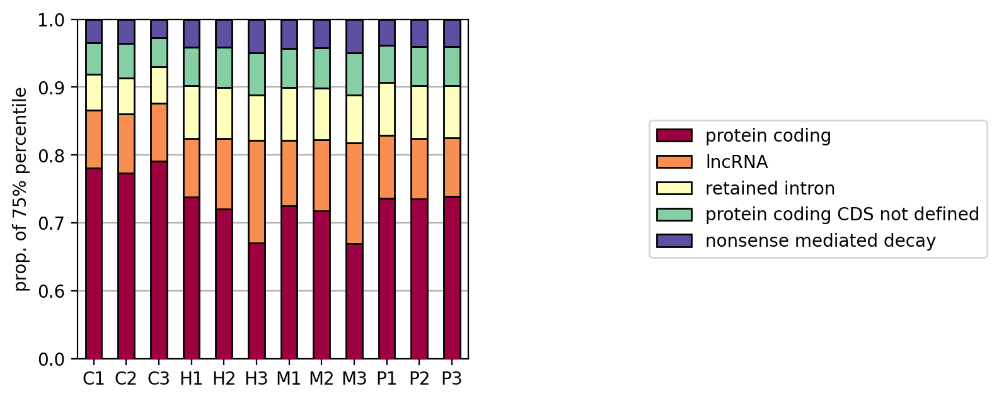

In [46]:
p = 0.75
# cols = ['Control', 'mmMYOD1', 'siPRRX1', 'siPRRX1/mmMYOD1']

keep = [
    'retained_intron',
    'protein_coding_CDS_not_defined',
    'lncRNA',
    'protein_coding',
    'nonsense_mediated_decay',
    # 'protein_coding_LoF',
]

proportions = {}
for col in clusters:
    thresh = pdf[col].quantile(p)
    mask   = (pdf[col] > thresh) & pdf['transcript_type'].isin(keep)
    cnts   = pdf.loc[mask, 'transcript_type'].value_counts(normalize=True)
    cnts.index = cnts.index.str.replace("_", " ")
    proportions[col] = cnts

result = pd.DataFrame(proportions).fillna(0)

# pick the order you want – here, descending in “initial”
order = result['C1'].sort_values(ascending=False).index

# reindex so the stacks plot in that order
result = result.loc[order]
result = result.loc[(result != 0).any(axis=1)]

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 3.5
result.T.plot(
    kind='bar',
    stacked=True,
    ec='k',
    zorder=10,
    cmap='Spectral',
)

plt.grid(axis='y', zorder=0)
sns.move_legend(
    plt.gca(),
    loc='center right',
    title='',
    bbox_to_anchor=(2.35, 0.5)
)
plt.ylabel(f'prop. of {int(p*100)}% percentile')
plt.ylim([0.5, 1])#1.005])

ax = plt.gca()
yticks = ax.get_yticks()
yticklabels = [f"{round(t, 3)}" for t in yticks]
yticklabels[0] = 0.0    # set lowest label manually
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)
plt.xticks(rotation=0)

# Dominance

In [47]:
def get_top(df, col):
    # Remove groups with any NaN
    mask = df.groupby('gene_name', observed=True)[col].transform(lambda x: x.isna().any())
    df_valid = df[~mask]

    # Get index of max value per group
    top_idx = df_valid.groupby('gene_name', observed=True)[col].idxmax()
    counts = df_valid.groupby('gene_name', observed=True)[col].apply(lambda x: (x == x.max()).sum())

    # Build mapping and drop ties
    top_map = df_valid.loc[top_idx, ['gene_name', 'transcript_name']].set_index('gene_name')['transcript_name']
    top_map[counts > 1] = np.nan

    return df['gene_name'].map(top_map)


cols = [x + '_pct' for x in clusters]

for col in cols:
    pdf[f'{col}_top'] = get_top(pdf, col)

pdf.head()

,transcript_name,C1,C2,C3,H1,H3,H2,M1,M2,M3,...,C3_pct_top,H1_pct_top,H2_pct_top,H3_pct_top,M1_pct_top,M2_pct_top,M3_pct_top,P1_pct_top,P2_pct_top,P3_pct_top
0,A1BG-203,8.0,1.0,0.0,8.0,1.0,4.0,1.0,2.0,3.0,...,A1BG-204,A1BG-204,A1BG-204,A1BG-204,A1BG-204,A1BG-204,A1BG-204,A1BG-204,A1BG-204,A1BG-204
1,A1BG-204,5573.0,636.0,24.0,997.0,206.0,446.0,363.0,388.0,181.0,...,A1BG-204,A1BG-204,A1BG-204,A1BG-204,A1BG-204,A1BG-204,A1BG-204,A1BG-204,A1BG-204,A1BG-204
2,A1BG-AS1-202,31.0,5.0,0.0,14.0,3.0,0.0,0.0,2.0,2.0,...,NaN,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-204,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209
3,A1BG-AS1-203,18.0,1.0,0.0,9.0,1.0,2.0,0.0,1.0,1.0,...,NaN,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-204,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209
4,A1BG-AS1-204,88.0,9.0,0.0,40.0,12.0,15.0,14.0,14.0,13.0,...,NaN,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-204,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1-209


In [53]:
def find_dominant_isoforms(
    plot_df: pd.DataFrame,
    clusters: list[str],
    require_protein_coding: bool = True,
    require_lcrna: bool = False,
    require_uniprot: bool = True,
    require_tf: bool = False
) -> pd.DataFrame:
    """
    Find genes where a transcript is dominant in exactly one group.

    Parameters
    ----------
    plot_df : pd.DataFrame
        Input dataframe with columns:
        - transcript_name
        - transcript_type
        - uniprot
        - is_tf (optional)
        - *_pct_top (for each cluster)
    clusters : list[str]
        List of cluster names (used to construct *_pct_top column names).
    require_protein_coding : bool, default=True
        If True, keep only protein_coding transcripts.
    require_uniprot : bool, default=True
        If True, keep only transcripts with UniProt mapping.
    require_tf : bool, default=False
        If True, keep only transcription factors (plot_df['is_tf'] == True).

    Returns
    -------
    results : pd.DataFrame
        Columns:
        - gene_name
        - group (cluster where it's dominant)
    """
    top_cols = [x + '_pct_top' for x in clusters]
    results = []

    for column in top_cols:
        label = column.replace("_pct_top", "")
        other_columns = [c for c in top_cols if c != column]

        mask = (
            (plot_df['transcript_name'] == plot_df[column]) &
            (plot_df[other_columns].ne(plot_df[column], axis=0).all(axis=1))
        )

        if require_protein_coding:
            mask &= plot_df['transcript_type'] == 'protein_coding'
        if require_lcrna:
            mask &= plot_df['transcript_type'] == 'lncRNA'
        if require_uniprot:
            mask &= plot_df['uniprot'].notna()
        if require_tf and 'is_tf' in plot_df.columns:
            mask &= plot_df['is_tf']

        dominant_iso = plot_df[mask].copy()
        tmp = pd.DataFrame(dominant_iso['gene_name'].unique(), columns=['gene_name'])
        tmp['group'] = label
        results.append(tmp)

    if results:
        results = pd.concat(results, ignore_index=True)
    else:
        results = pd.DataFrame(columns=['gene_name', 'group'])

    return results

In [54]:
plot_df = pdf.copy()
# print(plot_df.columns)
# print()

# Remove mitochondrial and ribosomal genes
plot_df = plot_df[~plot_df['gene_name'].str.startswith("MT")]
plot_df = plot_df[~plot_df['gene_name'].str.startswith("RP")]

res_tfs = find_dominant_isoforms(plot_df, clusters, 
                                 require_protein_coding=True, 
                                 require_uniprot=True,
                                 require_tf=True)

print(f"TFs:\n{res_tfs.groupby('group')['gene_name'].nunique()}")

res_pc = find_dominant_isoforms(plot_df, clusters, 
                                 require_protein_coding=True, 
                                 require_uniprot=True,
                                 require_tf=False)

print(f"\nProtein-coding:\n{res_pc.groupby('group')['gene_name'].nunique()}")

res_lcrna = find_dominant_isoforms(plot_df, clusters, 
                                 require_protein_coding=False, 
                                 require_lcrna=True,
                                 require_uniprot=True,
                                 require_tf=False)

print(f"\nLncRNAs:\n{res_lcrna.groupby('group')['gene_name'].nunique()}")

res_all = find_dominant_isoforms(plot_df, clusters, 
                                 require_protein_coding=False, 
                                 require_uniprot=True,
                                 require_tf=False)

print(f"\nAll transcripts:\n{res_all.groupby('group')['gene_name'].nunique()}")

TFs:
group
C1    20
C2    25
C3    30
H1     1
H2     4
H3    14
M1     3
M2     7
M3    14
P1     7
P3     8
Name: gene_name, dtype: int64

Protein-coding:
group
C1    139
C2    104
C3    209
H1     22
H2     33
H3    114
M1     37
M2     49
M3    105
P1     33
P2     35
P3     50
Name: gene_name, dtype: int64

LncRNAs:
Series([], Name: gene_name, dtype: int64)

All transcripts:
group
C1    153
C2    124
C3    240
H1     28
H2     38
H3    137
M1     45
M2     59
M3    135
P1     36
P2     41
P3     57
Name: gene_name, dtype: int64


In [50]:
# plot_df = pdf.copy()
# print(plot_df.columns)
# print()

# plot_df = plot_df[~plot_df['gene_name'].str.startswith("MT")]
# plot_df = plot_df[~plot_df['gene_name'].str.startswith("RP")]

# # Drop rows where all _top values are the same (excluding NaN-only rows)
# # top_cols = ['Control_pct_top', 'mmMYOD1_pct_top', 
# #             'siPRRX1_pct_top', 'siPRRX1/mmMYOD1_pct_top']

# top_cols = [x + '_pct_top' for x in clusters]

# results = []

# for column in top_cols:
#     label = column.replace("_pct_top", "")
#     other_columns = top_cols.copy()
#     other_columns.remove(column)
    
#     mask = (
#         plot_df['transcript_name'] == plot_df[column]) &\
#         (plot_df[other_columns].ne(plot_df[column], axis=0).all(axis=1)) &\
#         (plot_df['transcript_type'] == 'protein_coding') &\
#         (plot_df['uniprot'].notna()) #&\
#         # (plot_df['is_tf']
#         # )
        
    
#     dominant_iso = plot_df[mask].copy()
#     tmp = pd.DataFrame(dominant_iso['gene_name'].unique(), columns=['gene_name'])
#     tmp['group'] = label
#     results.append(tmp)

# results = pd.concat(results)
# print(results['group'].value_counts())

# results

Index(['transcript_name', 'C1', 'C2', 'C3', 'H1', 'H3', 'H2', 'M1', 'M2', 'M3',
       'P2', 'P1', 'P3', 'total_transcript', 'gene_name', 'gene_type',
       'transcript_type', 'is_tf', 'uniprot', 'A3', 'A5', 'AF', 'AL', 'MX',
       'RI', 'SE', 'num_events', 'n_isoforms', 'n_protiens', 'C1_sum',
       'C2_sum', 'C3_sum', 'H1_sum', 'H2_sum', 'H3_sum', 'M1_sum', 'M2_sum',
       'M3_sum', 'P1_sum', 'P2_sum', 'P3_sum', 'total_gene', 'C1_pct',
       'C2_pct', 'C3_pct', 'H1_pct', 'H2_pct', 'H3_pct', 'M1_pct', 'M2_pct',
       'M3_pct', 'P1_pct', 'P2_pct', 'P3_pct', 'C1_pct_top', 'C2_pct_top',
       'C3_pct_top', 'H1_pct_top', 'H2_pct_top', 'H3_pct_top', 'M1_pct_top',
       'M2_pct_top', 'M3_pct_top', 'P1_pct_top', 'P2_pct_top', 'P3_pct_top'],
      dtype='object')

group
C3    284
C1    184
H3    142
C2    137
M3    129
M2     63
P3     60
M1     56
P1     43
P2     39
H2     38
H1     25
Name: count, dtype: int64


,gene_name,group
0,ABLIM1,C1
1,ACBD5,C1
2,ADAMTS12,C1
3,AGBL5,C1
4,AHI1,C1
...,...,...
55,ZNF576,P3
56,ZNF578,P3
57,ZNF772,P3
58,ZNF808,P3


In [68]:
tmp1 = res_tfs[res_tfs['group'] == 'P3']
tmp1 = tmp1[~tmp1['gene_name'].str.startswith('Z')]
print(", ".join(tmp1['gene_name'].unique()))

CERS4, EXO5, KDM4C, TEAD4


23
FOXO3


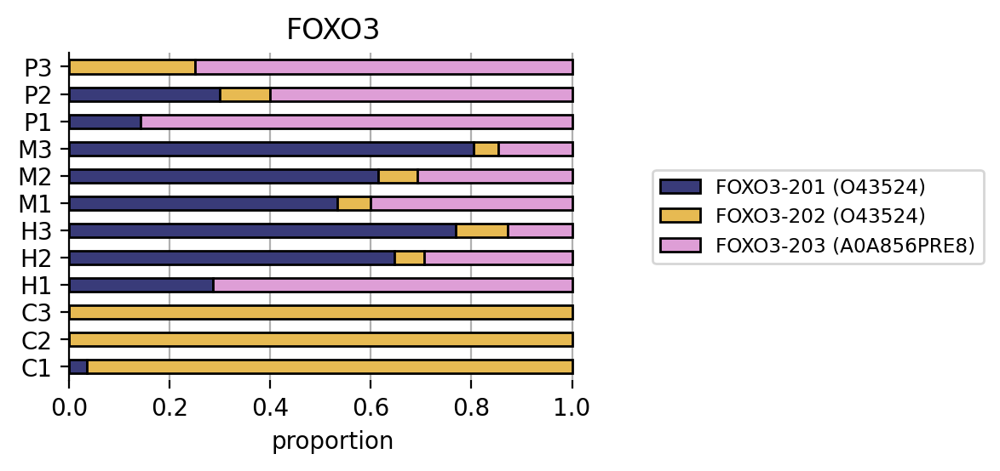

JUN


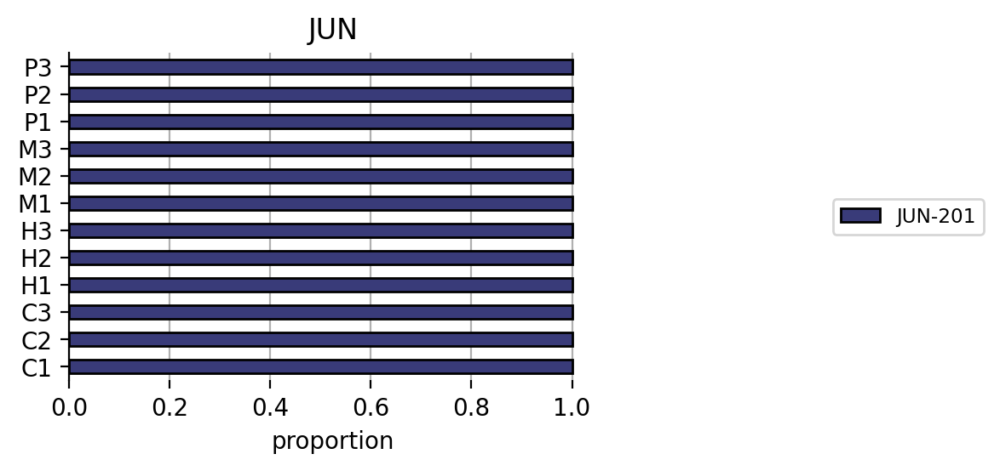

JUNB


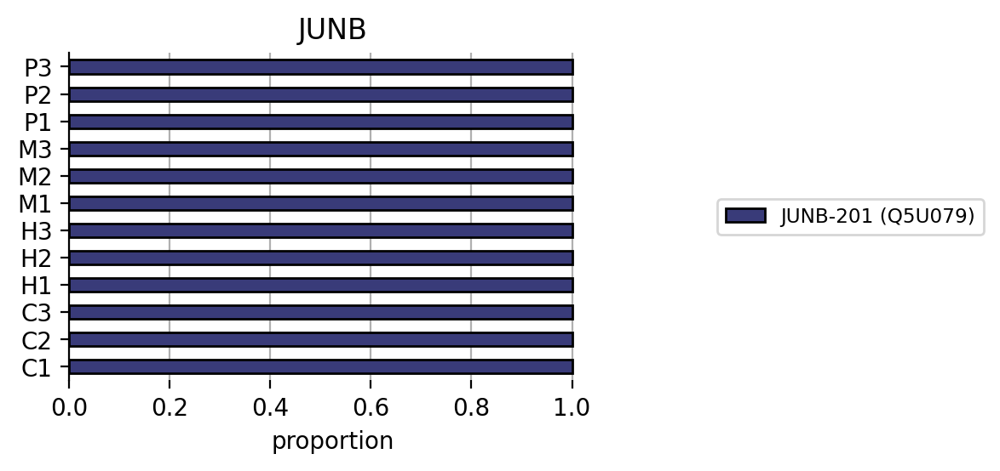

RUNX1


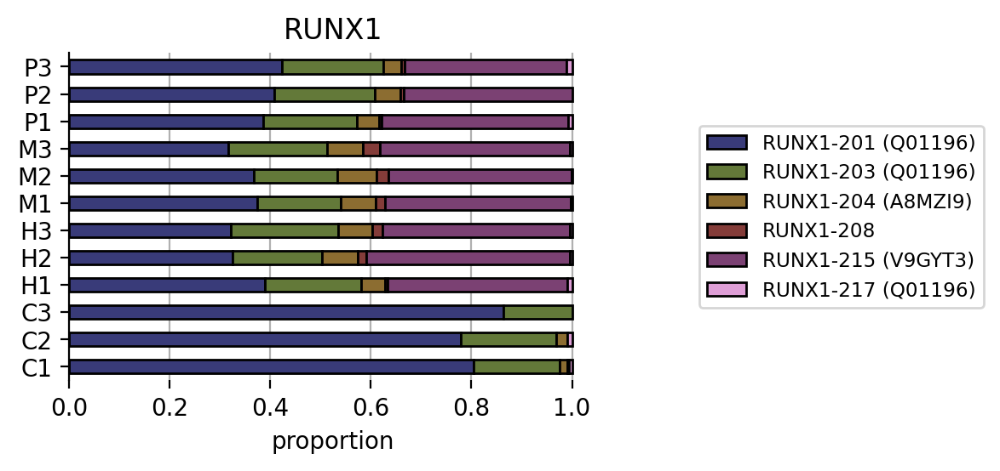

CDK6


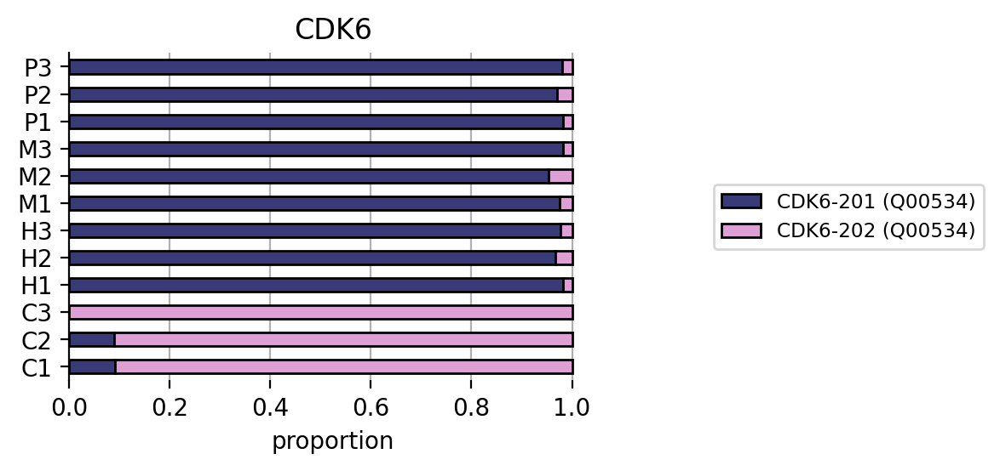

NUMB


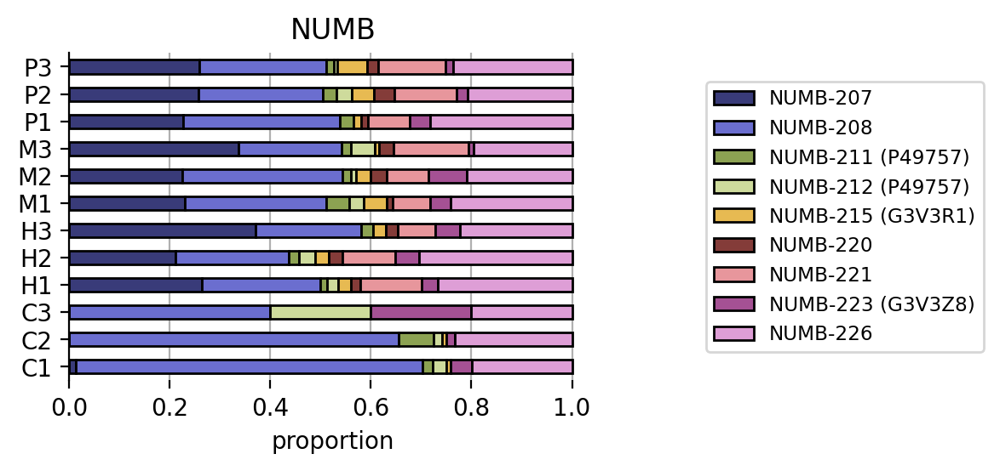

ATF3


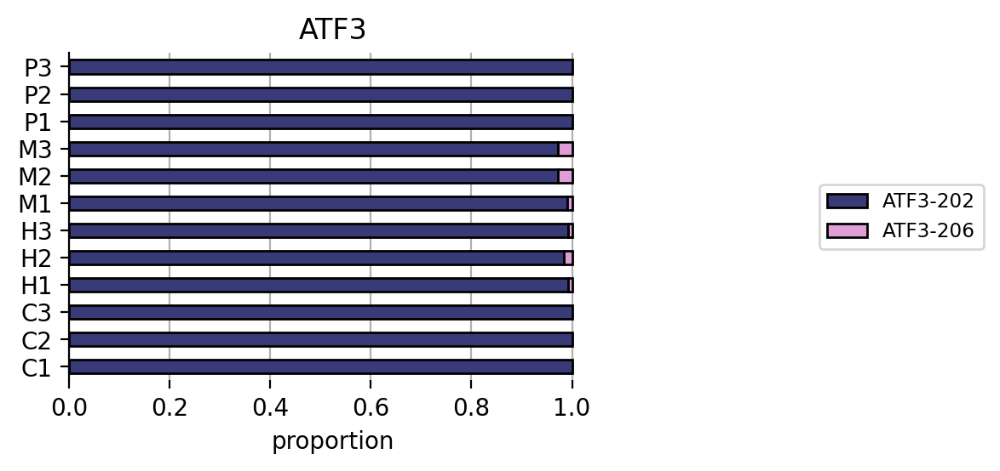

ATF4


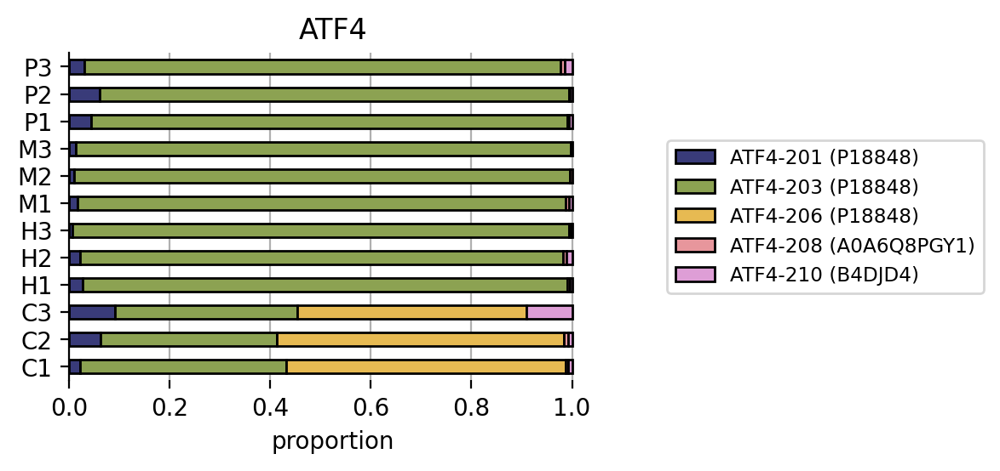

TWIST1


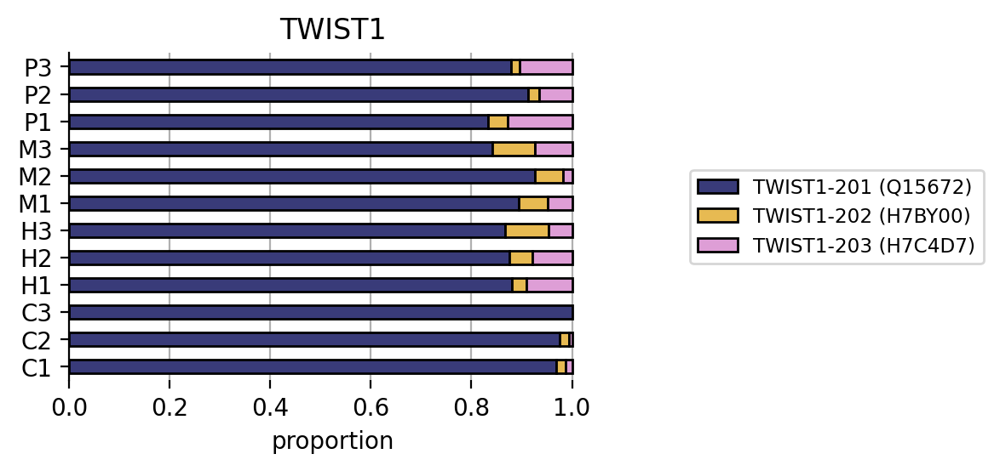

TWIST2


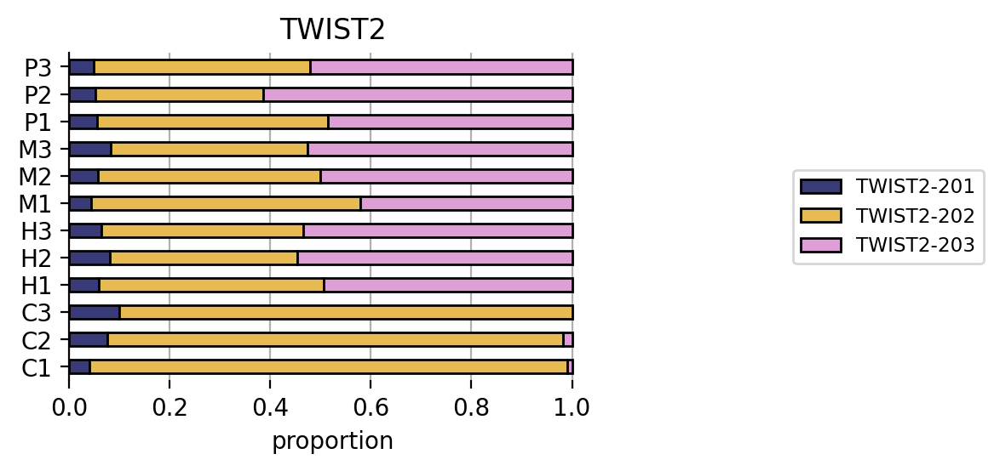

TP53


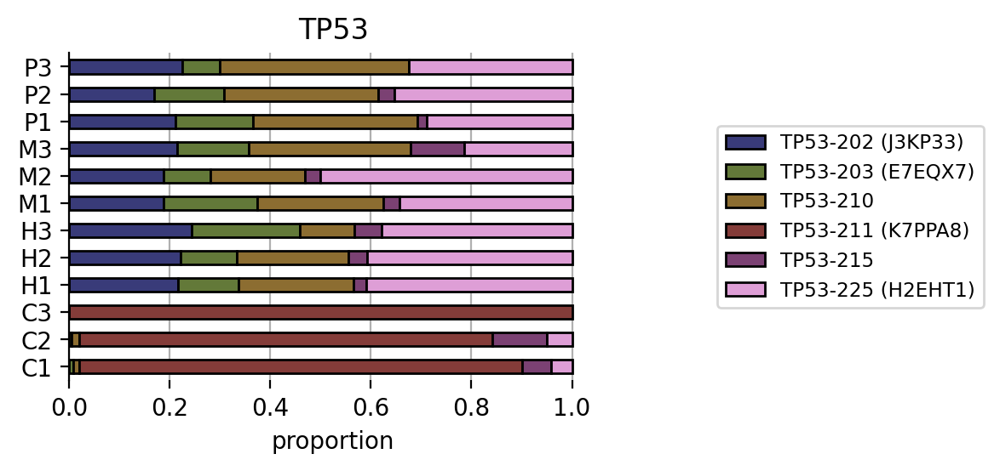

AKT1


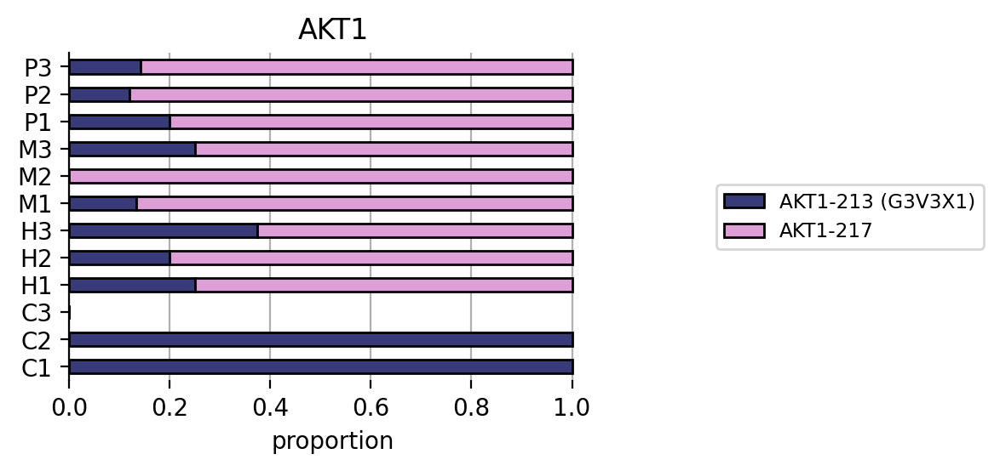

YWHAZ


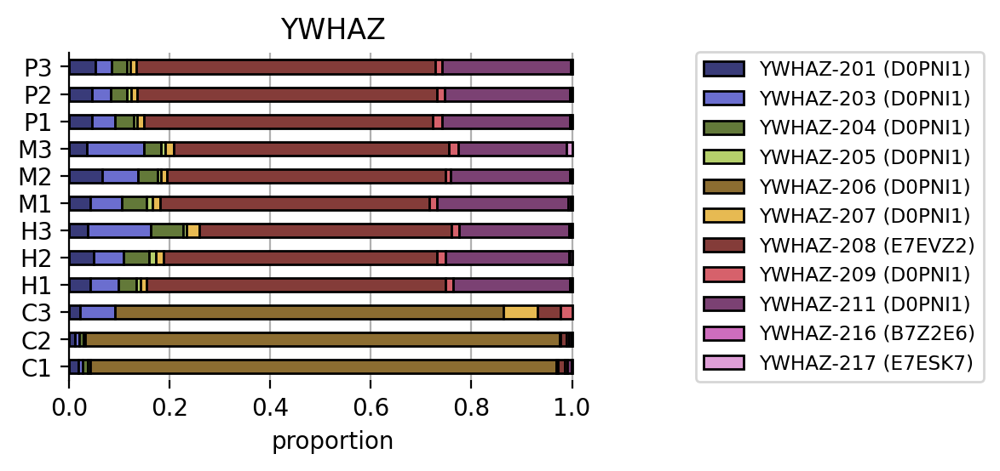

YWHAE


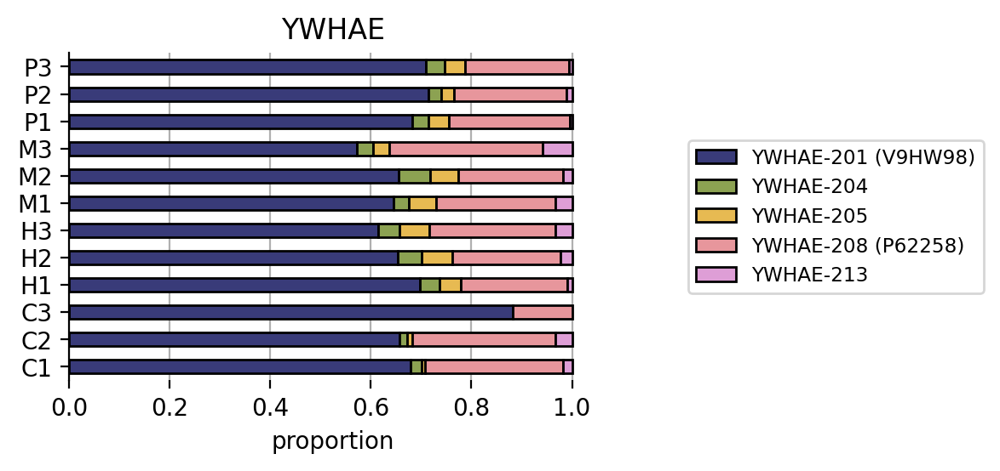

SRF


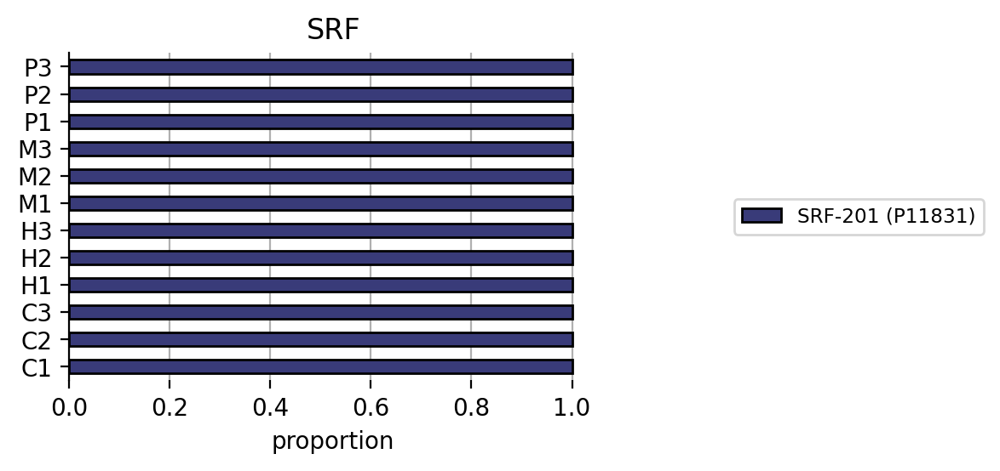

PBX1


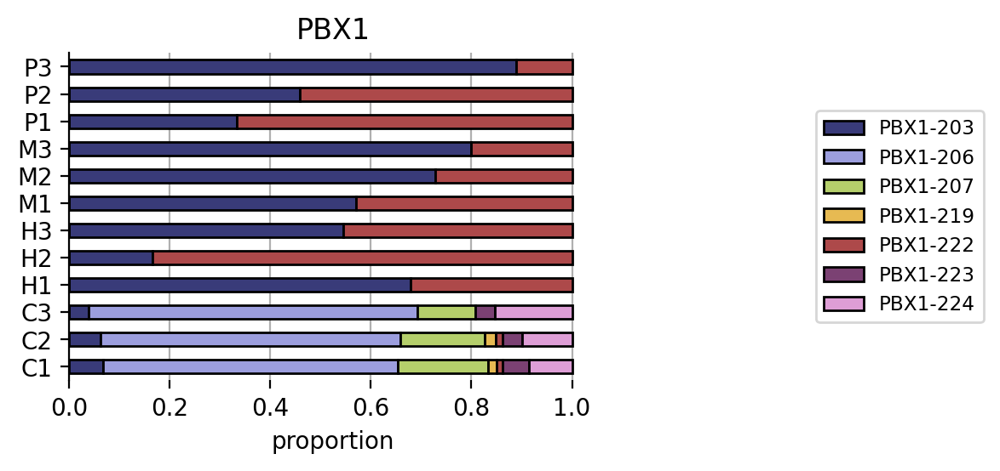

ID1


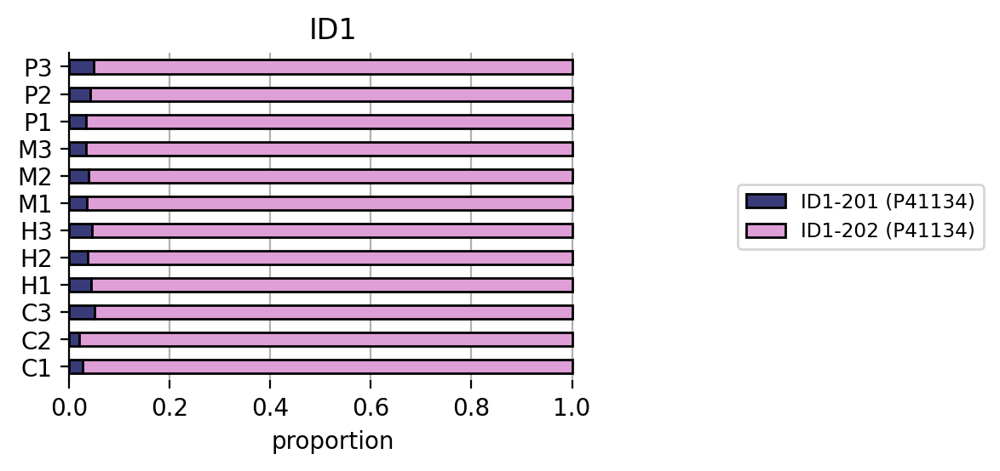

ID2


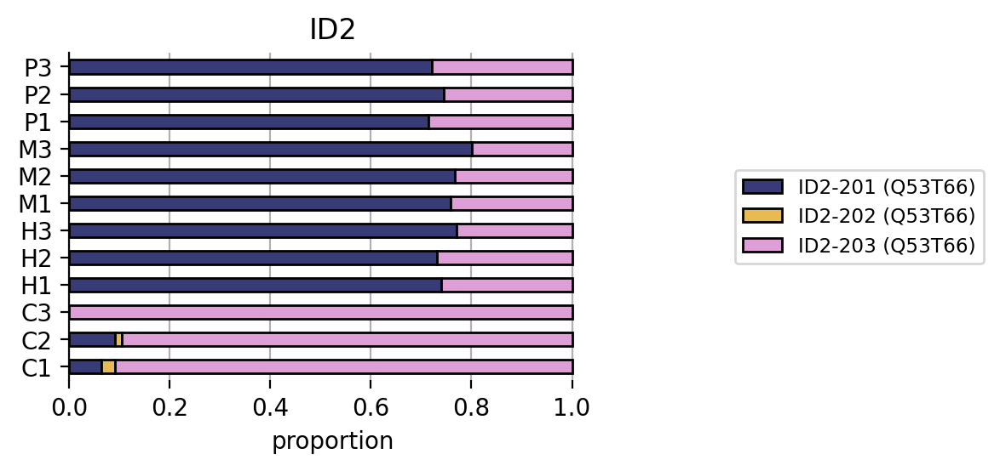

EP300


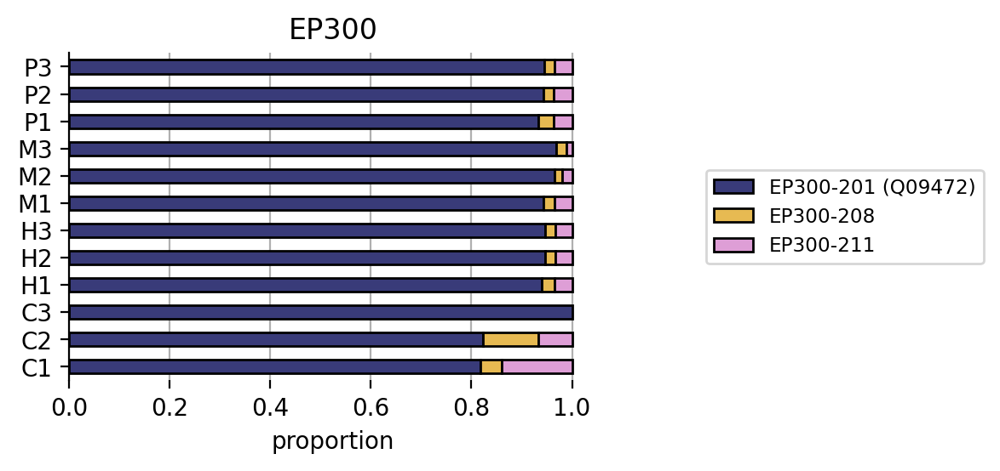

EID1


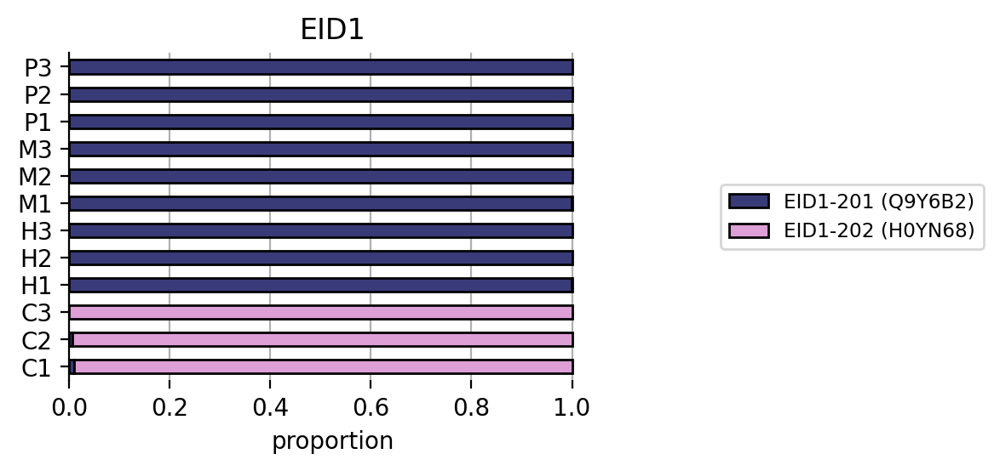

SMARCA4


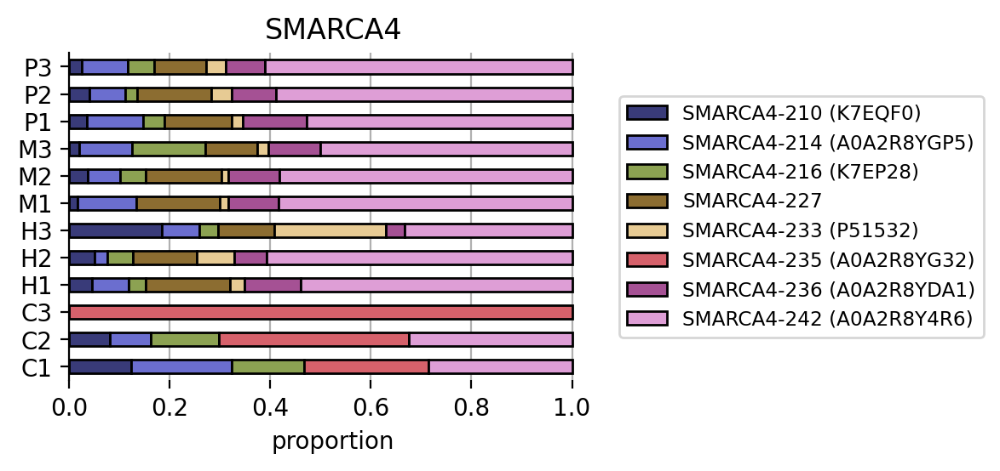

KAT2B


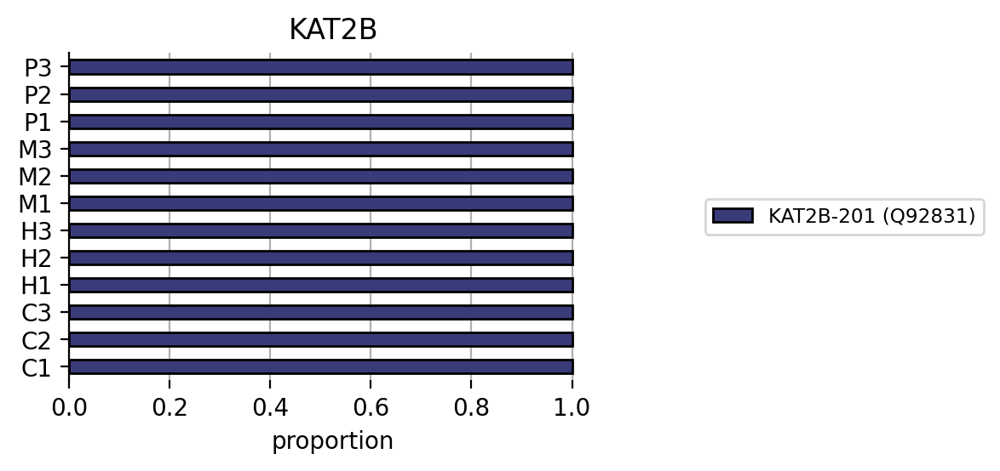

KAT5


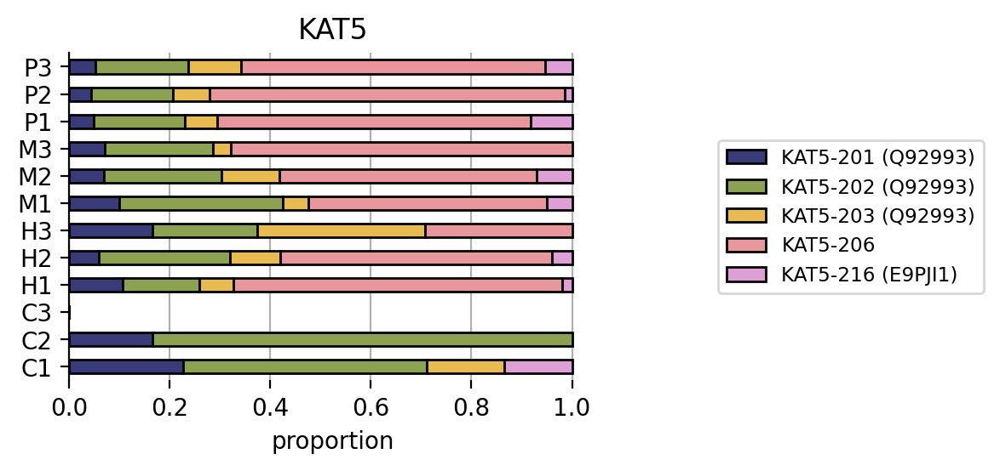

In [53]:
plot_df = pdf.copy()

genes_of_interest = [
    ### H3
    # 'SMARCA2', 'SMURF1', 'CDK11A', 'CCDC82', 'CCDC97', 'CCDC171', 'COL27A1', 'CPEB3', 'CSNK1E',
    # 'HDAC6', 'HNRNPF',
    ### M3
    # 'BMP4', 'CCNC', 'TSPAN4',
    ### P3
    # 'DYRK1A', 'ELN', 'SETD4', 'HOOK2', 'CDH13', 'LAMA3', 'ERN1',
    ### M2
    # 'CDC34', 'CNOT1', 'EIF2AK2', 'HNRNPH1', 'MAP2K6',  
    ### M1
    # 'BMP1', 'CCNL1', 'CHD3', 'COL10A1', 'CREBBP', 'DPF3', 'ETV2', 'PDGFRB', 
    ### P1
    # 'MAPK6', 'MAPK10', 'PTK2', 'BEST3',
    
    'FOXO3', 'JUN', 'JUNB', 'RUNX1', 'CDK6', 'NUMB', 'ATF3', 'ATF4', 'TWIST1', 'TWIST2',
    'TP53', 'AKT1', 'YWHAZ', 'YWHAE', 'SRF', 'PBX1', 'ID1', 'ID2', 'EP300', 'EID1', 
    'SMARCA4', 'KAT2B', 'KAT5',
    
]

genes_of_interest = [g for g in genes_of_interest if g in plot_df['gene_name'].unique()]
print(len(genes_of_interest))

for gene in genes_of_interest:
    print(gene)

    gene_df = plot_df[plot_df['gene_name'] == gene].reset_index()

    # Option 1: using np.where
    gene_df['annotation'] = (
        gene_df['transcript_name']
        + np.where(
            gene_df['uniprot'].notna(),
            ' (' + gene_df['uniprot'] + ')',
            ''
        )
    )
    
    tmp = gene_df.set_index('annotation').copy()
    tmp = tmp[cols]
    tmp.columns = [x.replace("_pct", "") for x in tmp.columns]

    plt.rcParams['figure.dpi'] = 200
    plt.rcParams['figure.figsize'] = 4, 2.5

    # 1) Plot figure without legend
    fig1, ax1 = plt.subplots()
    tmp.T.plot(
        kind='barh',
        stacked=True,
        ec='k',
        zorder=10,
        width=0.5,
        cmap='tab20b',
        ax=ax1
    )
    ax1.grid(axis='x', zorder=0)
    ax1.set_xlabel("proportion")
    sns.move_legend(
        ax1,
        loc='center right',
        title="",
        bbox_to_anchor=(1.75, 0.5),
        fontsize='small',
    )
    ax1.set_title(gene)
    sns.despine(bottom=True)
    plt.show()

Index(['transcript_name', 'C1', 'C2', 'C3', 'H1', 'H3', 'H2', 'M1', 'M2', 'M3',
       'P2', 'P1', 'P3', 'total_transcript', 'gene_name', 'gene_type',
       'transcript_type', 'is_tf', 'uniprot', 'A3', 'A5', 'AF', 'AL', 'MX',
       'RI', 'SE', 'num_events', 'n_isoforms', 'n_protiens', 'C1_sum',
       'C2_sum', 'C3_sum', 'H1_sum', 'H2_sum', 'H3_sum', 'M1_sum', 'M2_sum',
       'M3_sum', 'P1_sum', 'P2_sum', 'P3_sum', 'total_gene', 'C1_pct',
       'C2_pct', 'C3_pct', 'H1_pct', 'H2_pct', 'H3_pct', 'M1_pct', 'M2_pct',
       'M3_pct', 'P1_pct', 'P2_pct', 'P3_pct', 'C1_pct_top', 'C2_pct_top',
       'C3_pct_top', 'H1_pct_top', 'H2_pct_top', 'H3_pct_top', 'M1_pct_top',
       'M2_pct_top', 'M3_pct_top', 'P1_pct_top', 'P2_pct_top', 'P3_pct_top'],
      dtype='object')

BANP


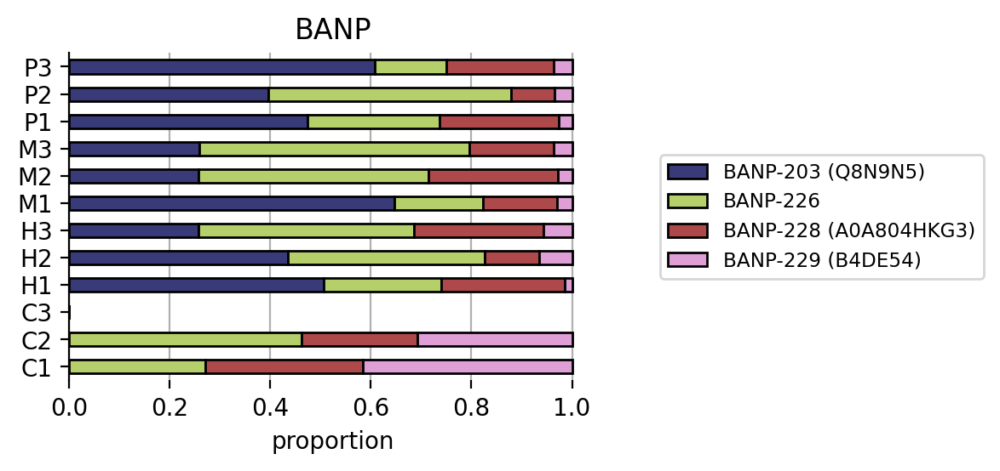

CBFA2T2


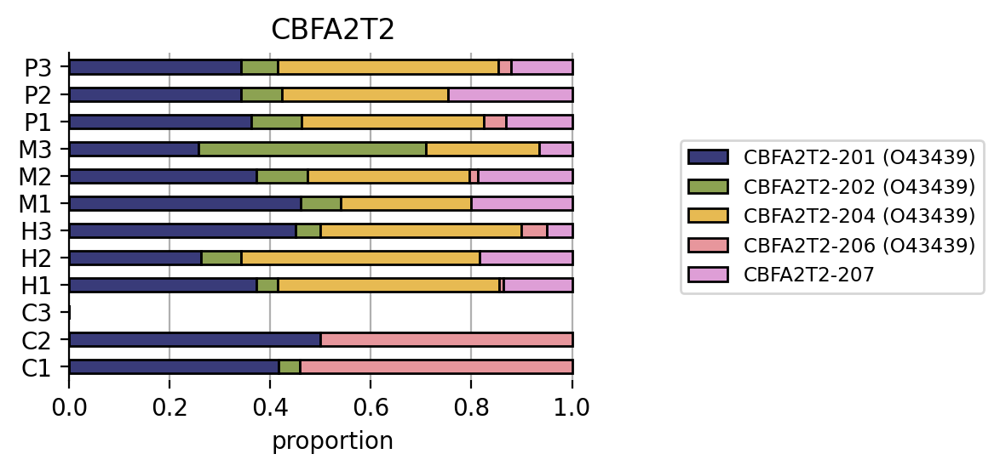

CTBP1


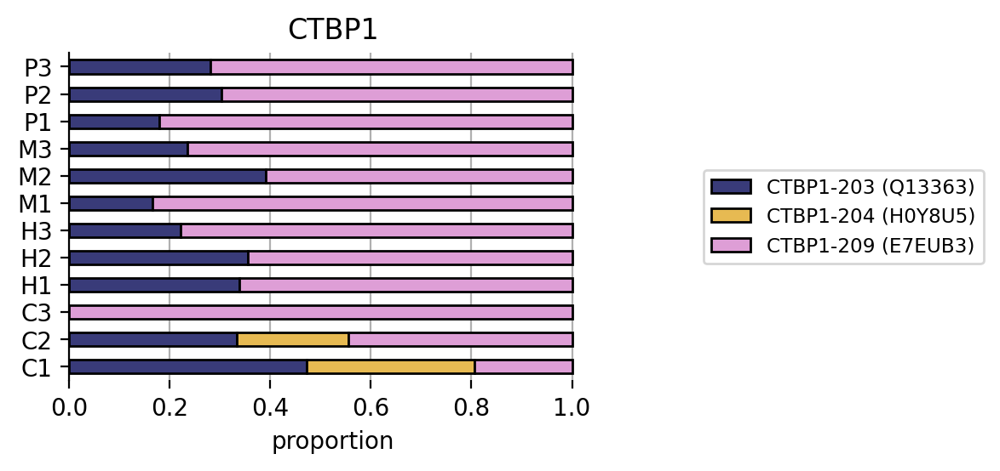

DGCR8


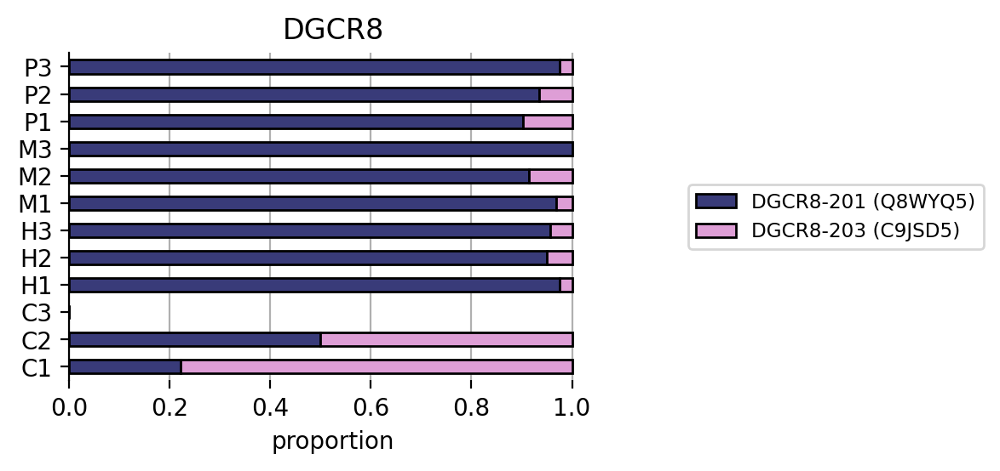

DNAJC21


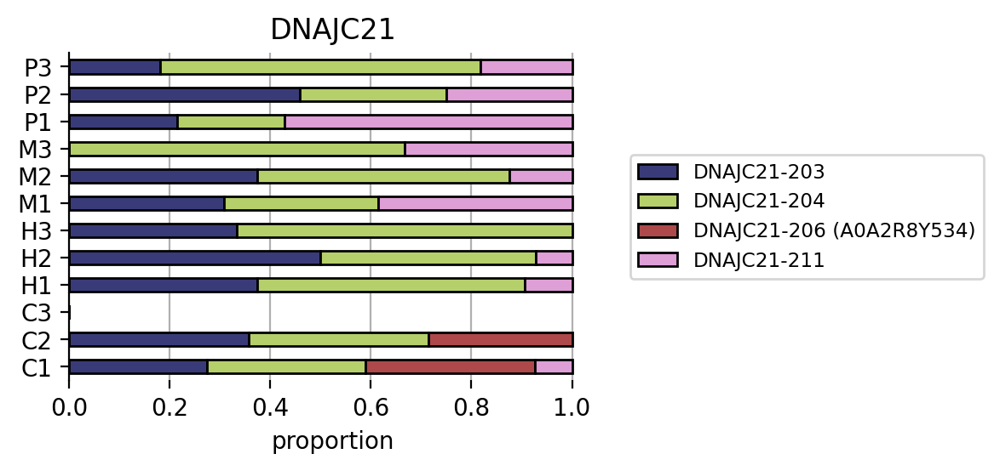

FIP1L1


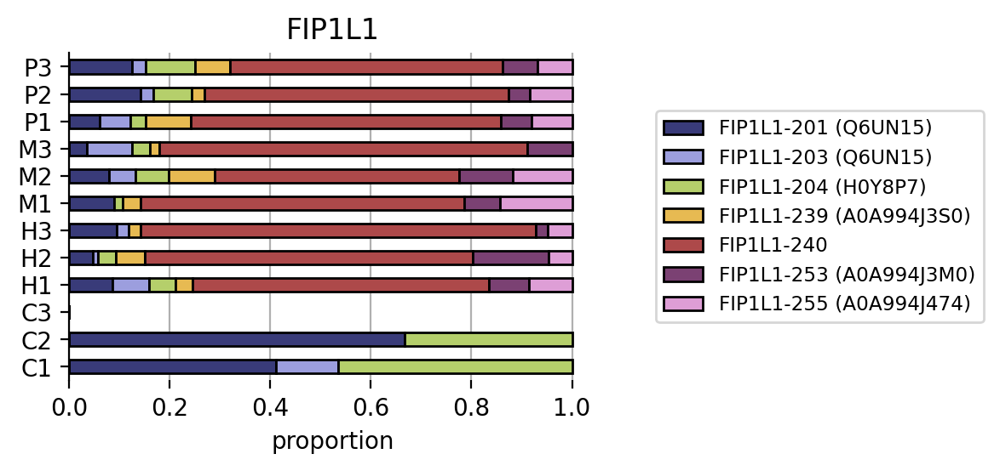

GABPB1


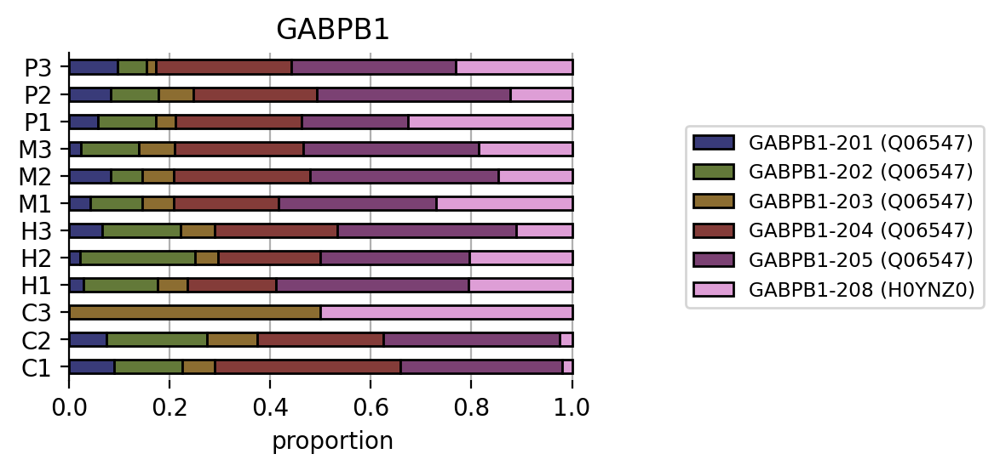

MEF2C


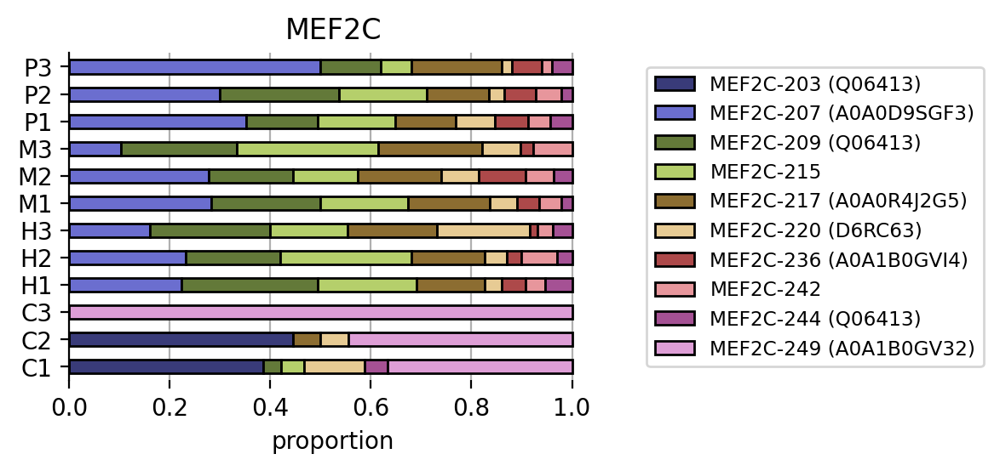

MRPS25


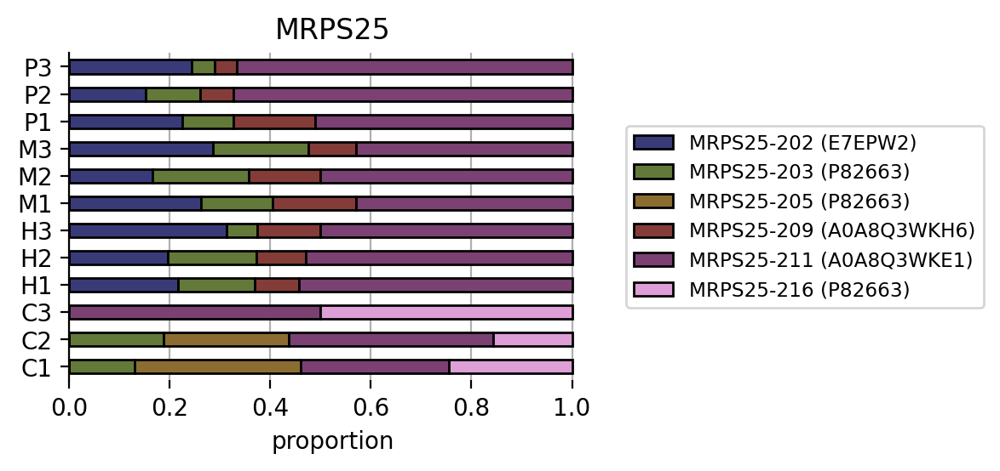

NR2C2


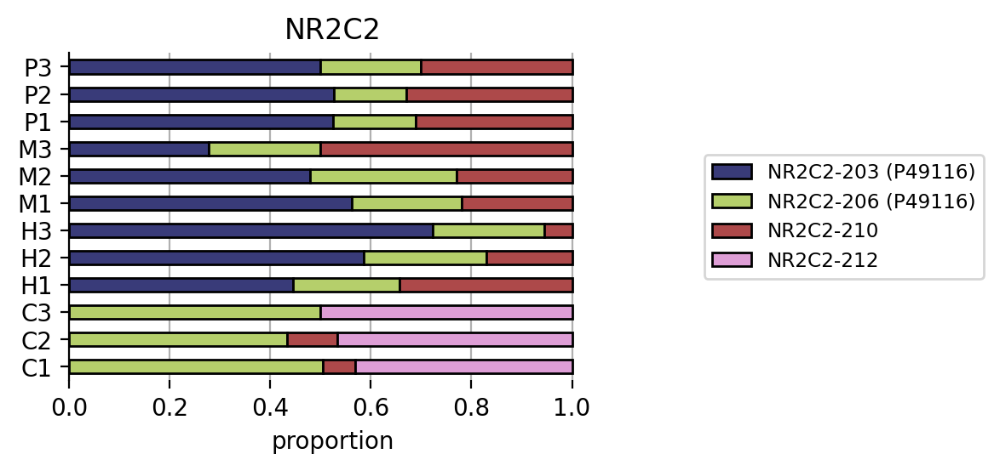

PPARD


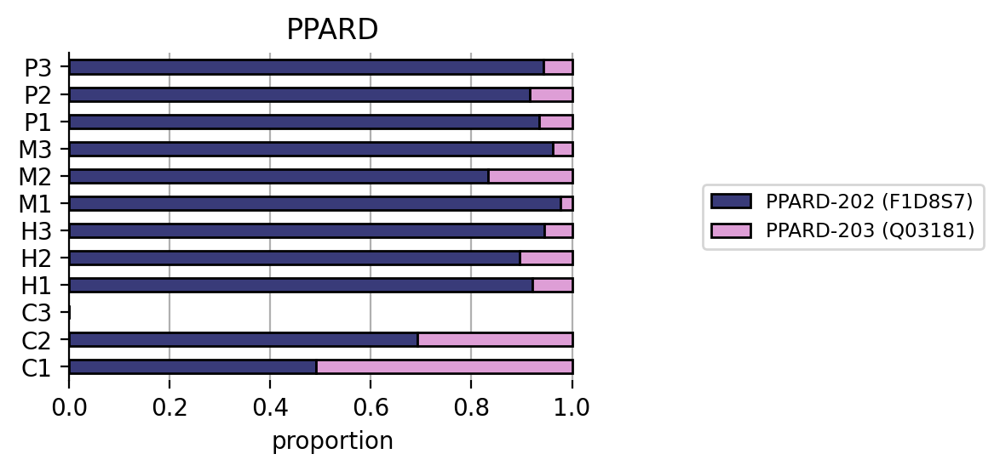

RORA


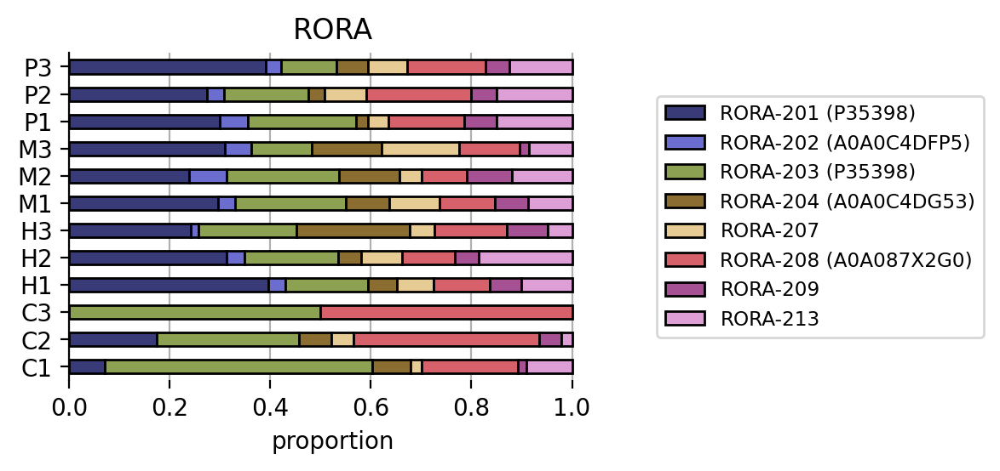

SHOX


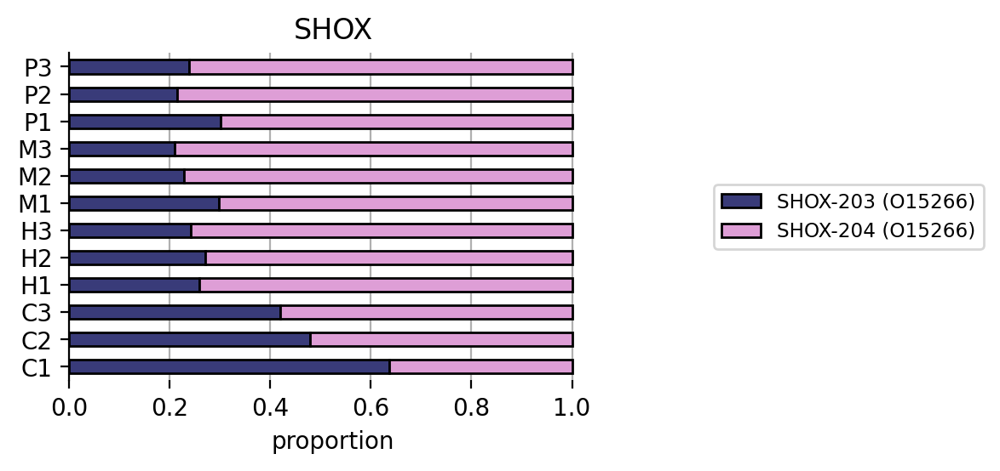

SMAD3


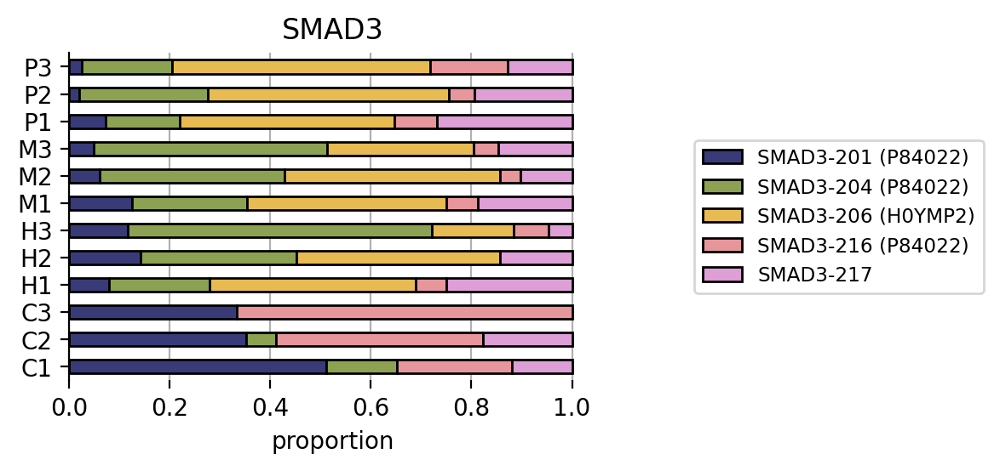

SOX6


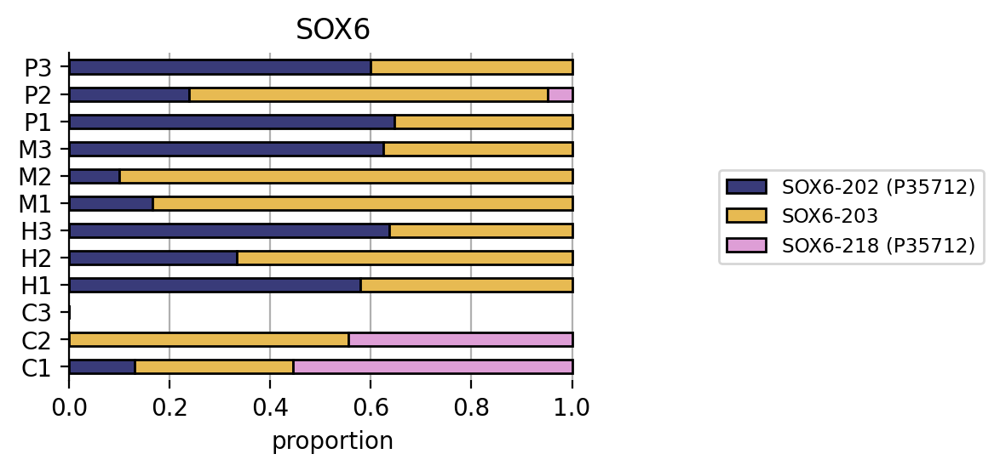

WRNIP1


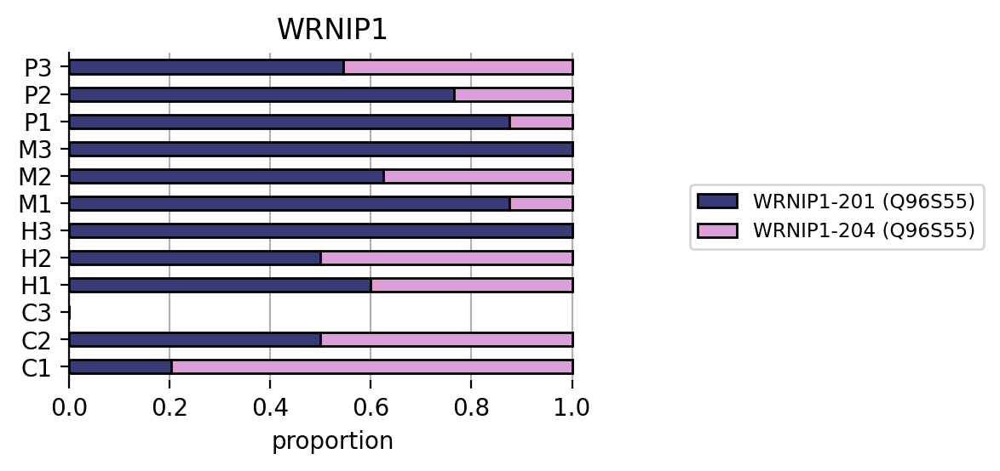

ZFX


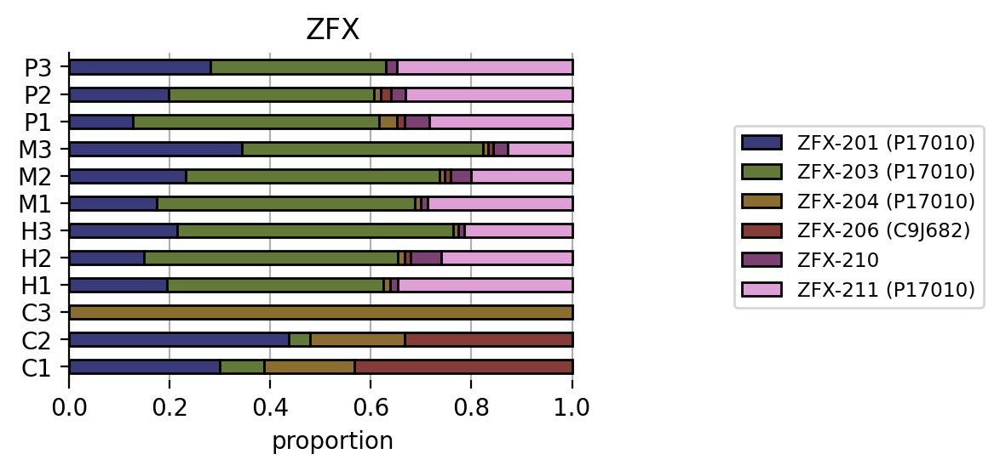

ZNF107


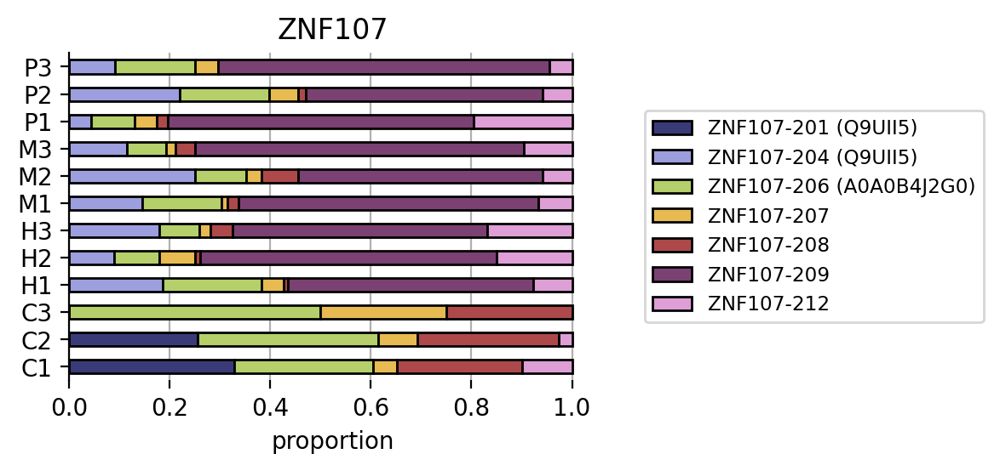

ZNF117


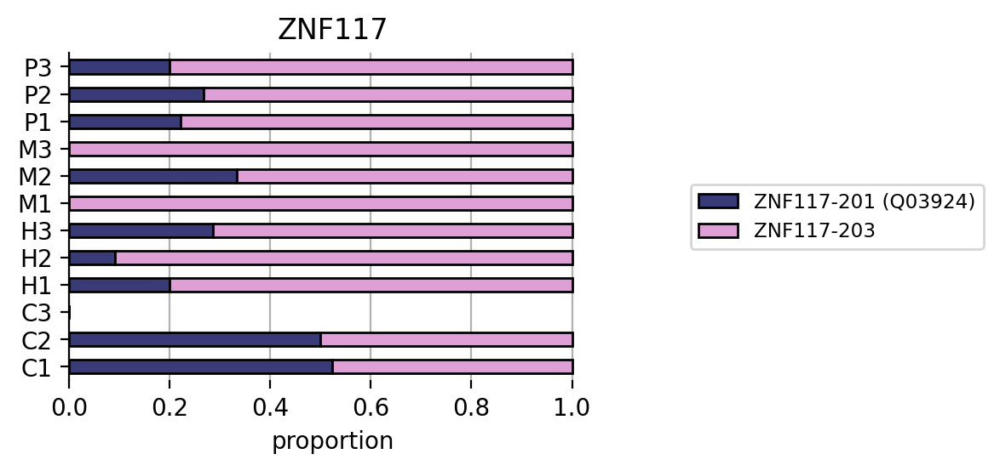

ZNF133


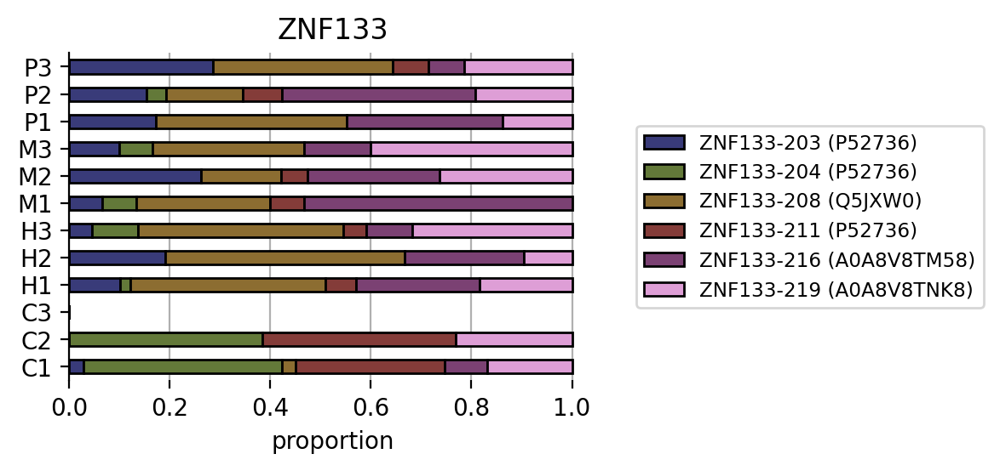

ZNF182


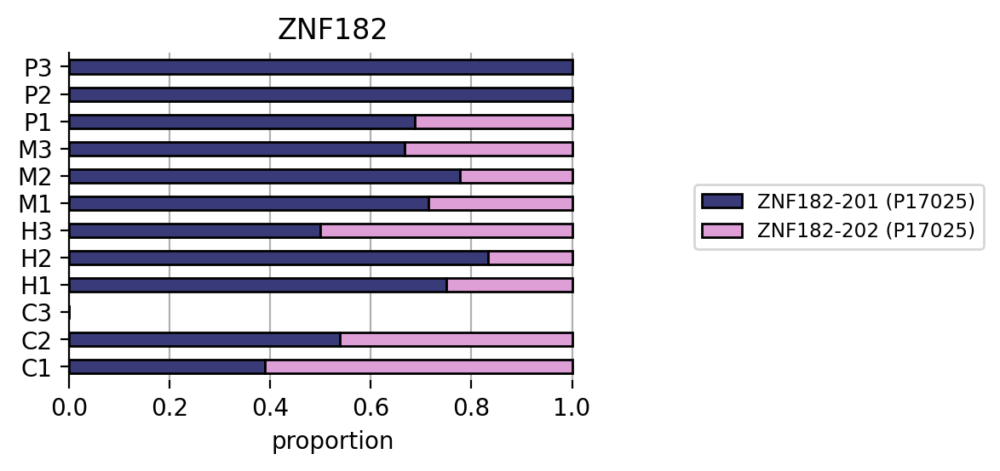

ZNF227


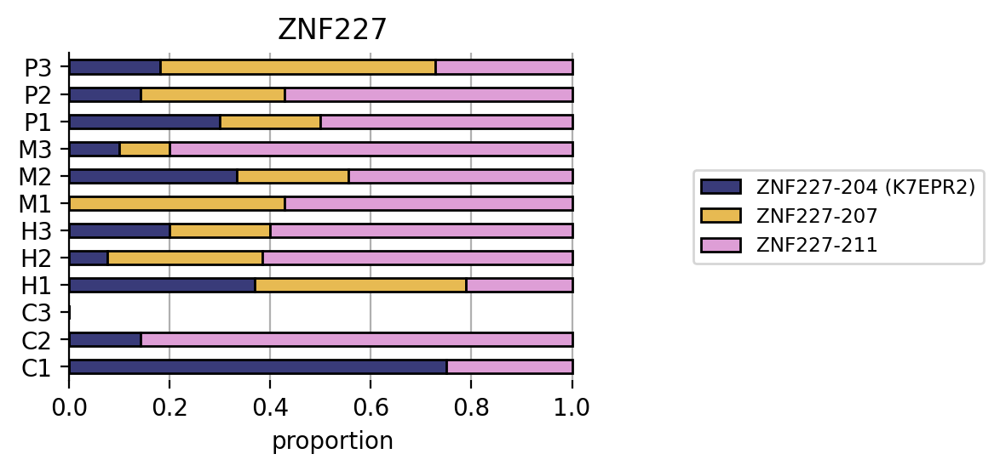

ZNF248


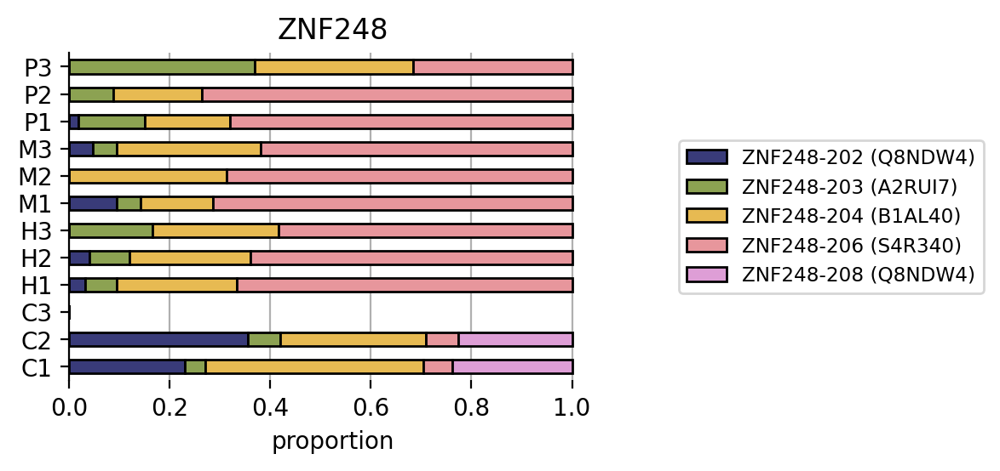

ZNF384


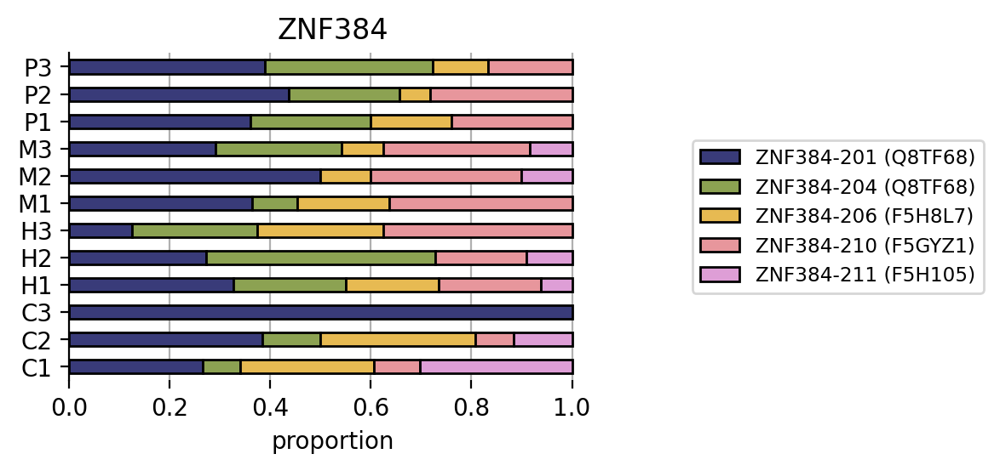

ZNF468


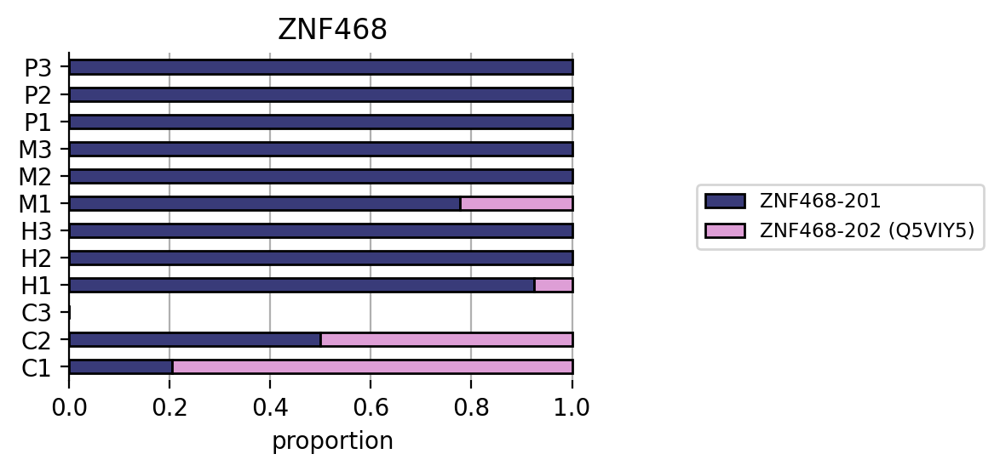

ZNF483


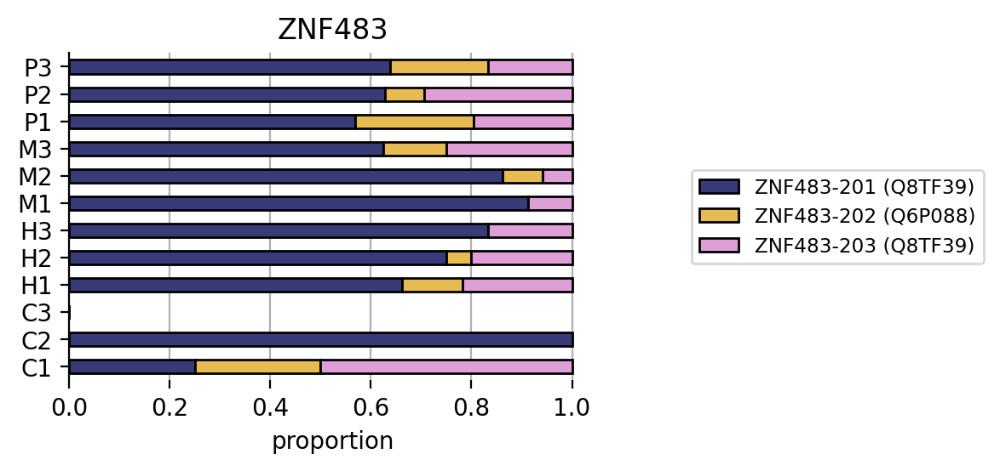

ZNF706


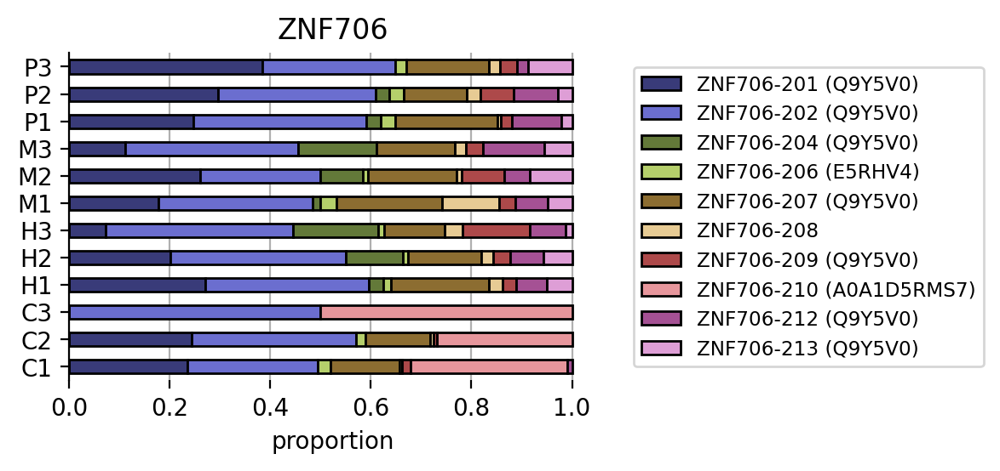

ZNF714


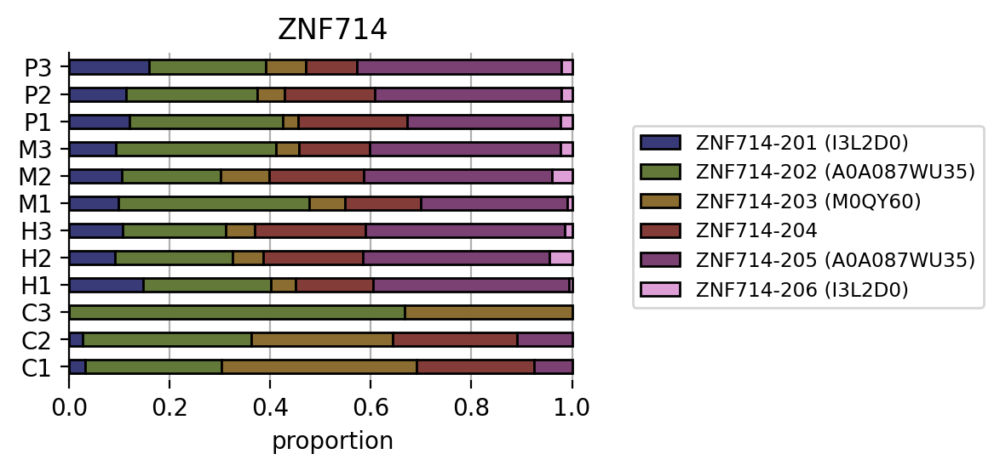

ZNF816


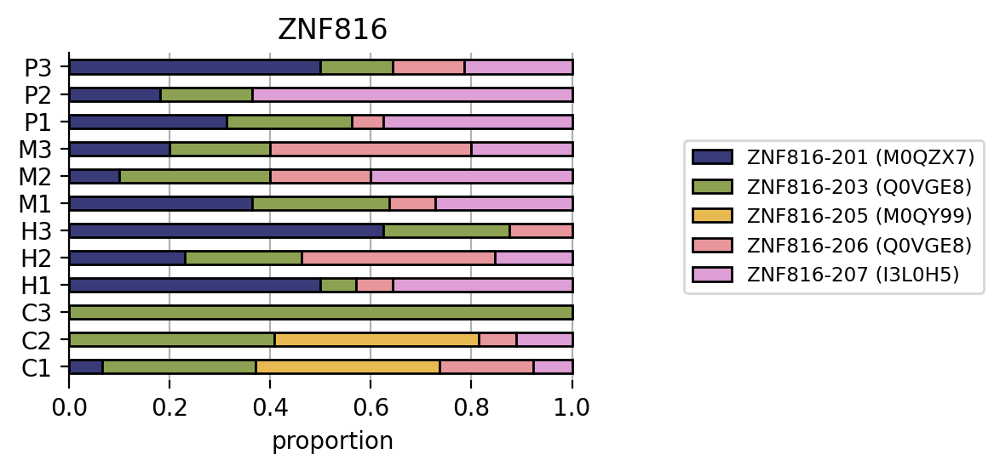

ASCC1


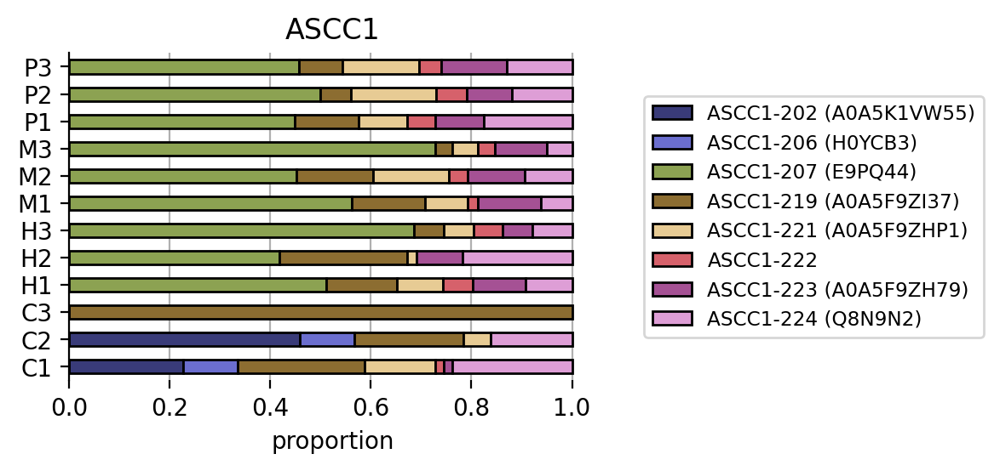

CLK1


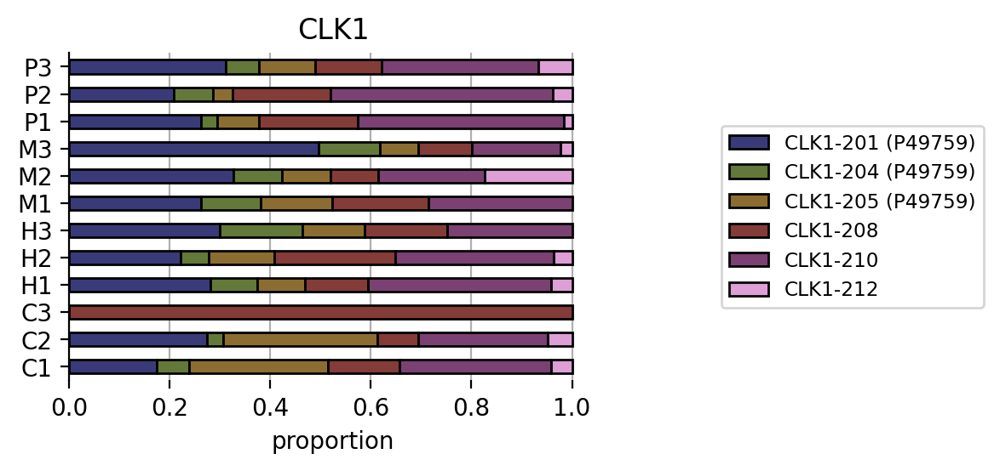

DEAF1


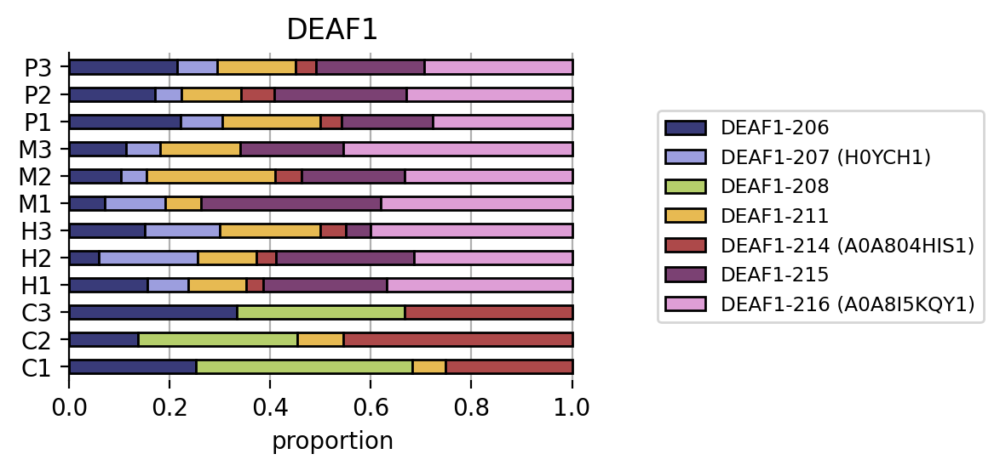

ETV7


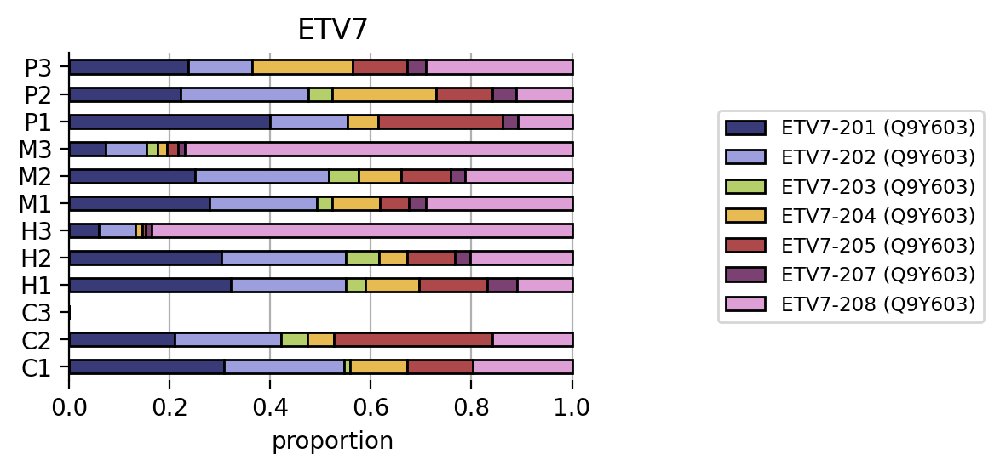

FIZ1


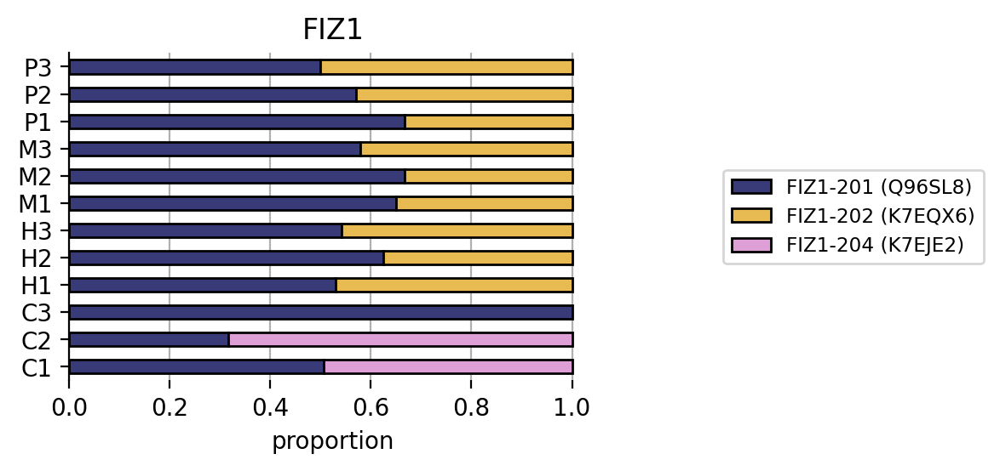

FOXN2


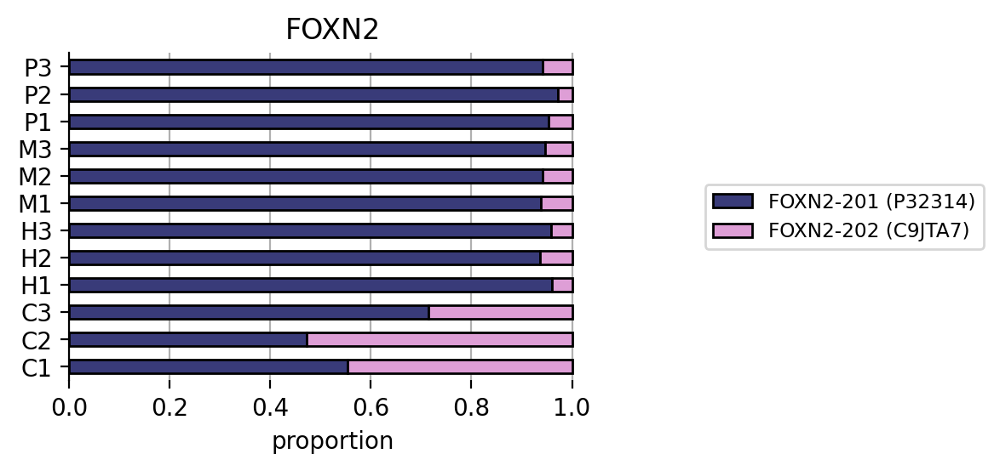

HIF1A


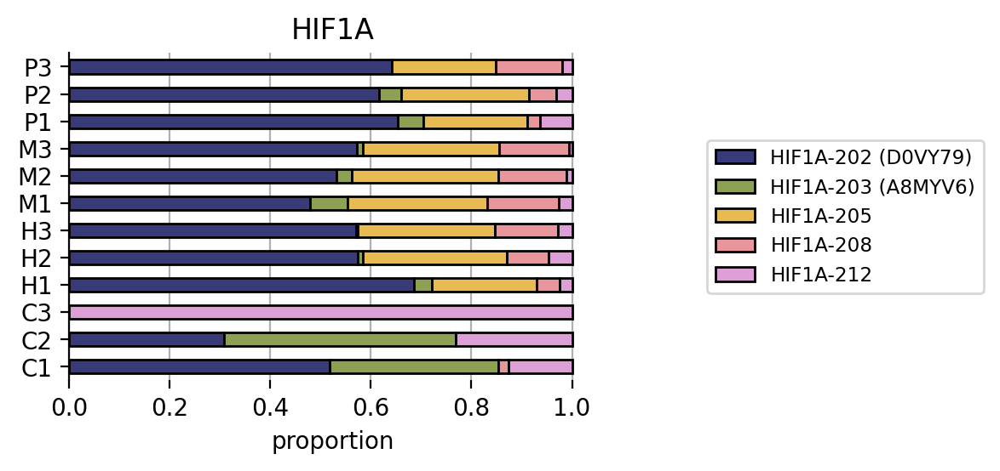

HNRNPA1


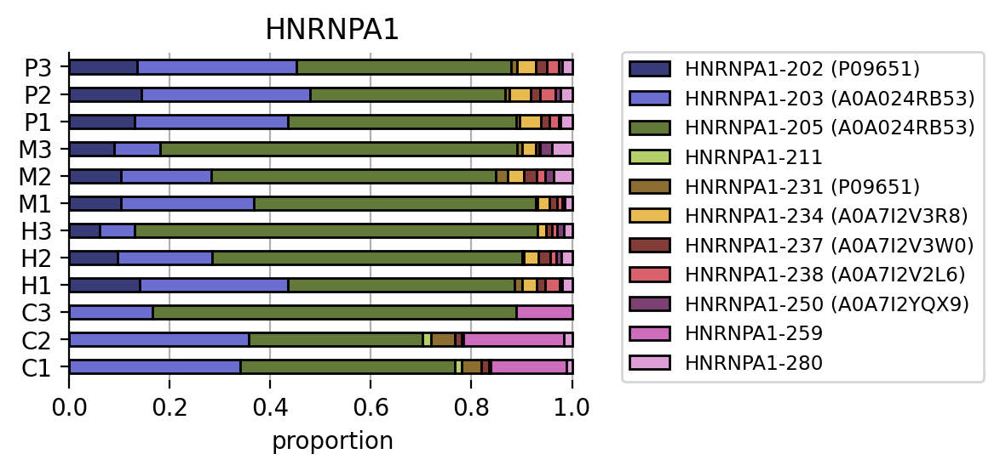

MBNL2


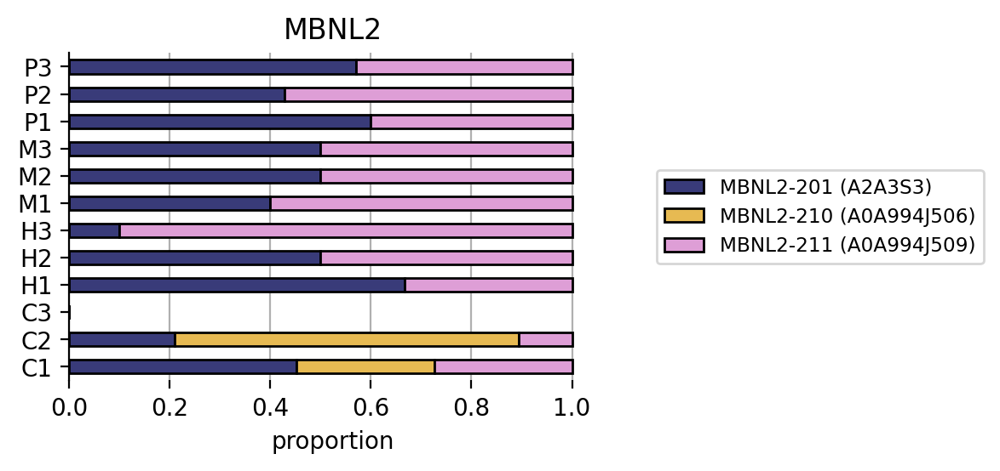

MRPL2


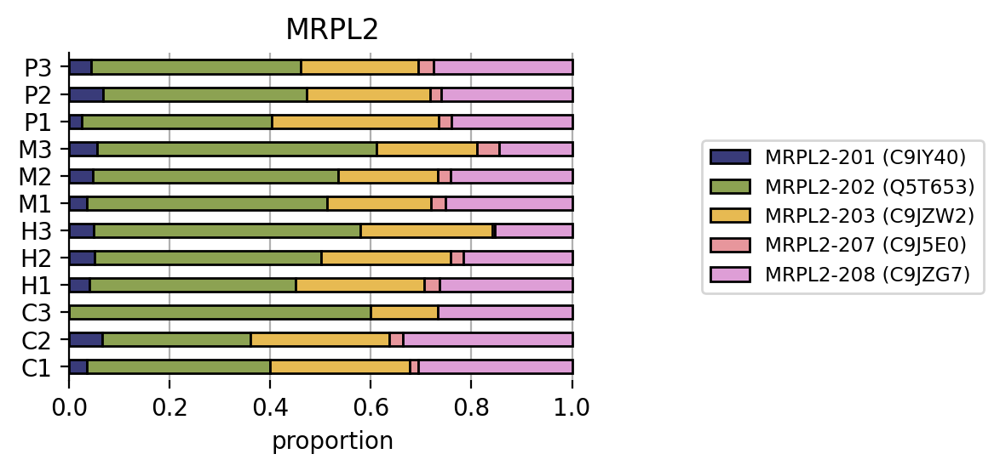

NOC2L


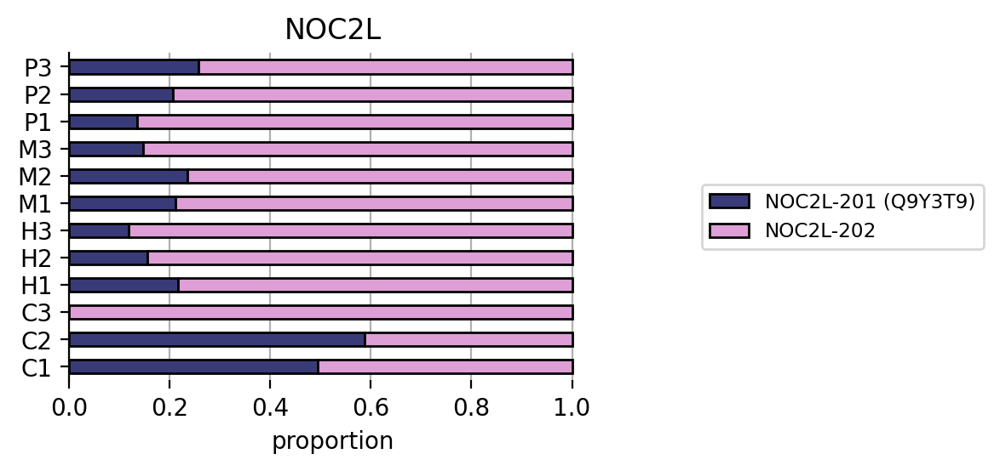

PAXIP1


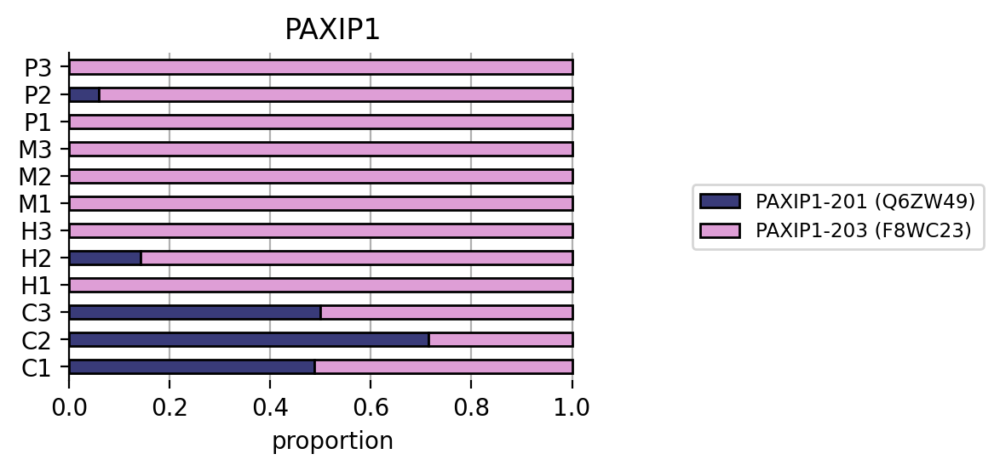

PRDM11


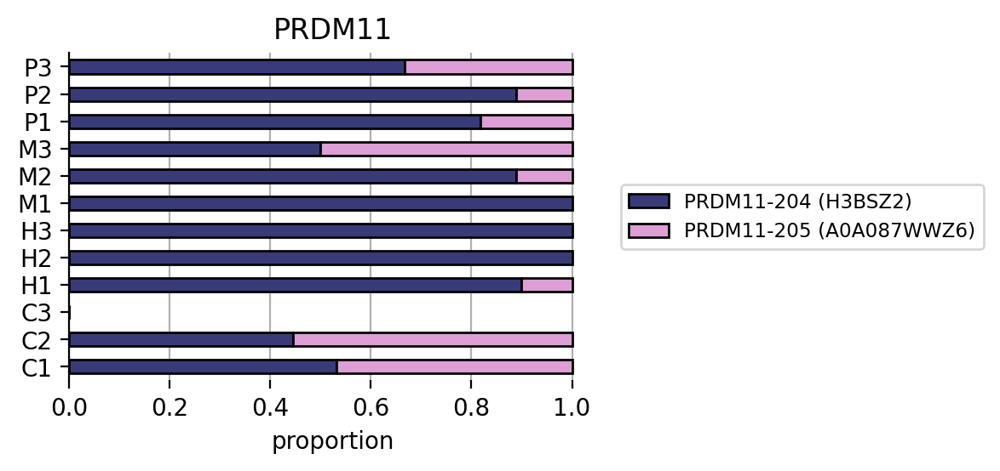

RBM7


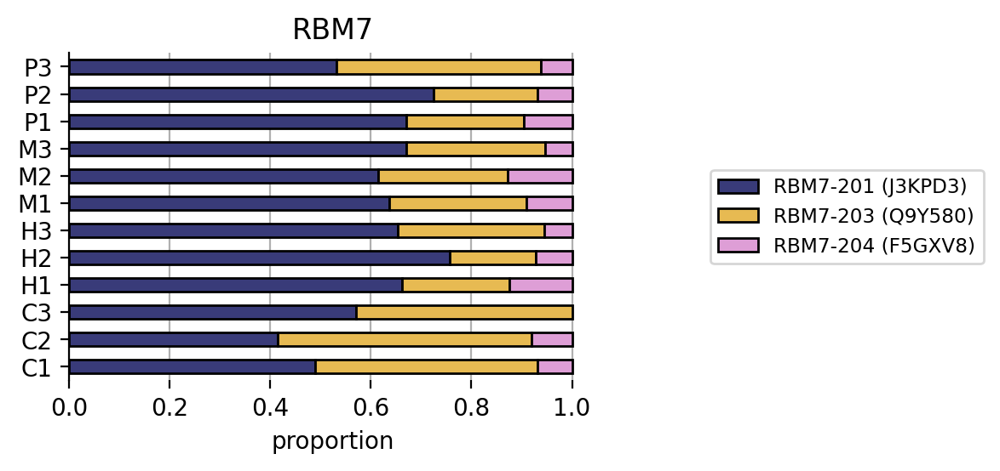

ZBTB48


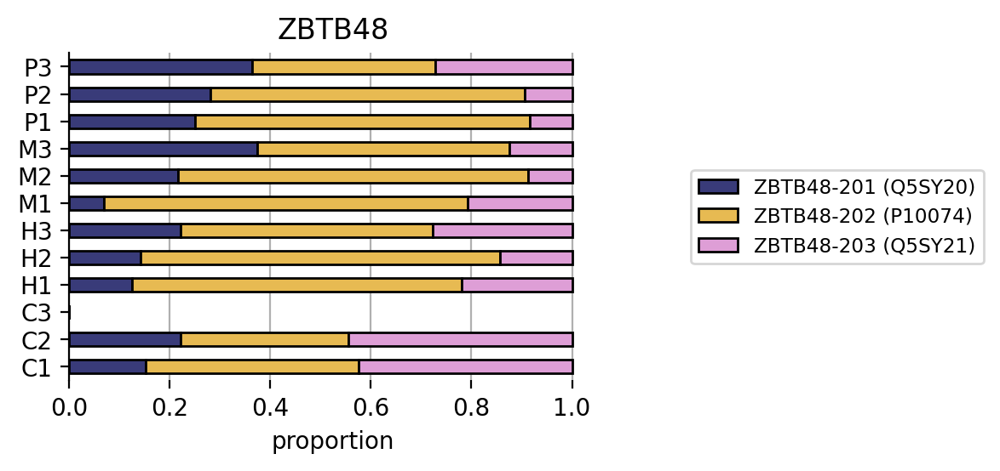

ZNF84


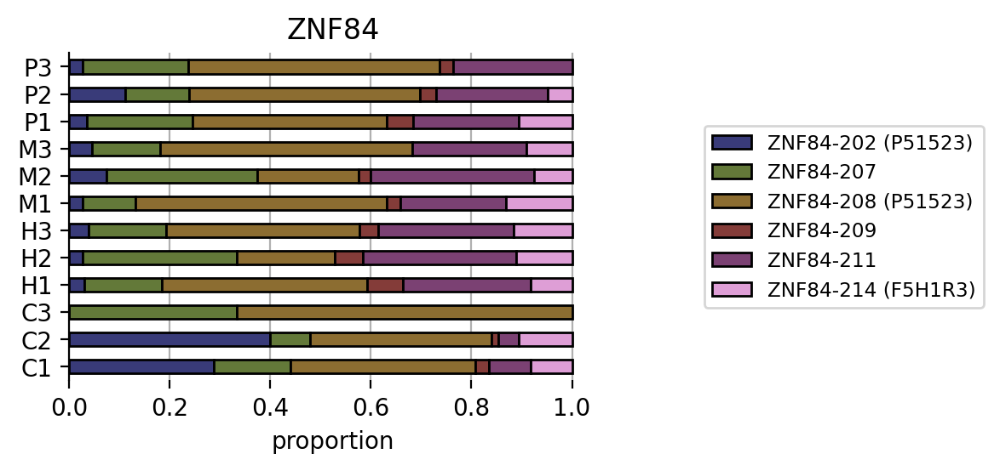

ZNF155


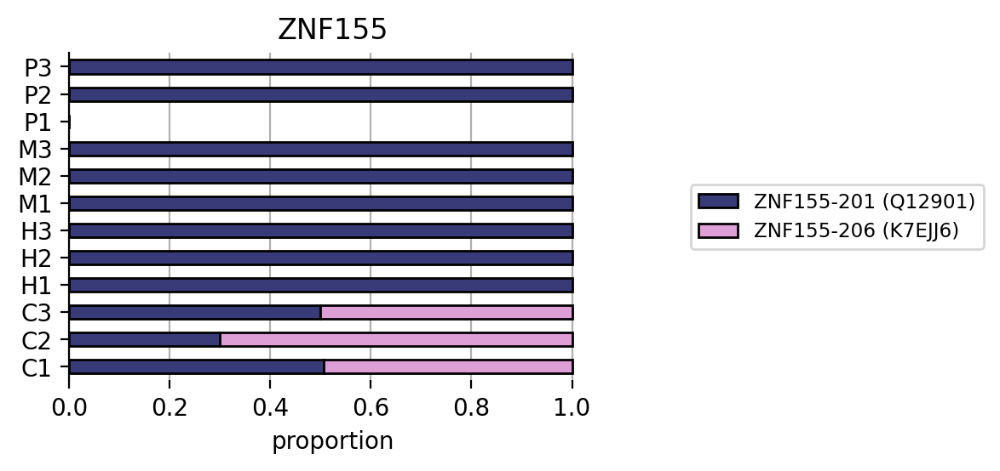

ZNF334


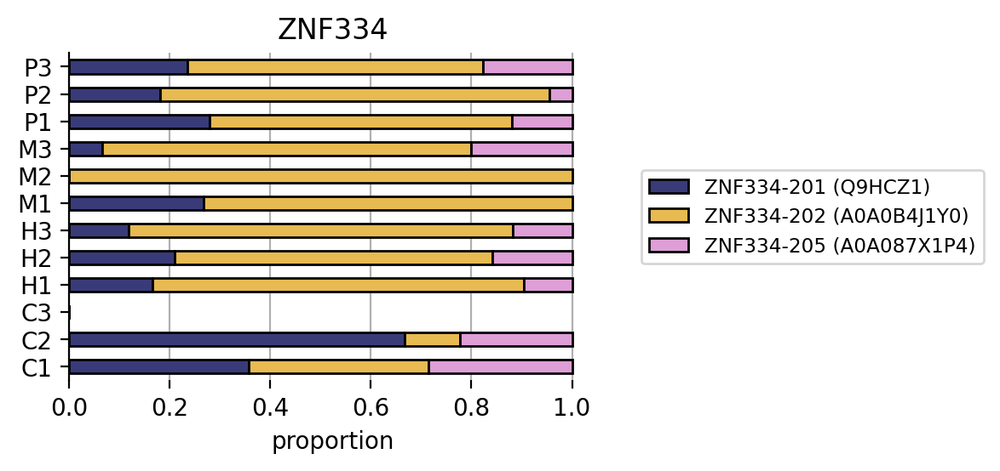

ZNF419


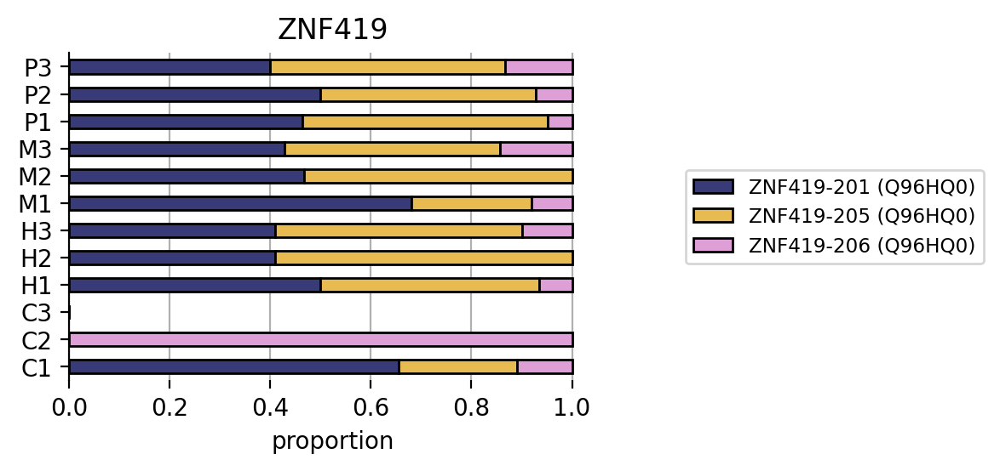

ZNF517


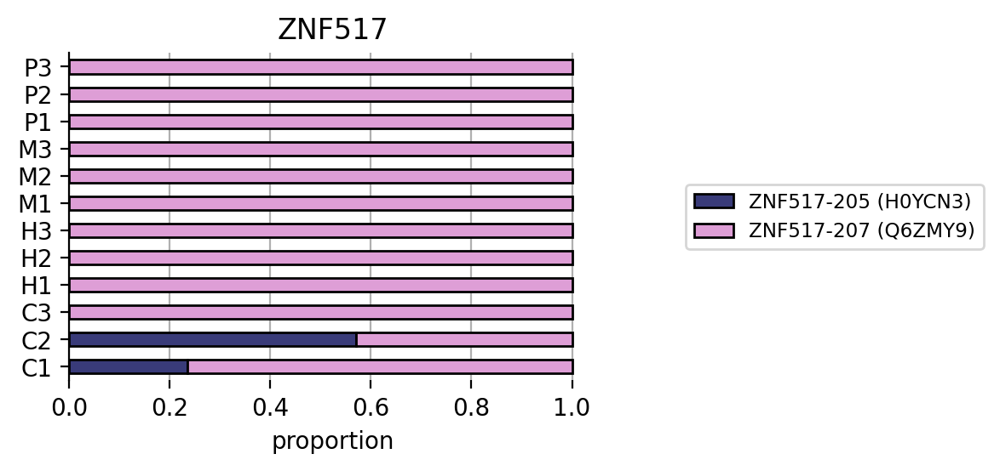

ZNF589


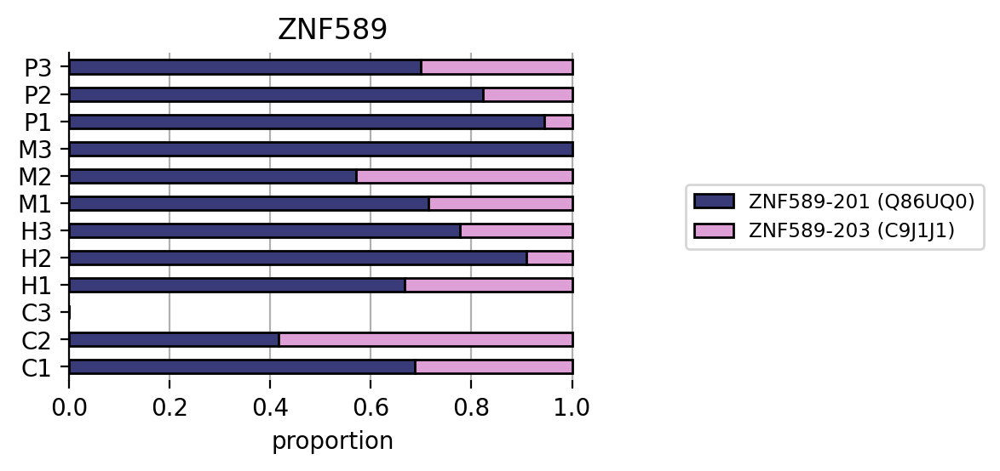

ZNF627


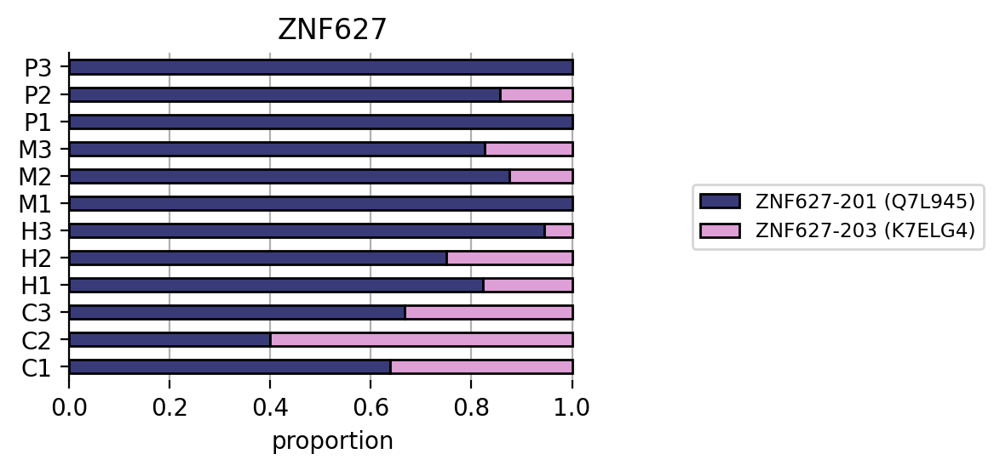

ZNF644


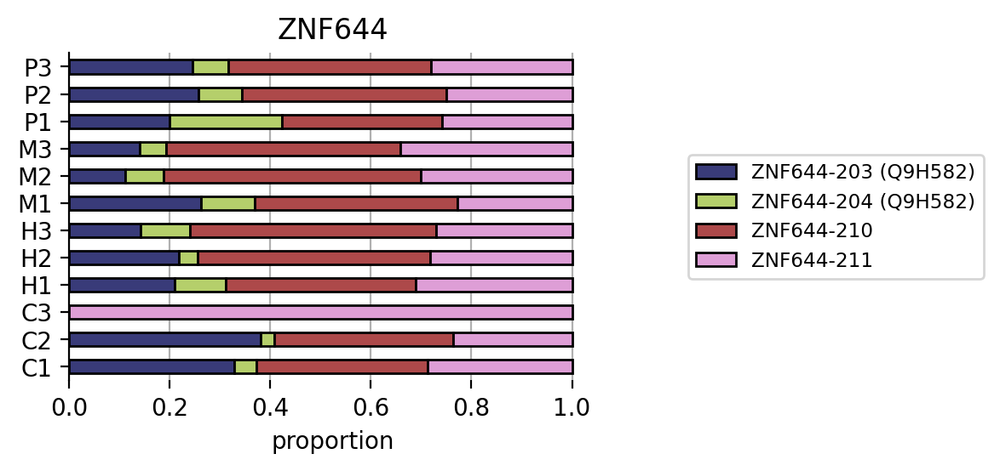

ZNF786


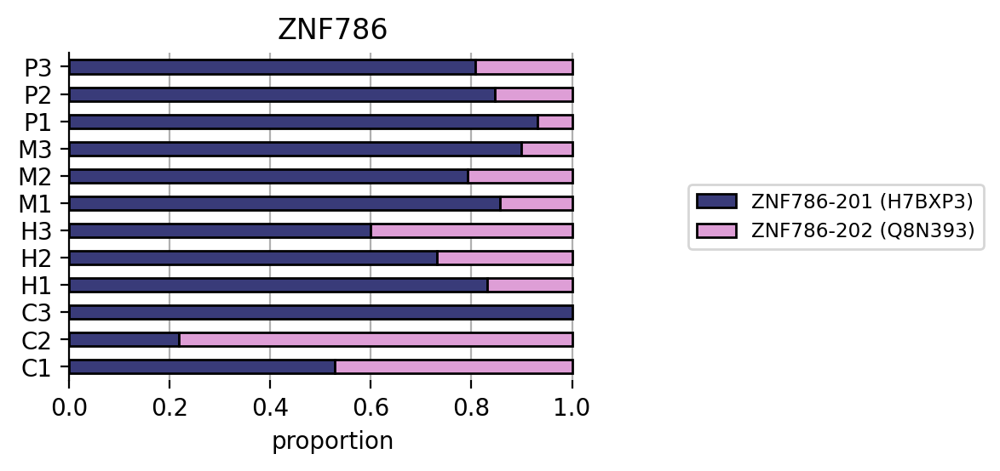

ADARB1


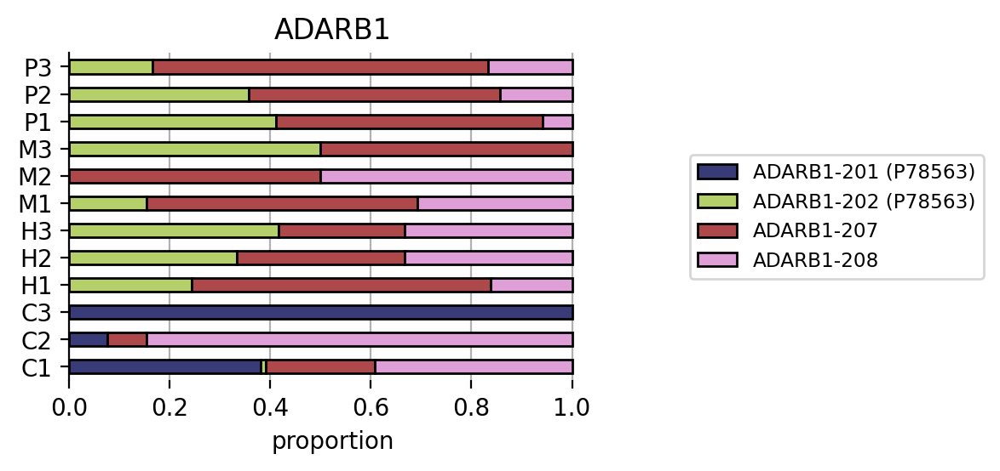

ARFGAP1


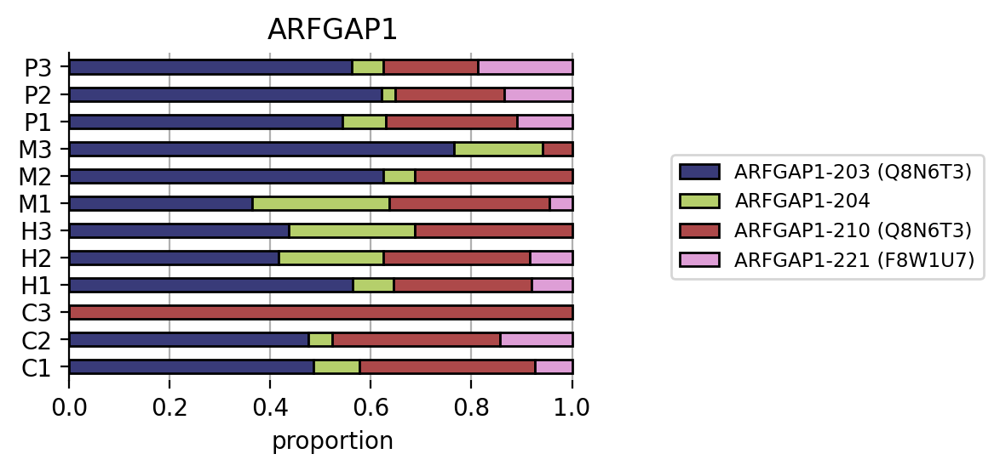

DAZAP1


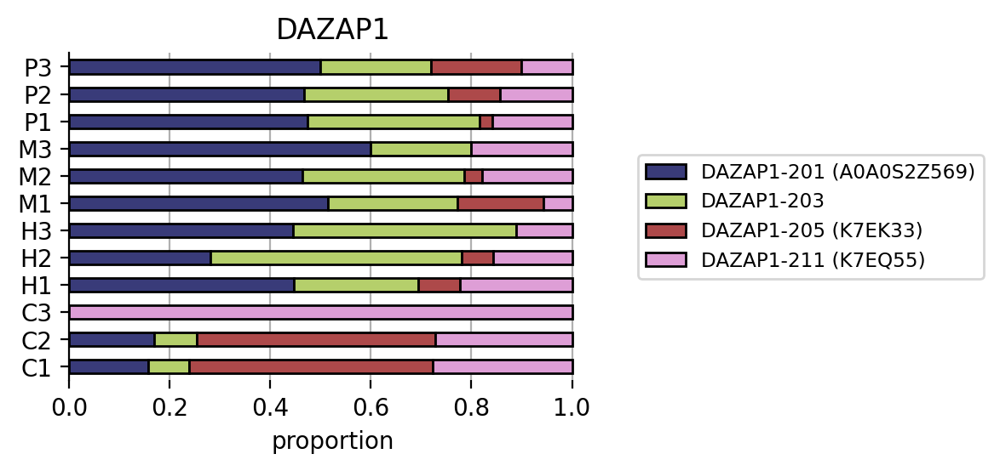

E2F7


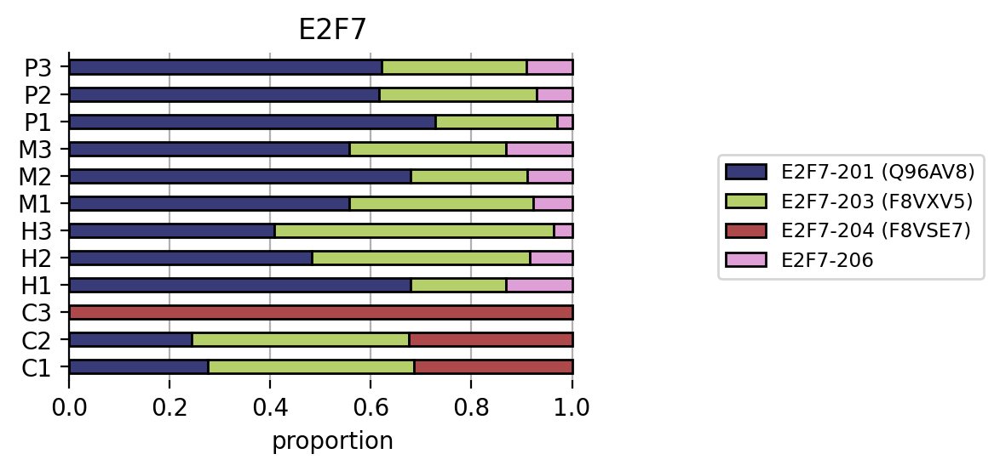

ETV5


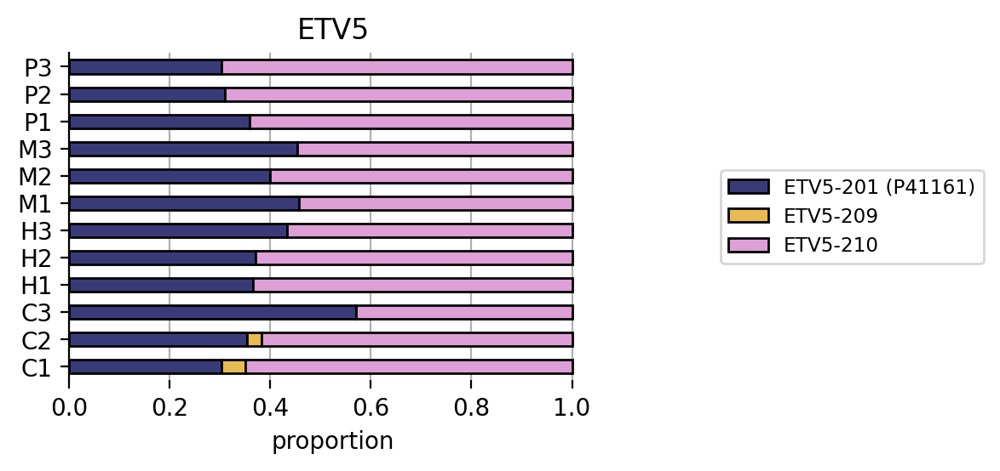

FHL2


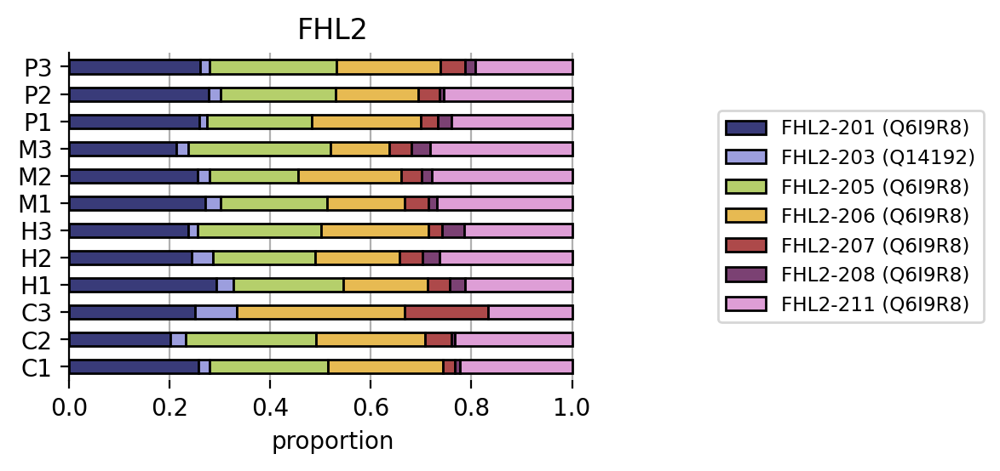

HNRNPC


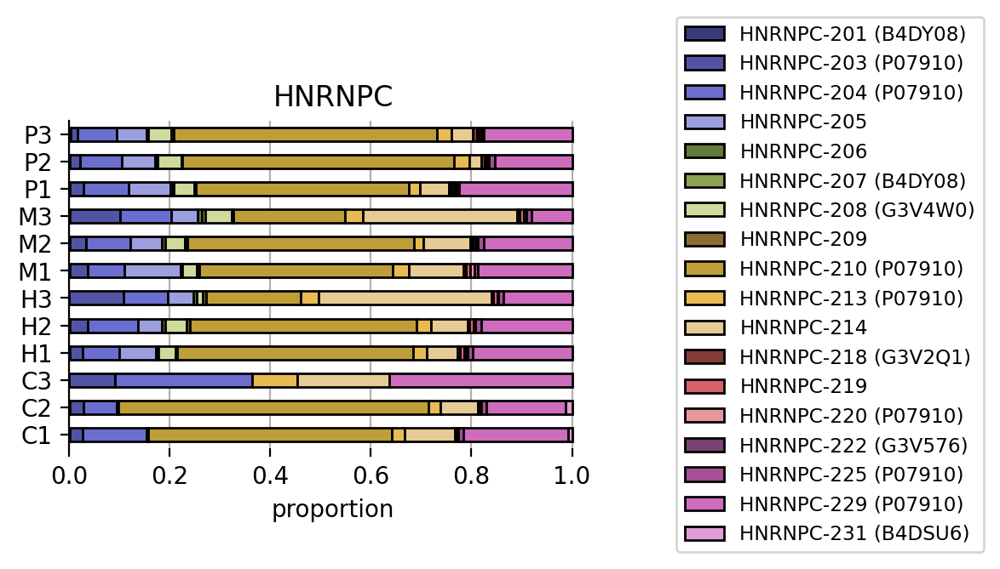

IRF2


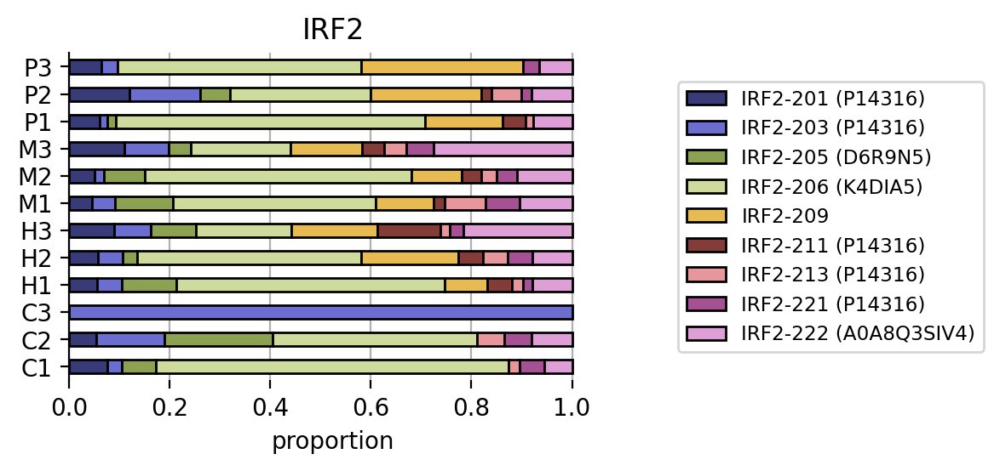

JRK


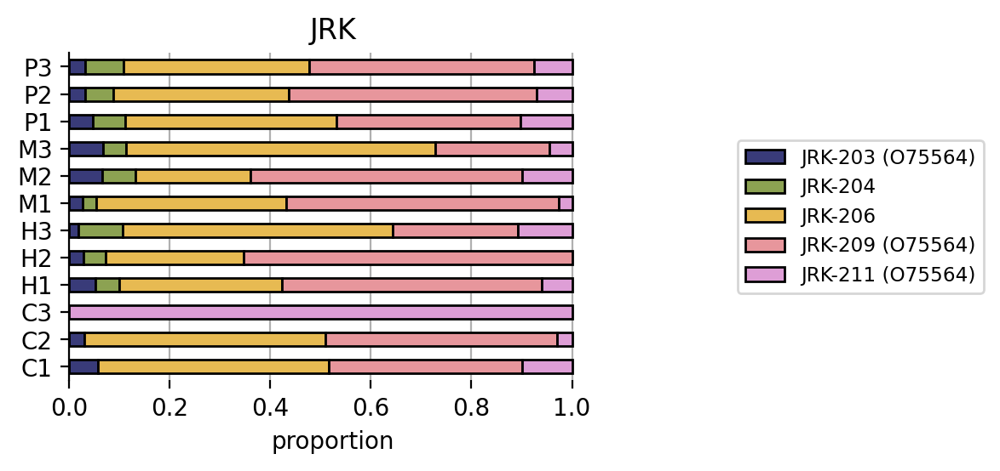

KDM5D


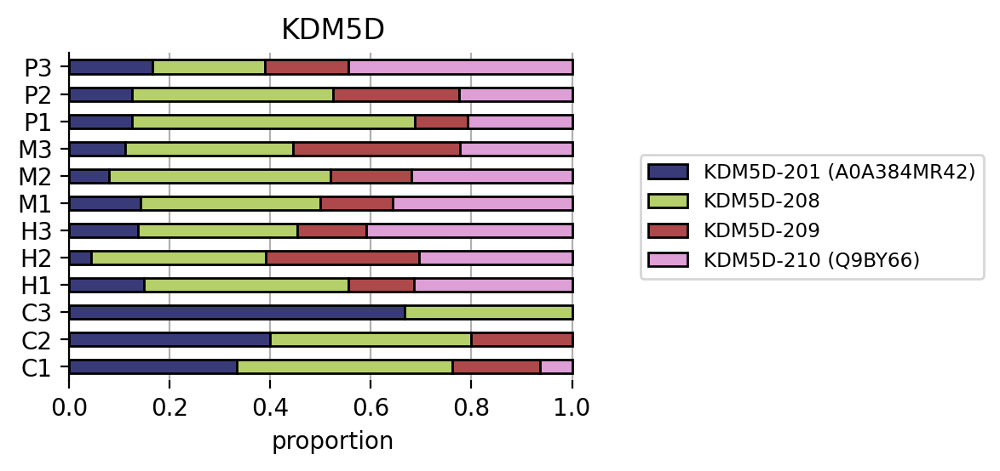

MYLK


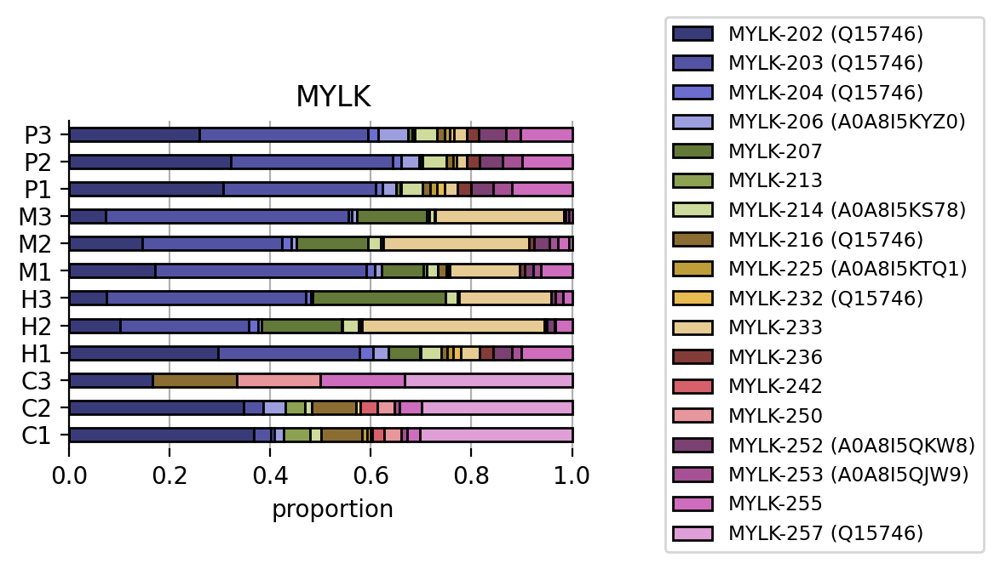

NR3C1


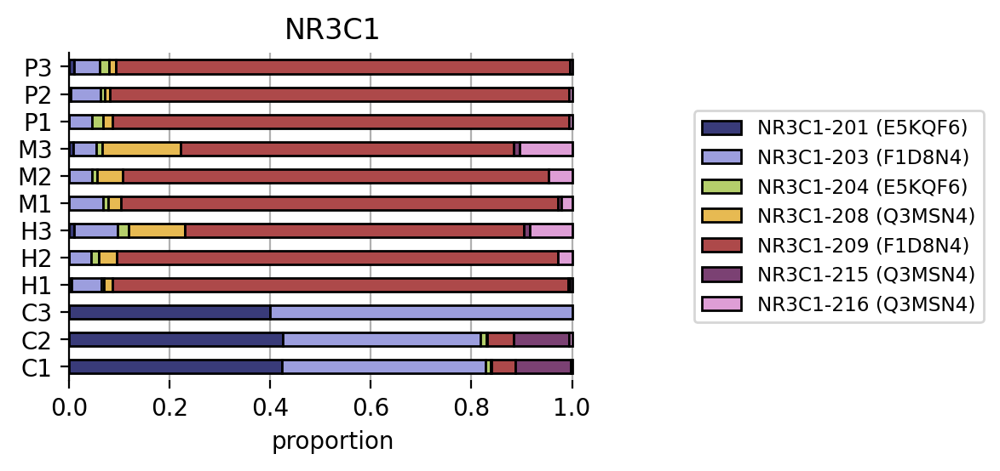

P4HB


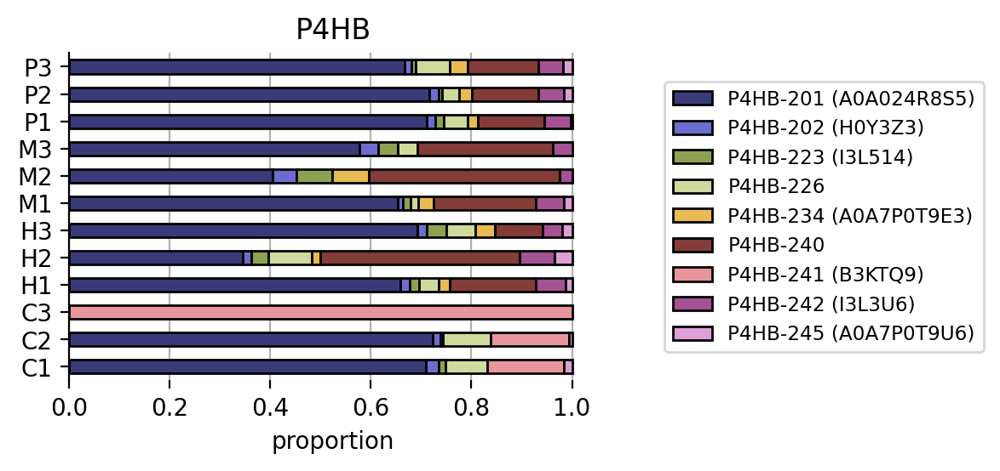

PAX3


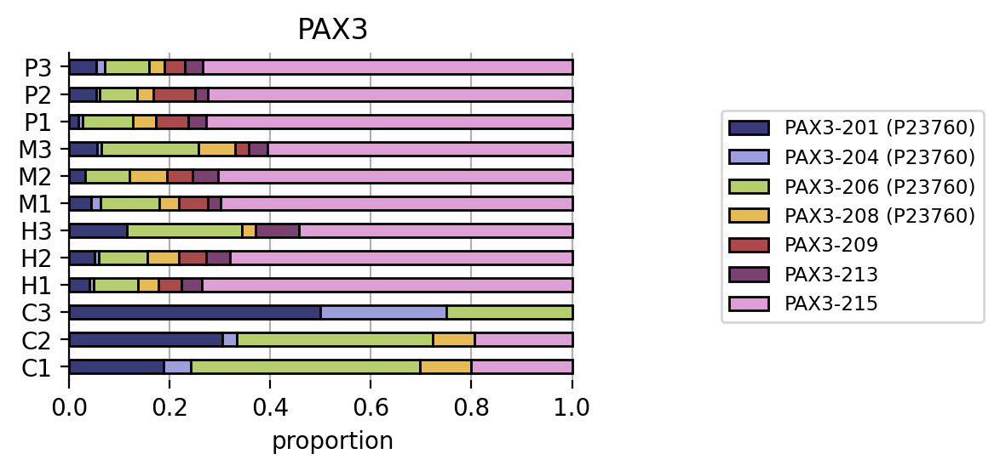

PDS5A


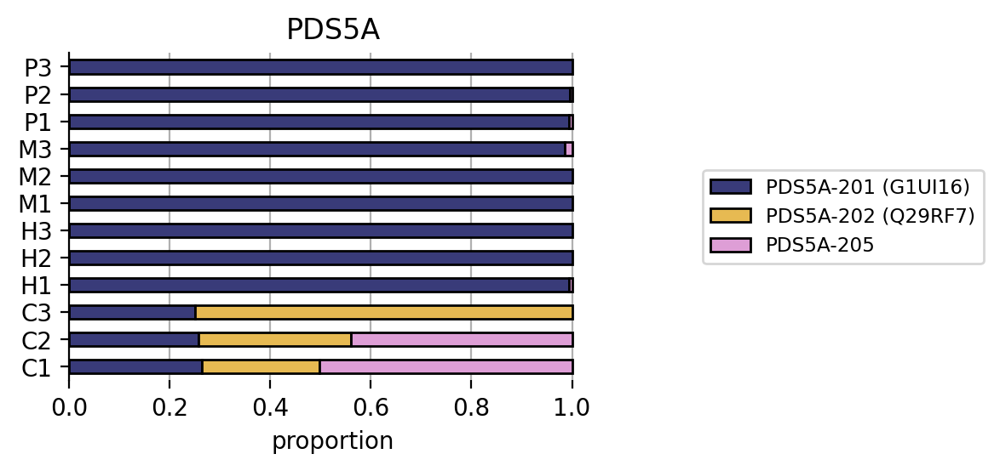

PRDM1


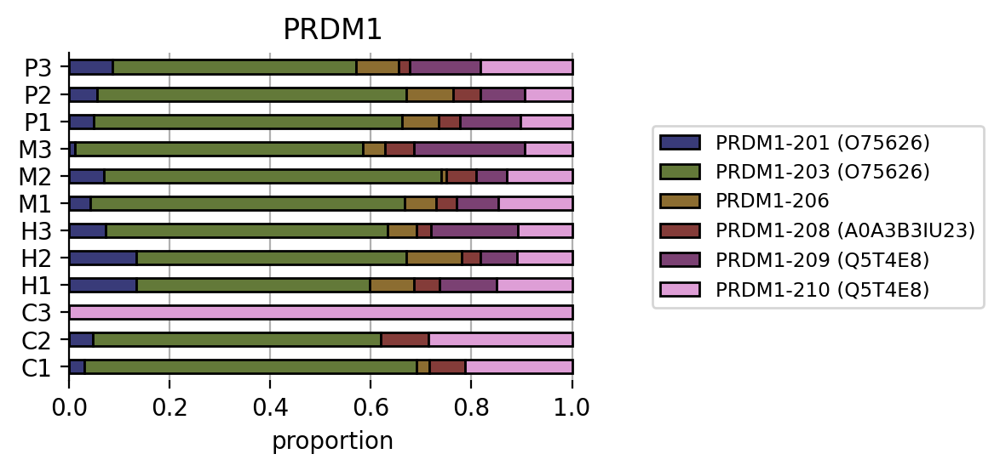

RBPJ


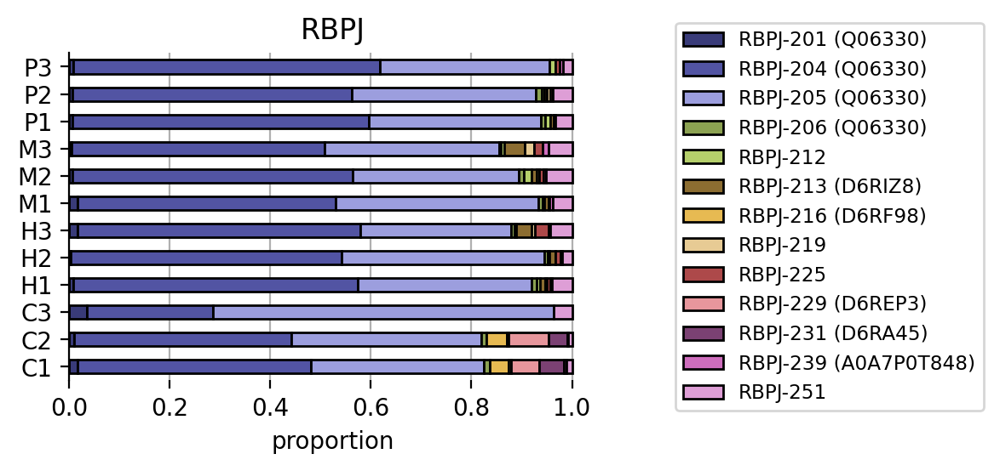

RFX2


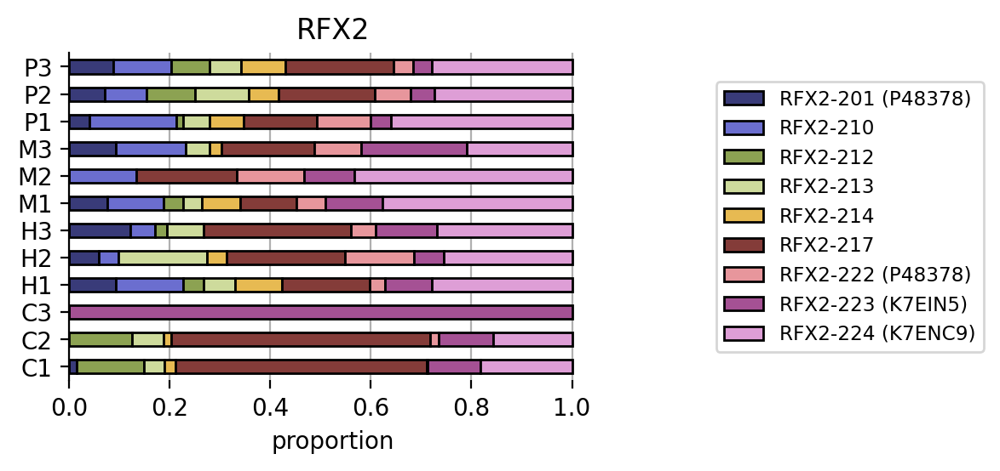

SMAD2


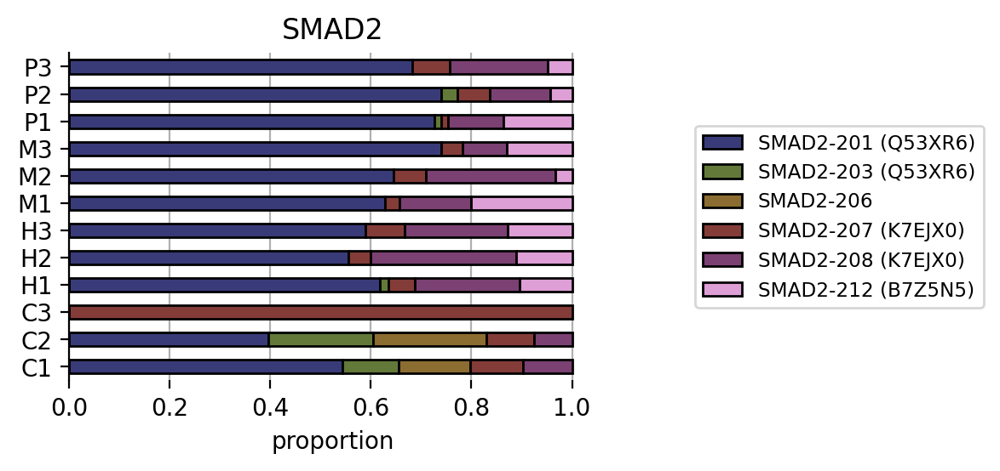

SMAD4


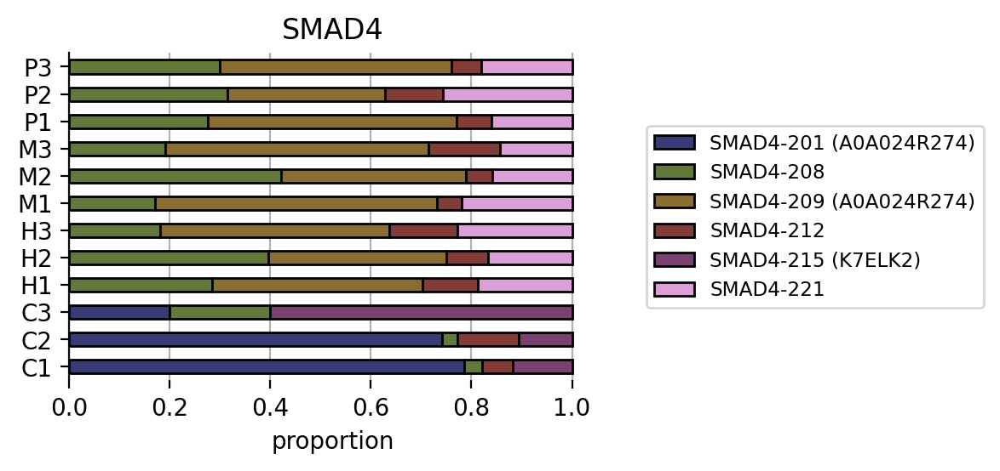

TRMO


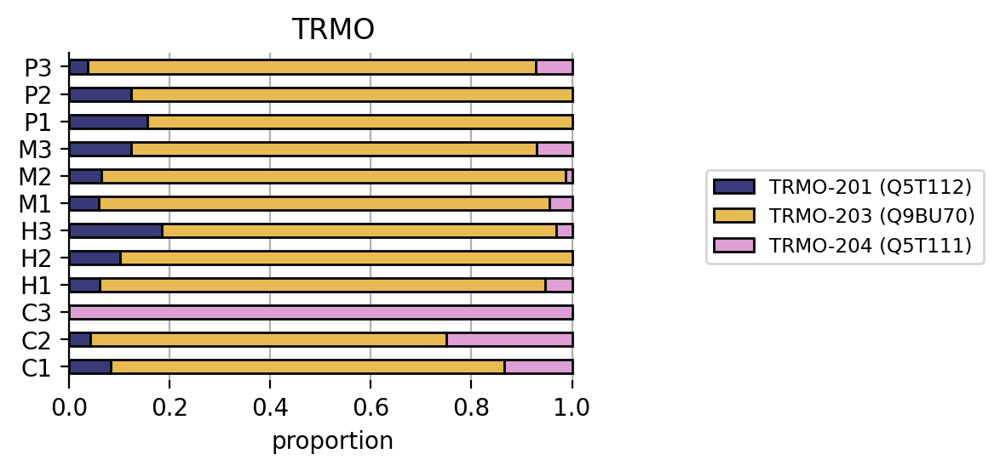

ZBTB24


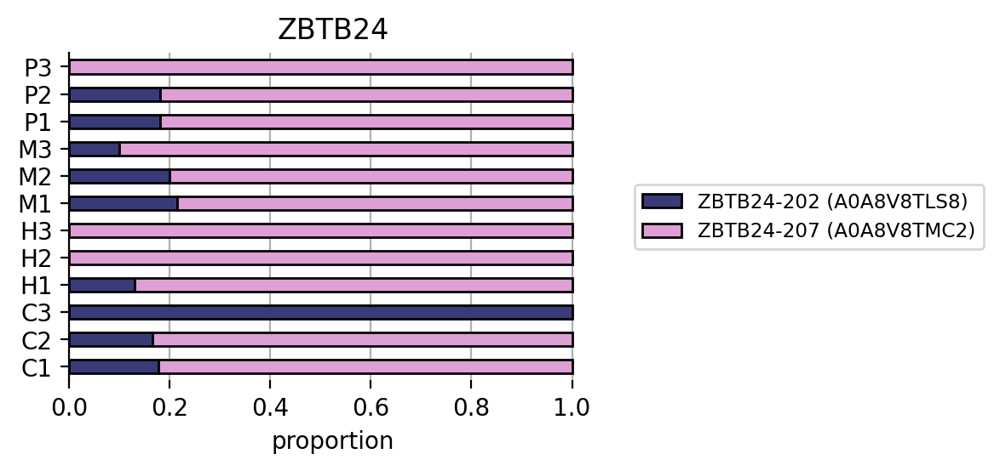

ZIC1


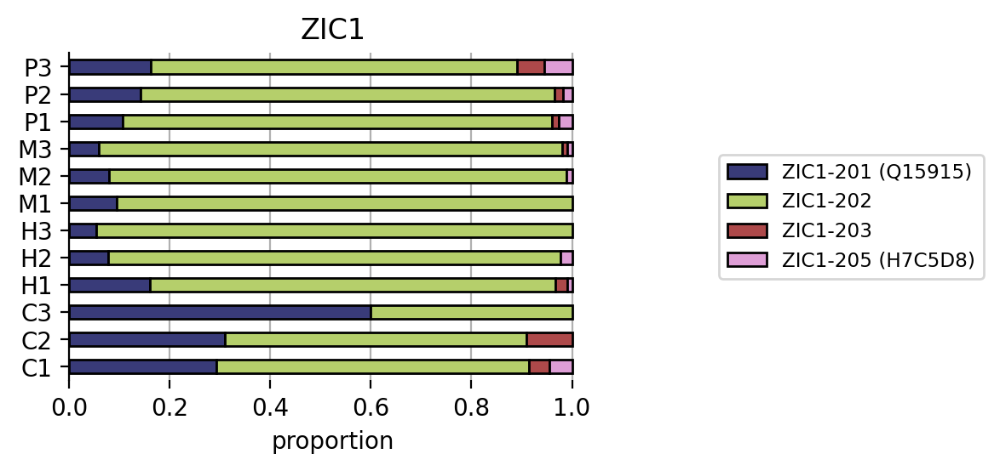

ZNF7


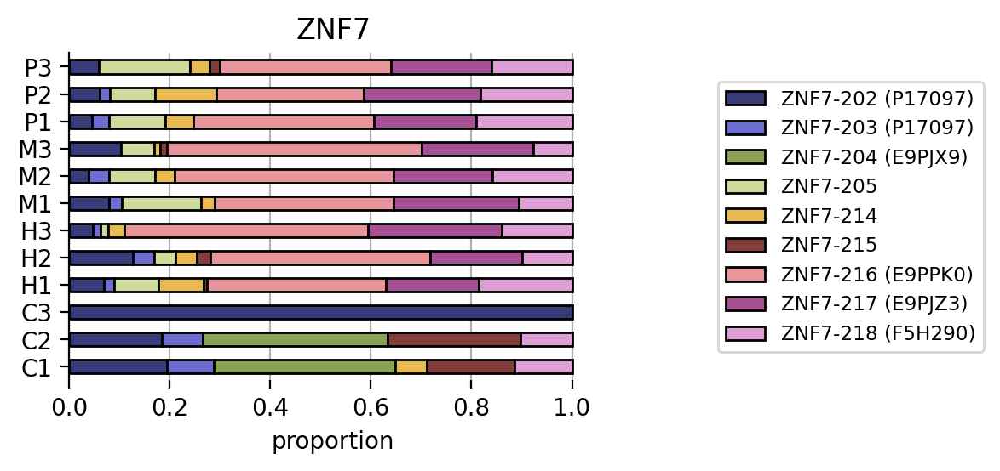

ZNF181


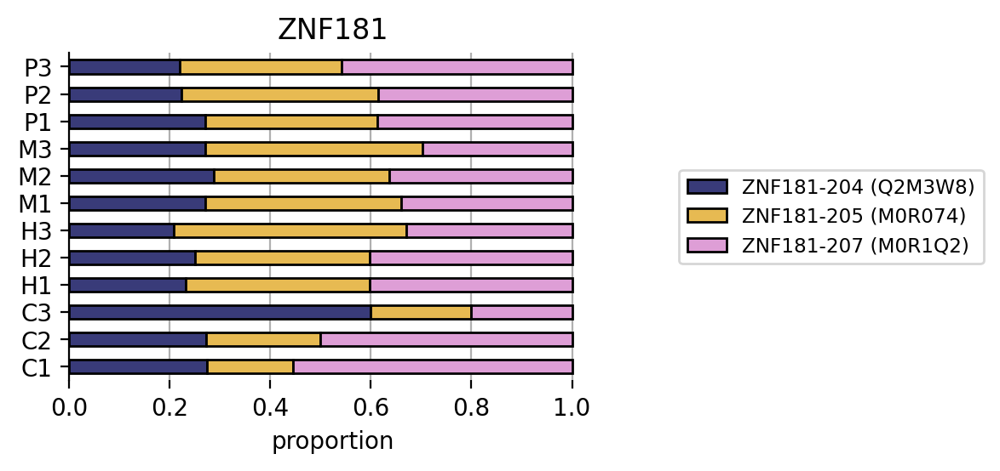

ZNF195


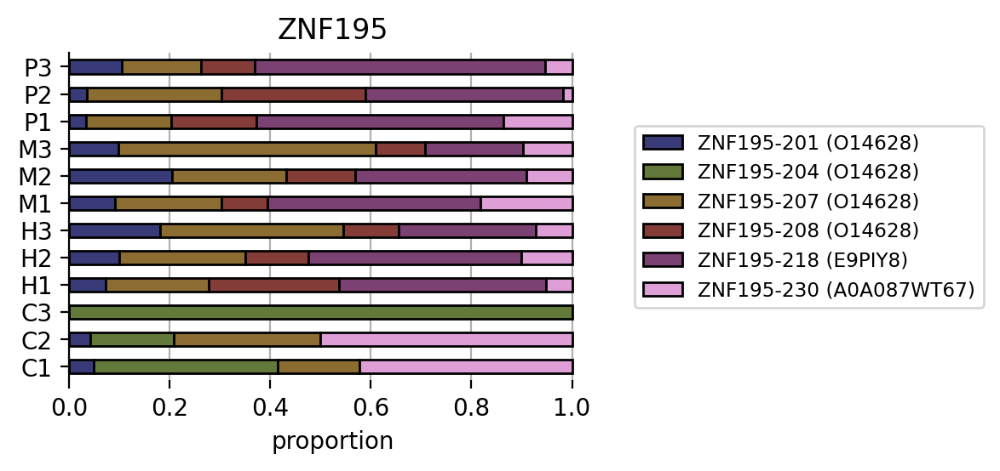

ZNF205


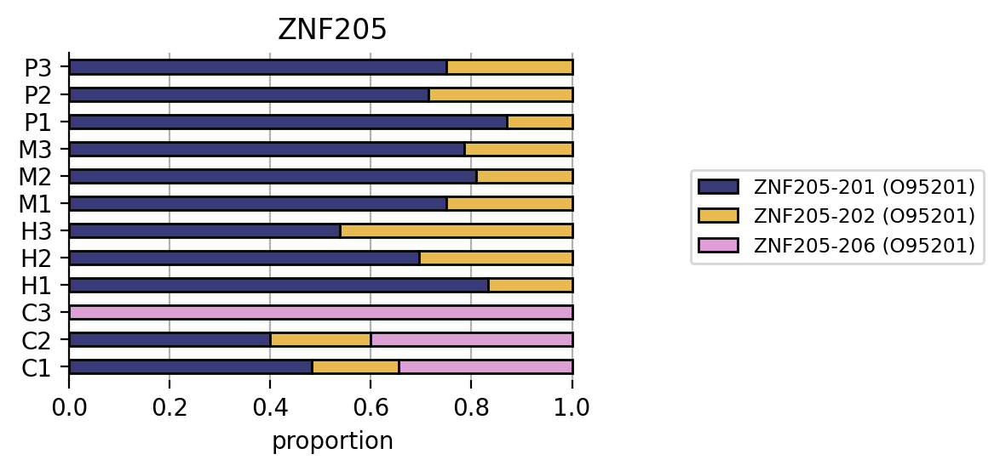

ZNF233


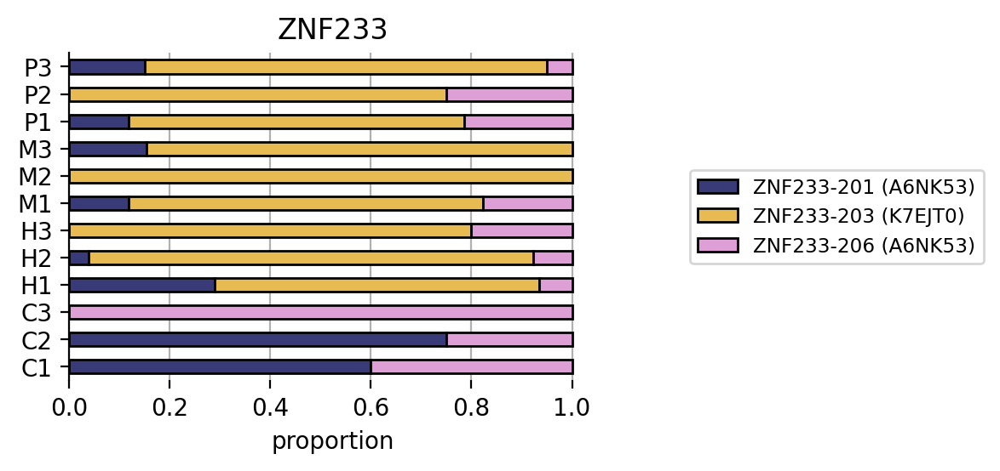

ZNF302


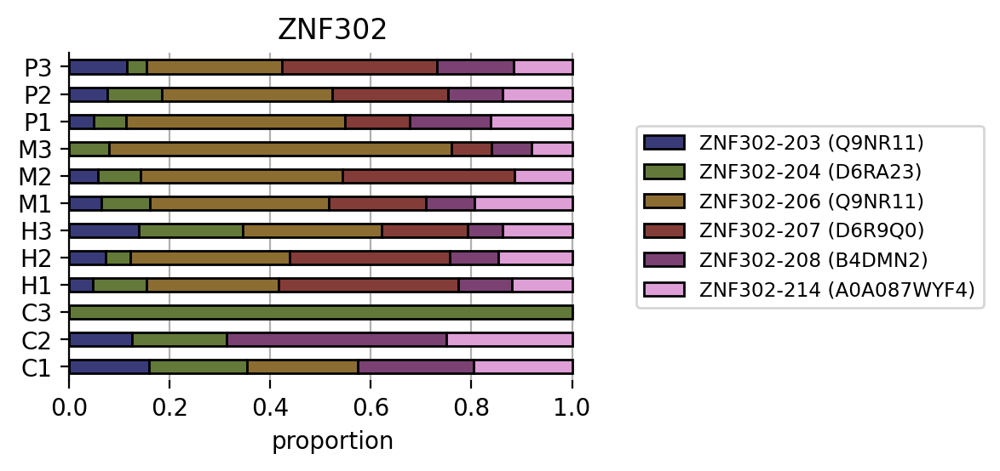

ZNF329


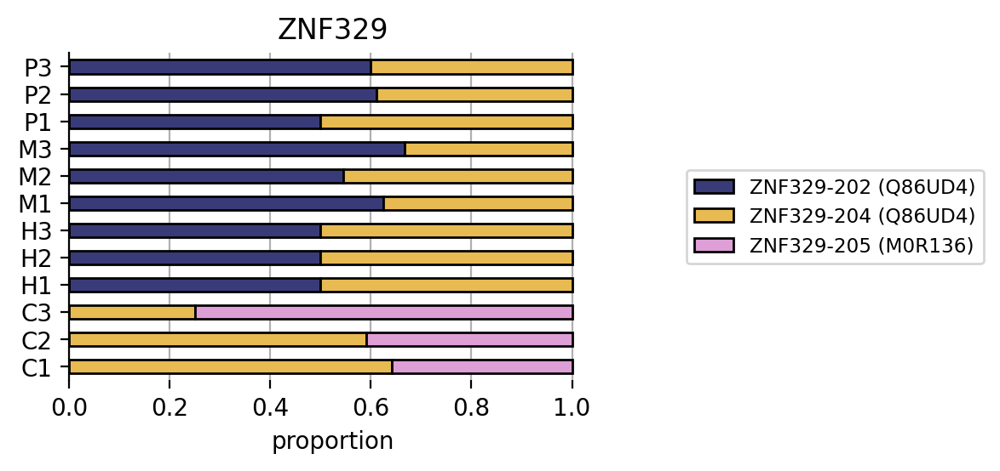

ZNF345


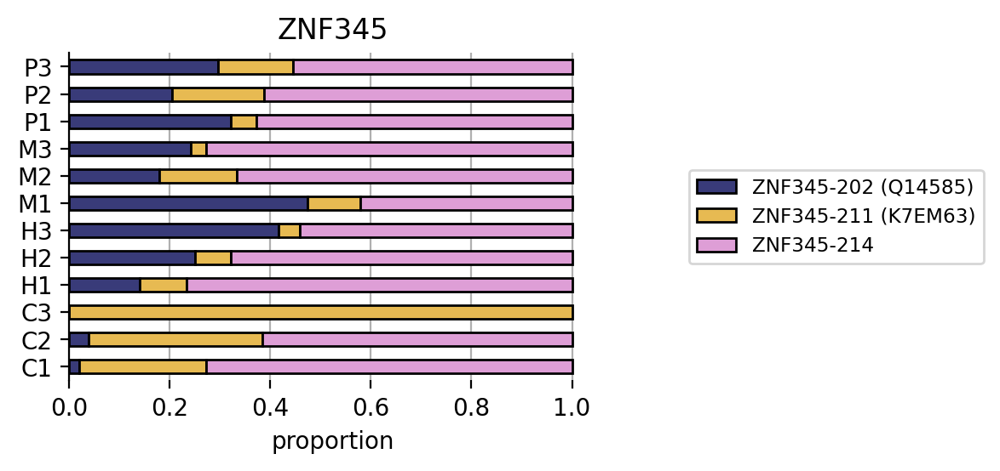

ZNF438


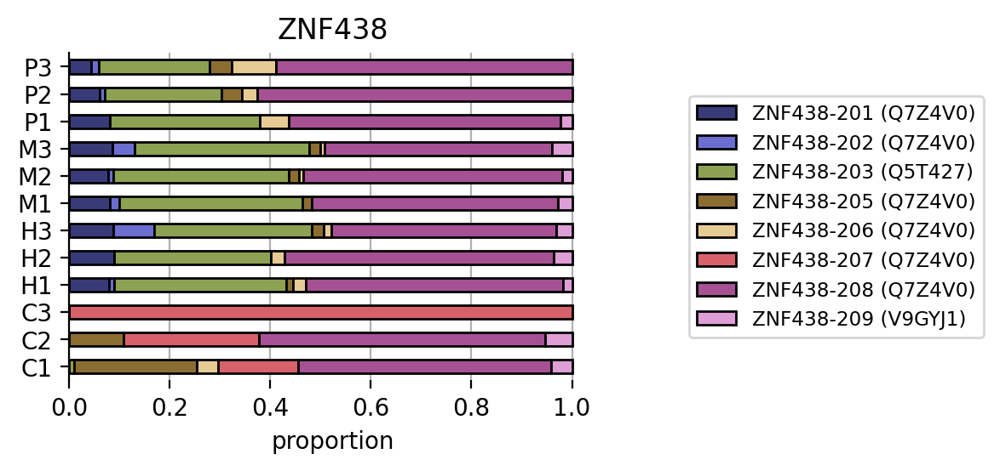

ZNF440


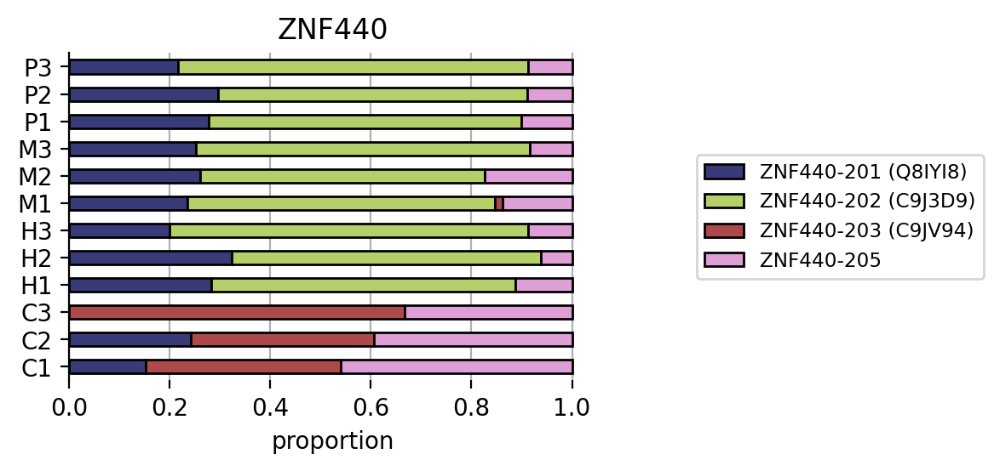

ZNF442


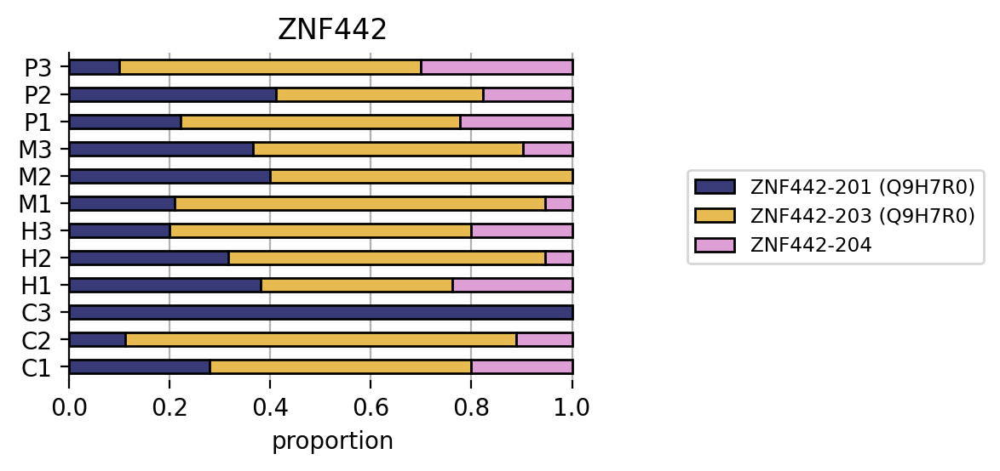

ZNF544


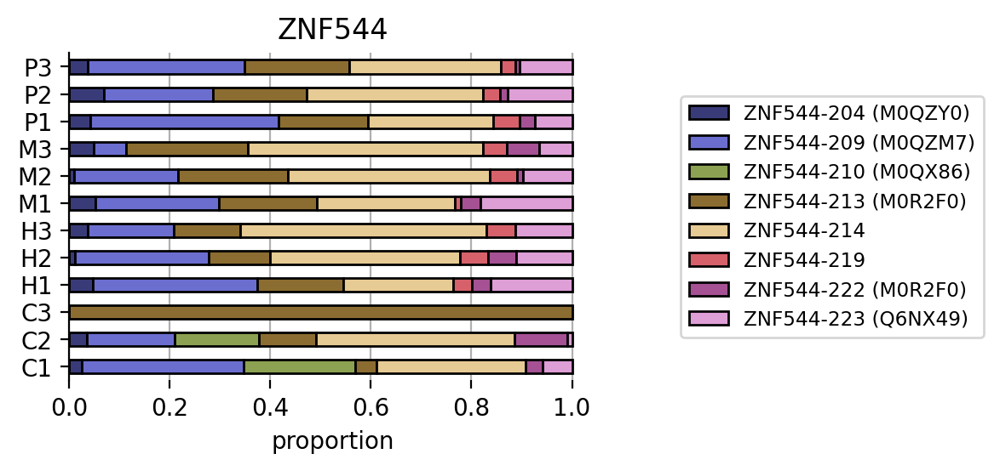

ZNF559


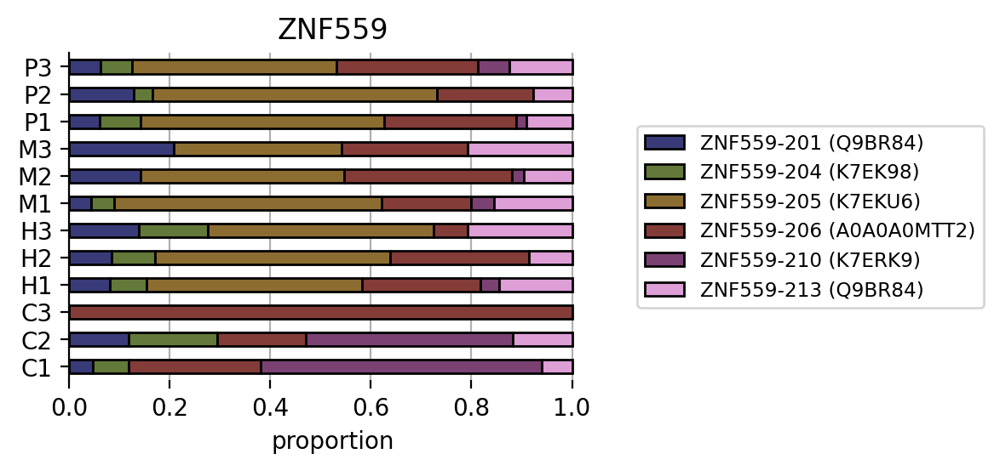

ZNF611


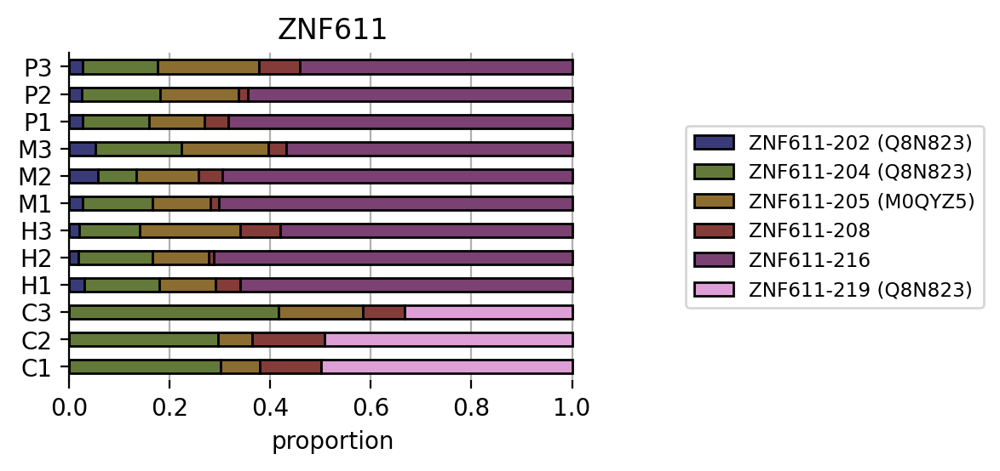

ZNF655


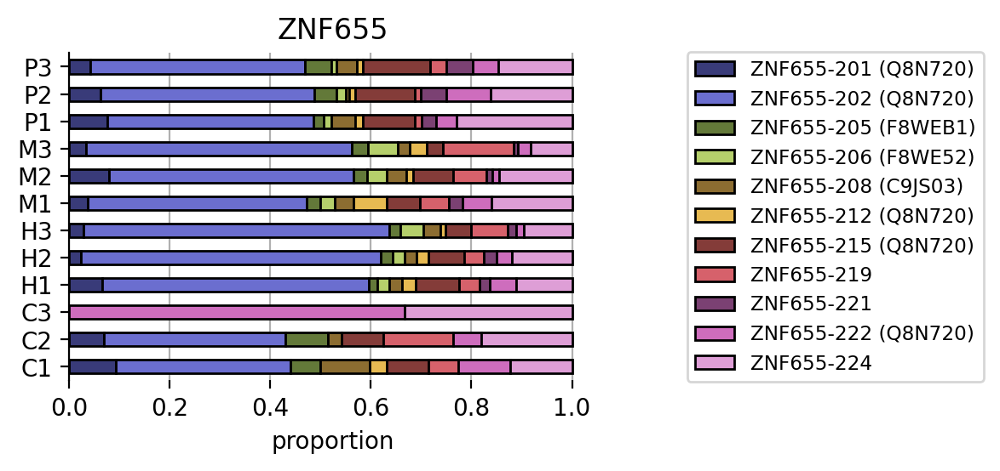

ZNF774


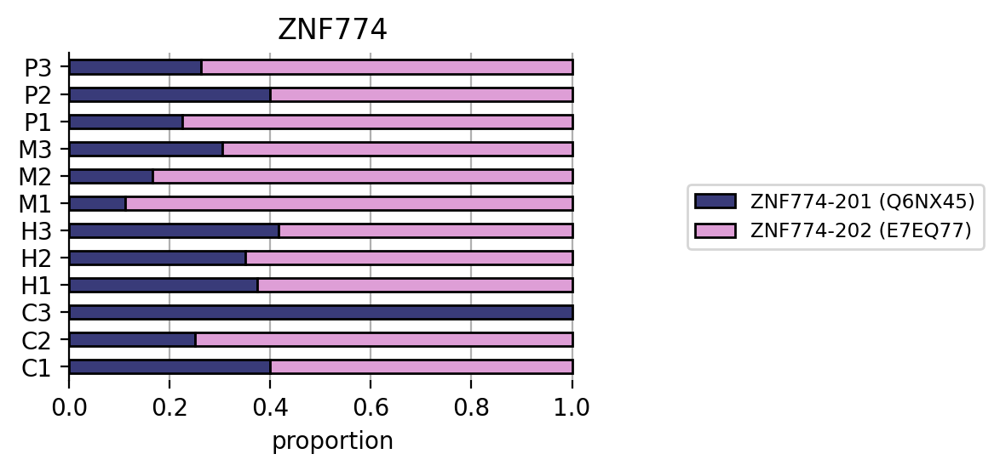

ZSCAN30


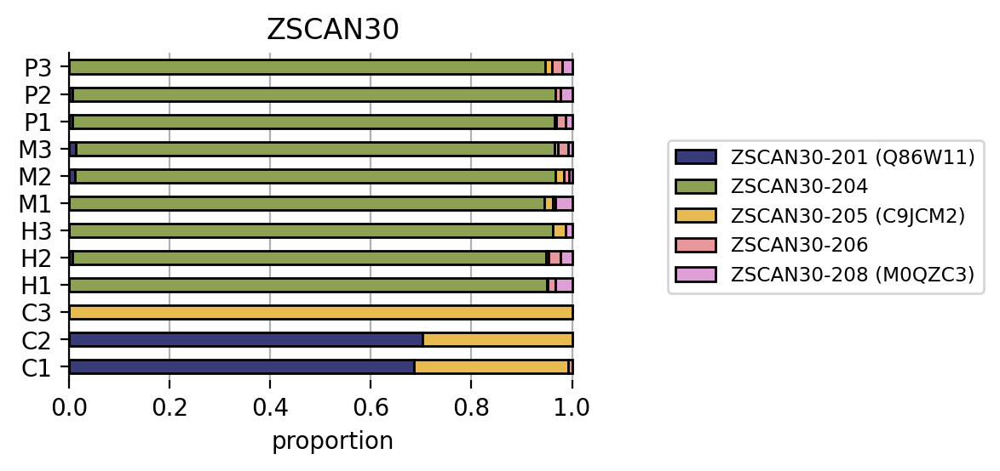

CNOT3


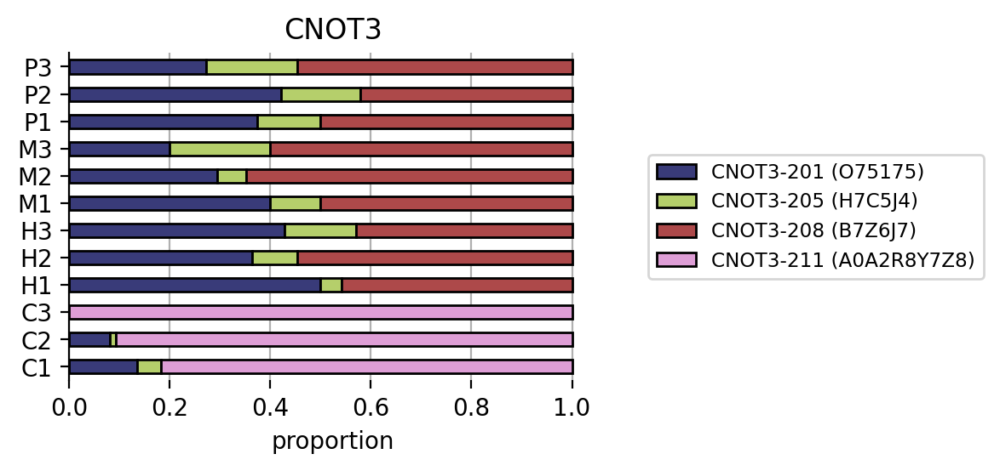

ETV1


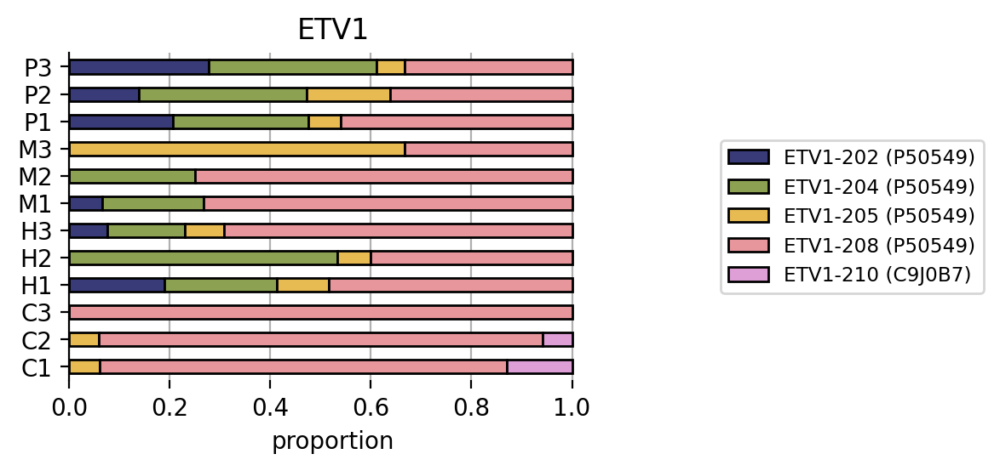

LAS1L


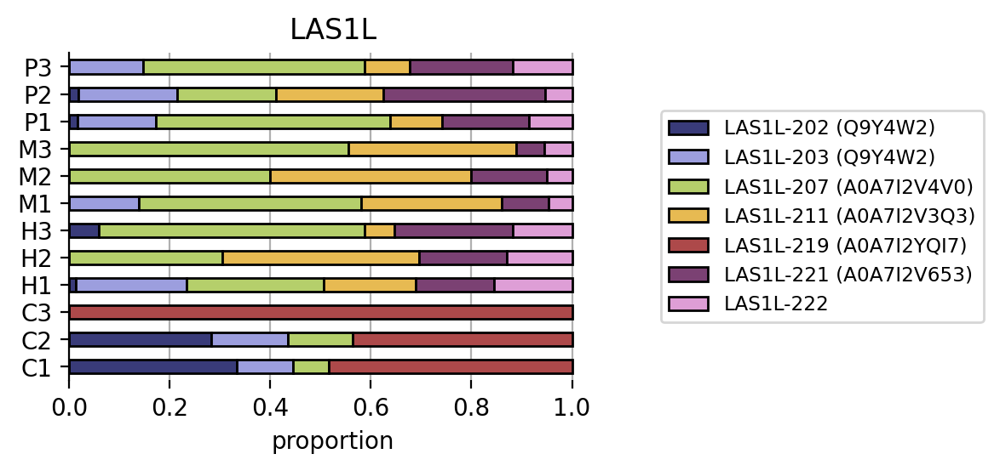

NR1H3


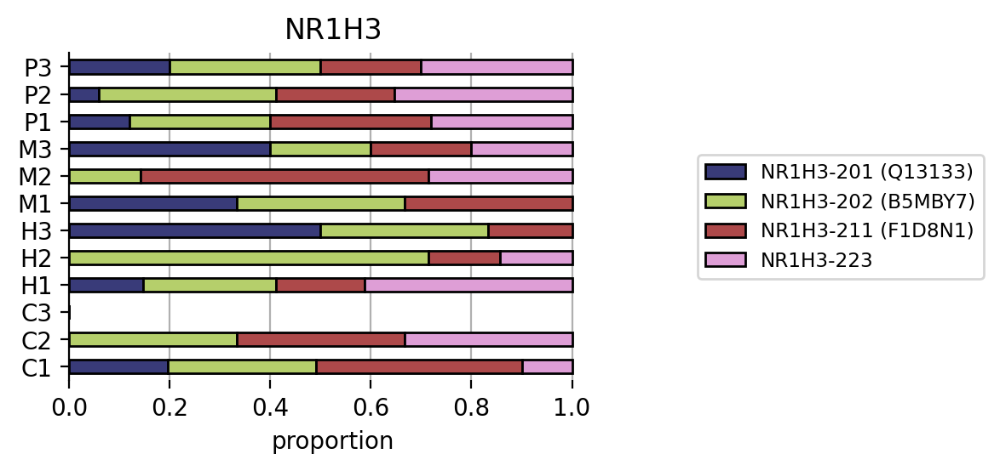

RFX7


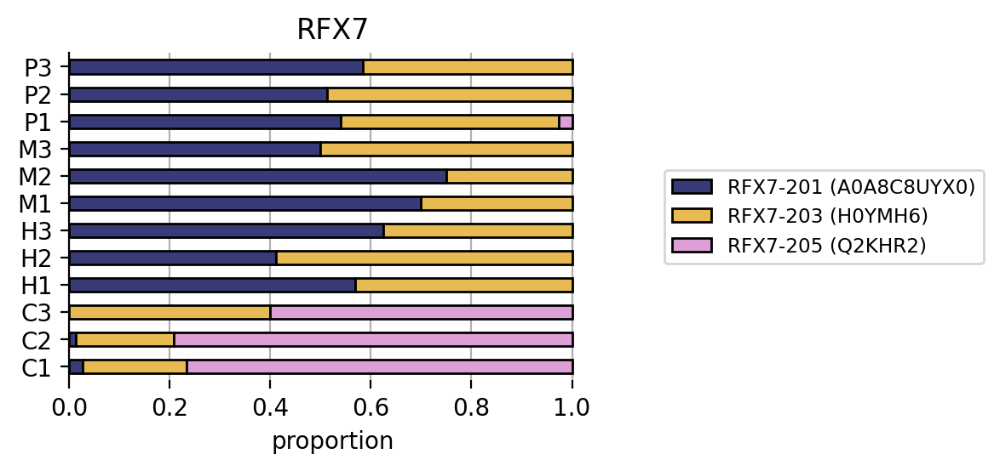

ARNT2


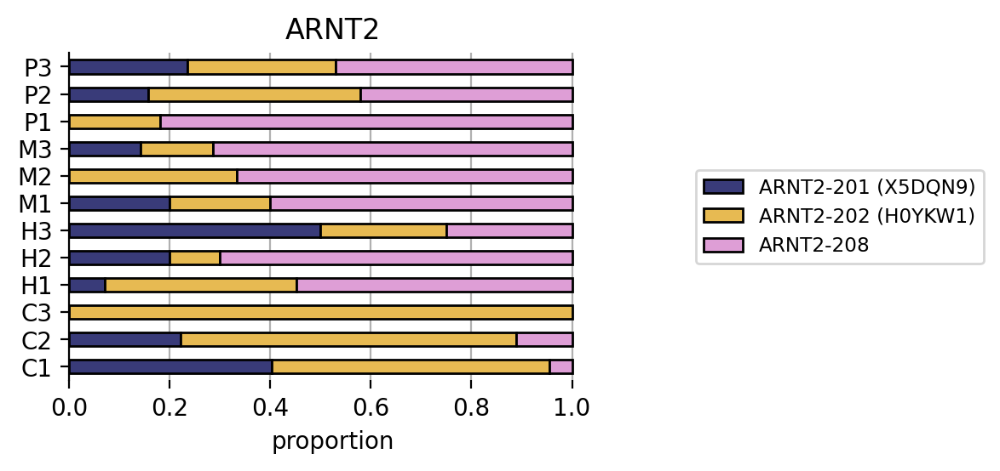

BACH1


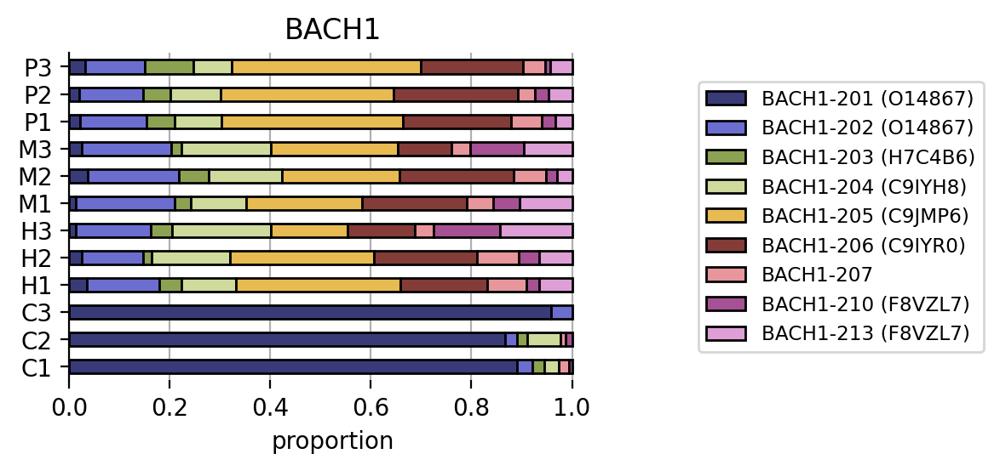

BRF1


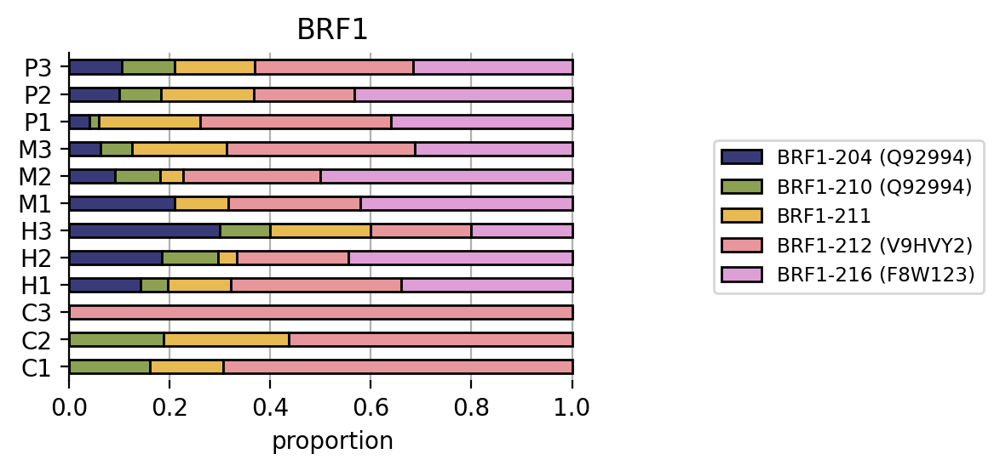

CREM


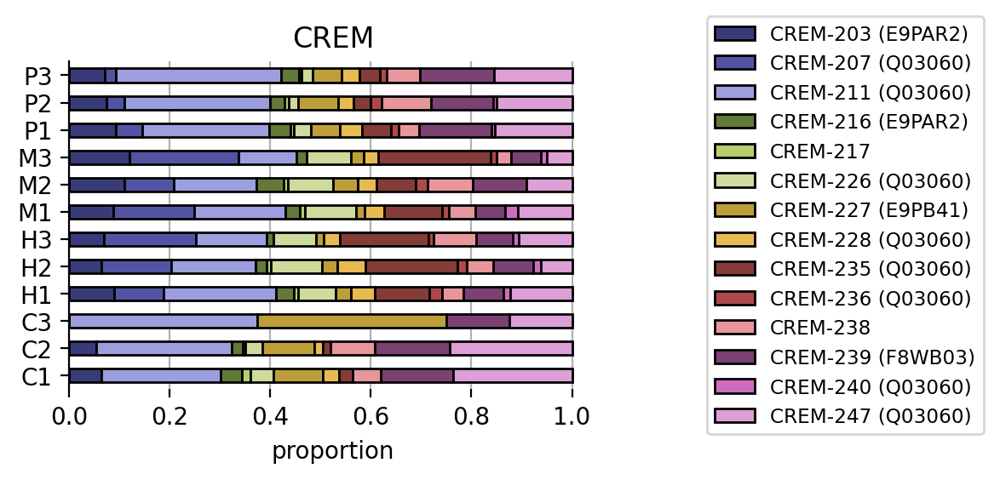

HMBOX1


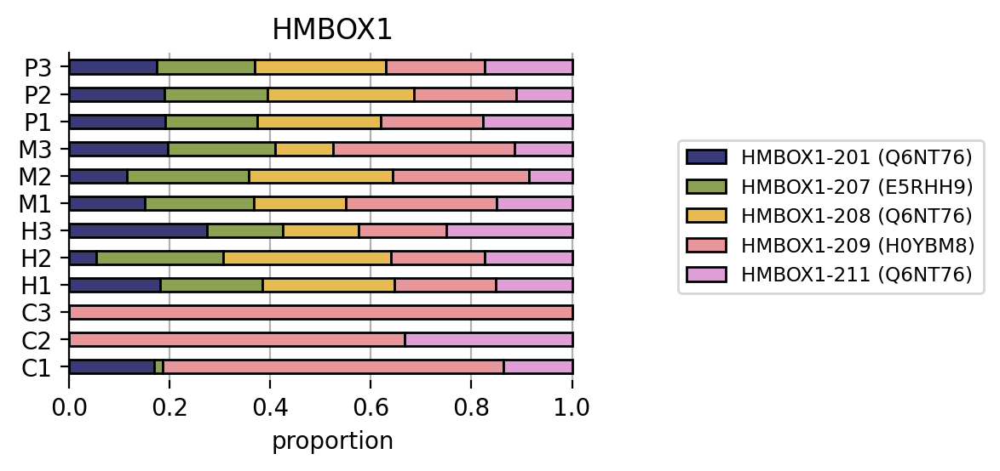

LARP1


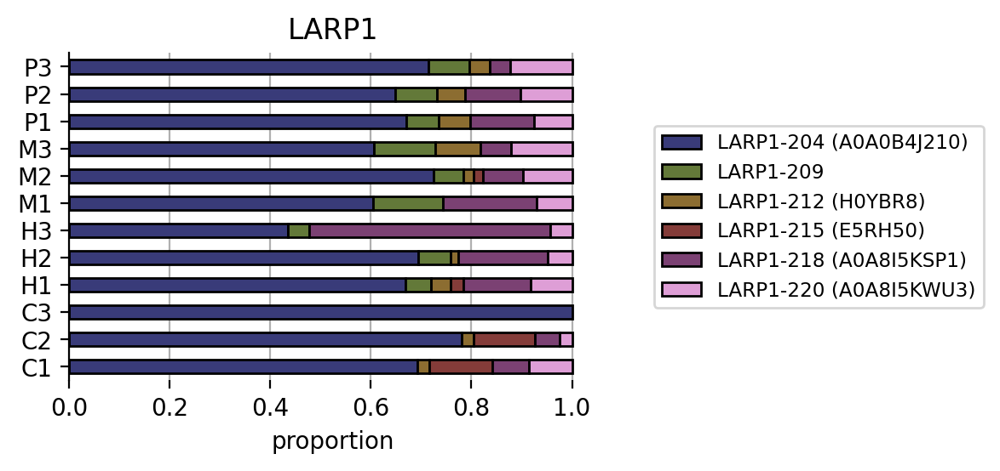

MAZ


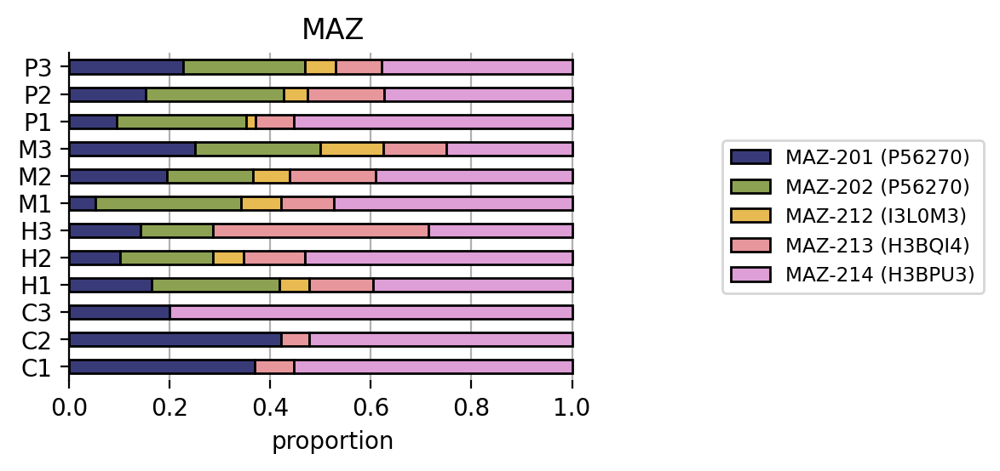

MORN1


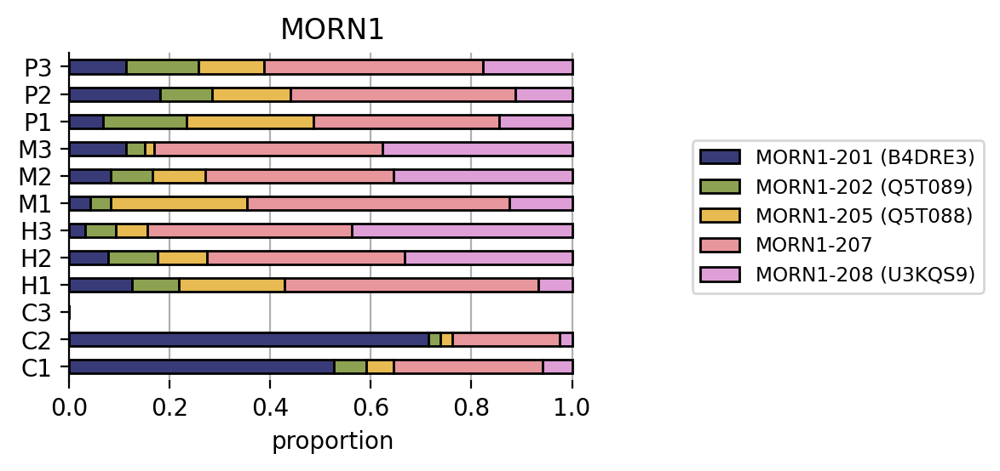

NNT


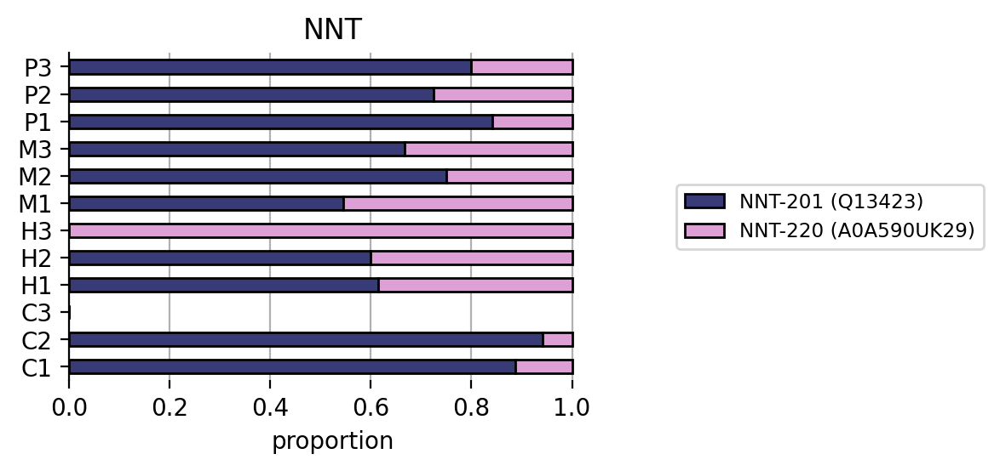

RARB


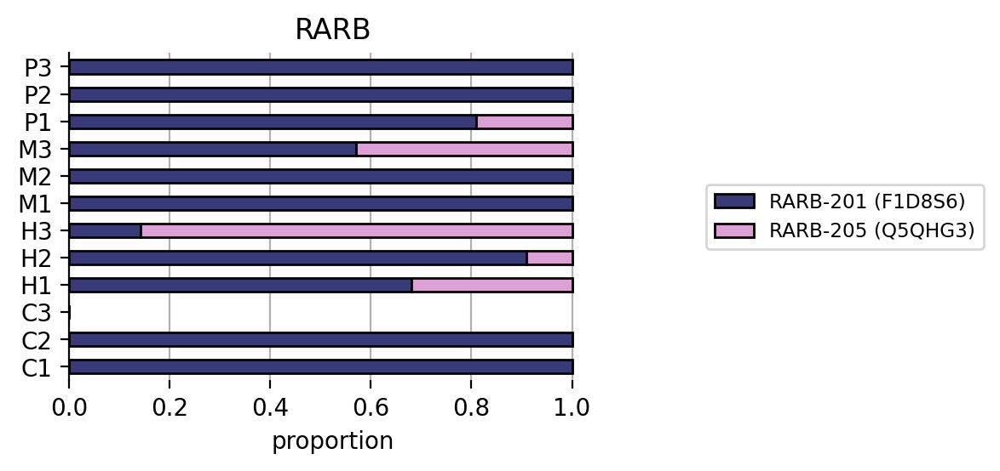

ZFP90


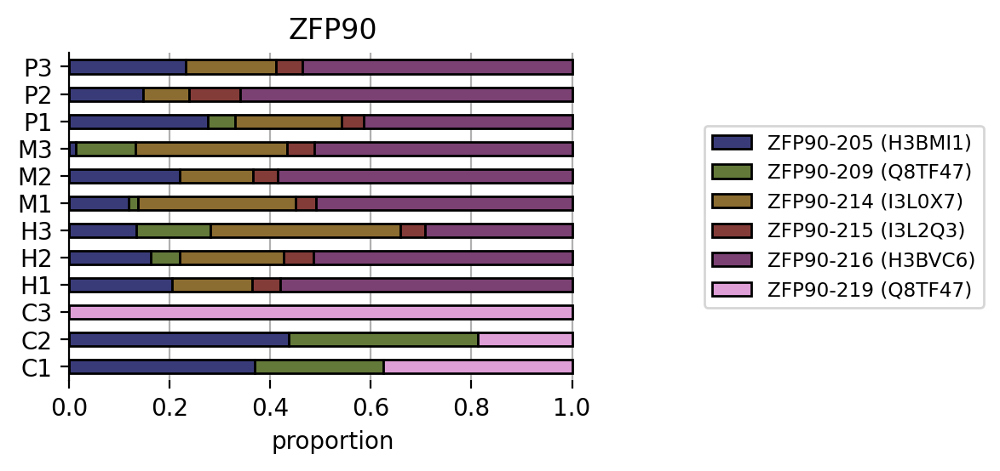

ZNF75A


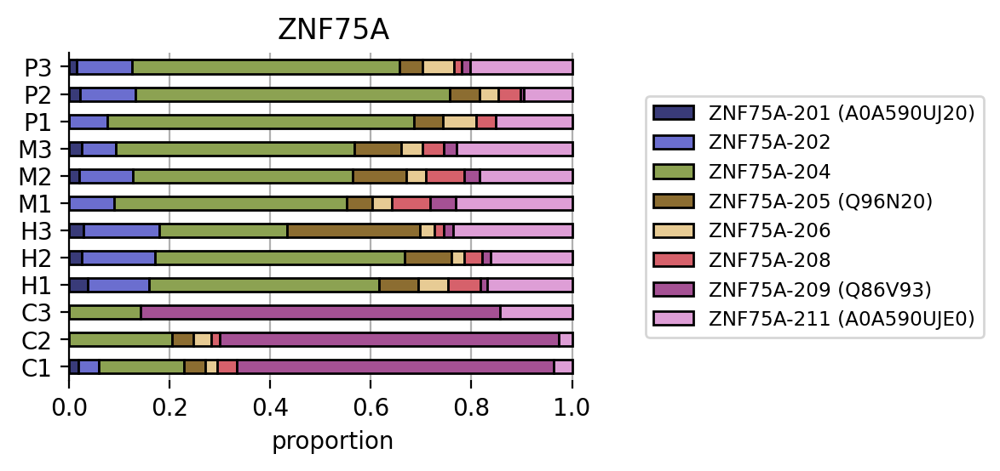

ZNF439


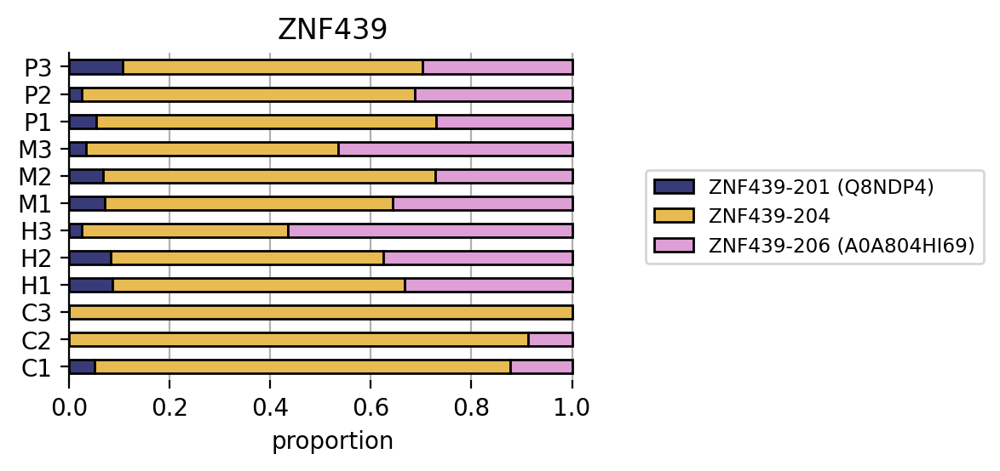

ZNF576


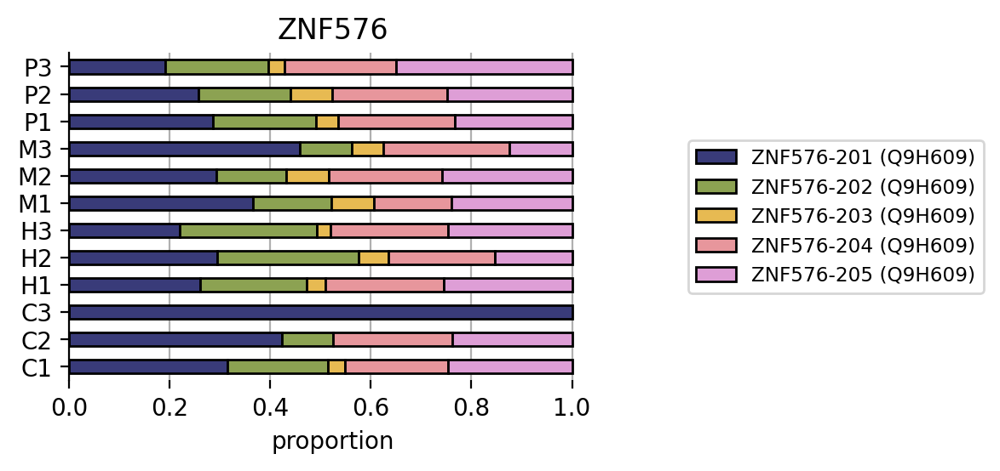

ZNF845


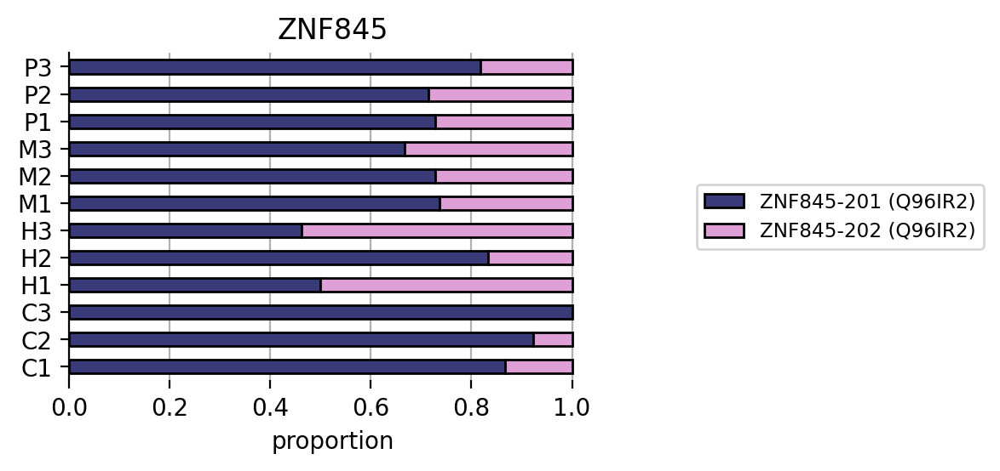

ETV2


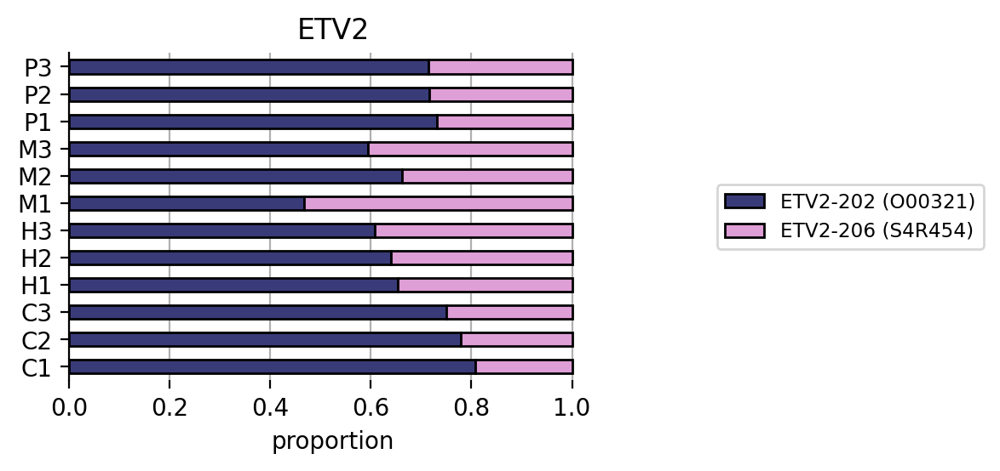

MSRB3


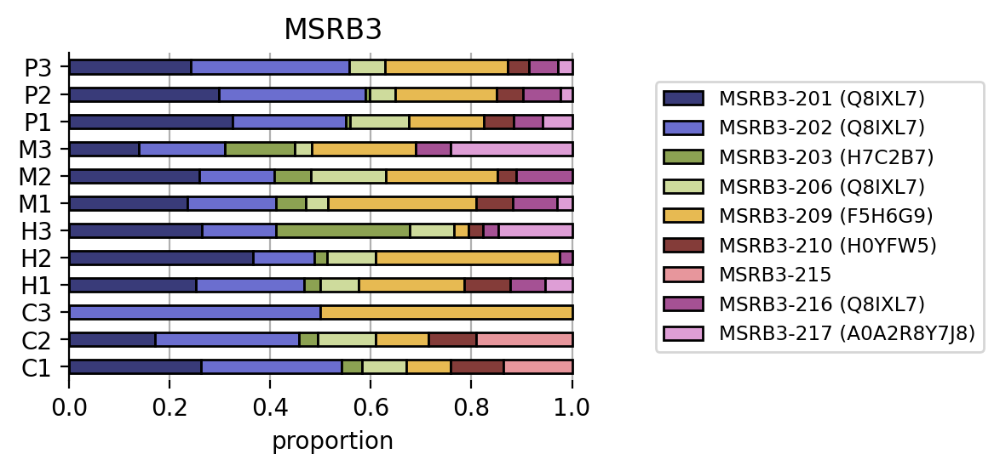

MXI1


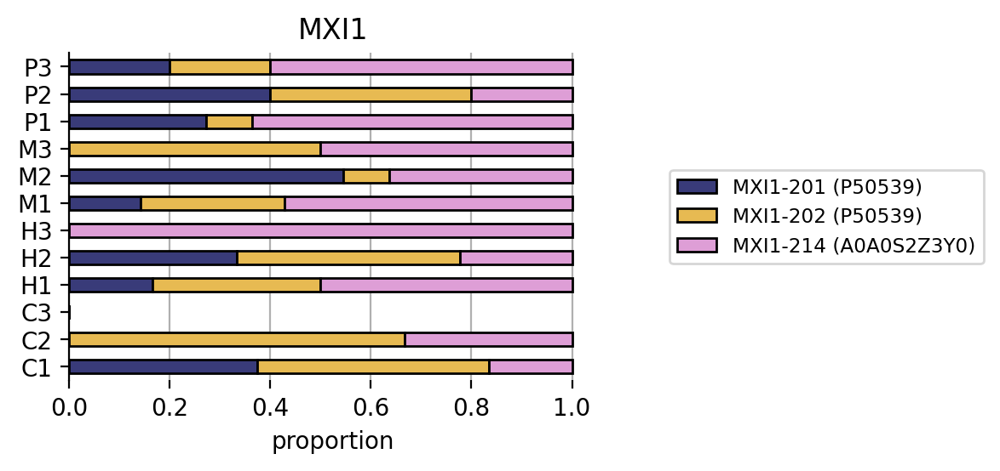

NFXL1


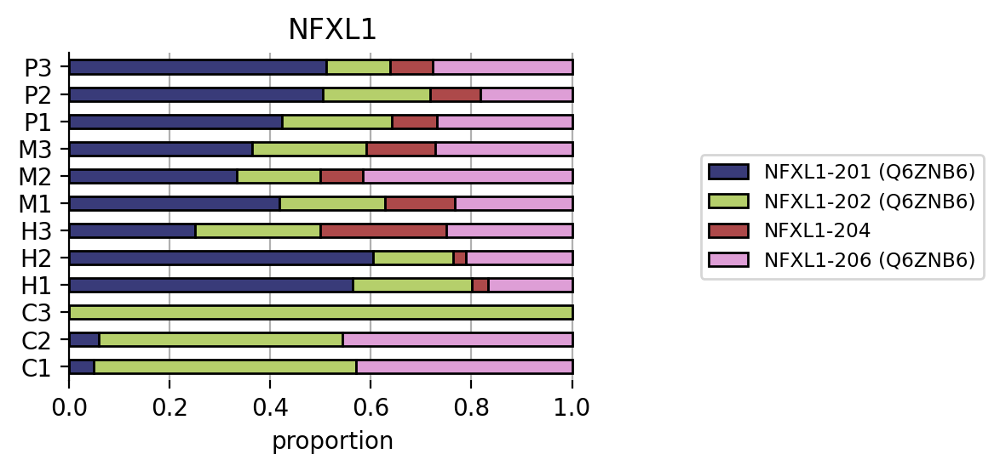

ZHX3


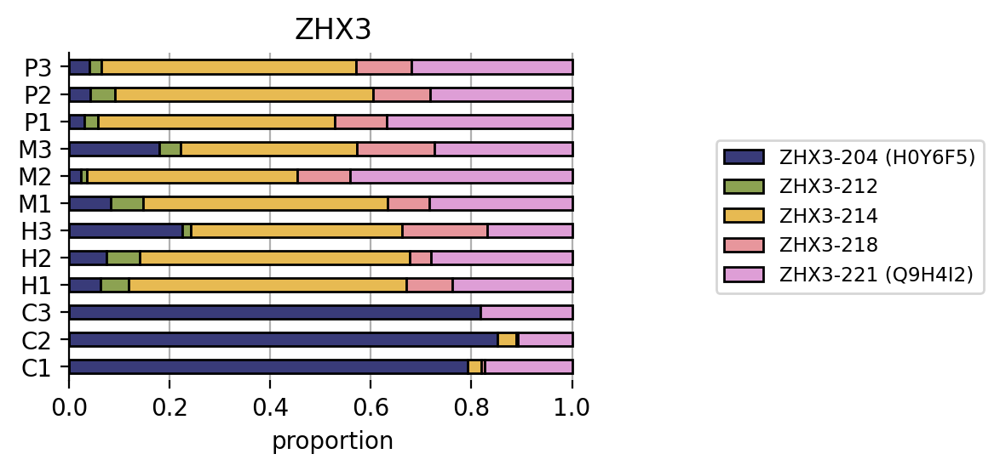

ZNF200


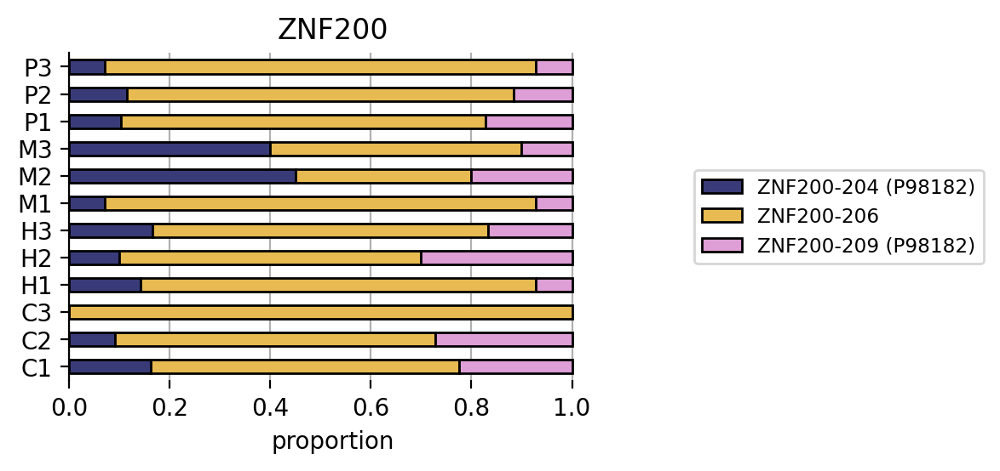

ZNF219


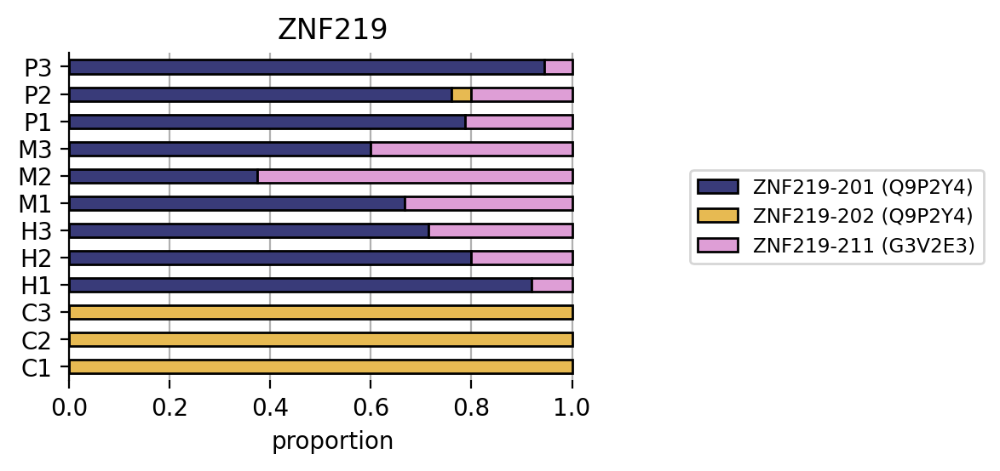

ZNF391


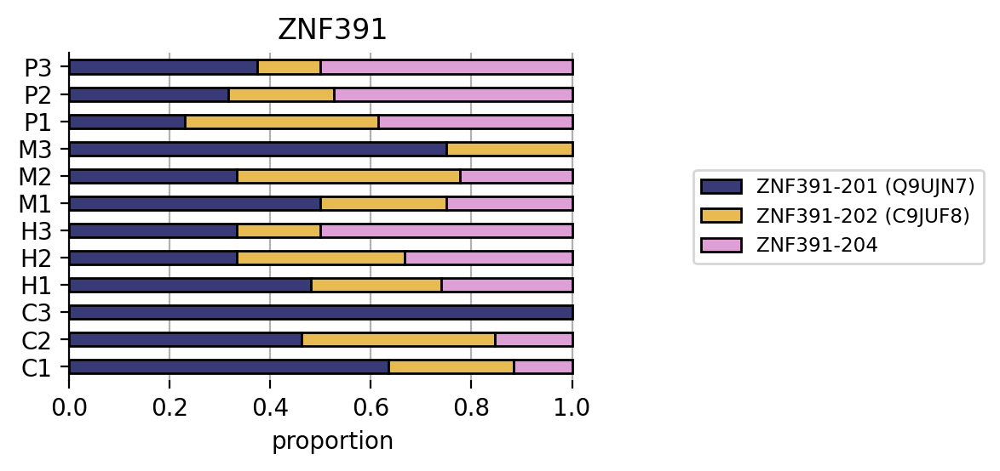

ZNF519


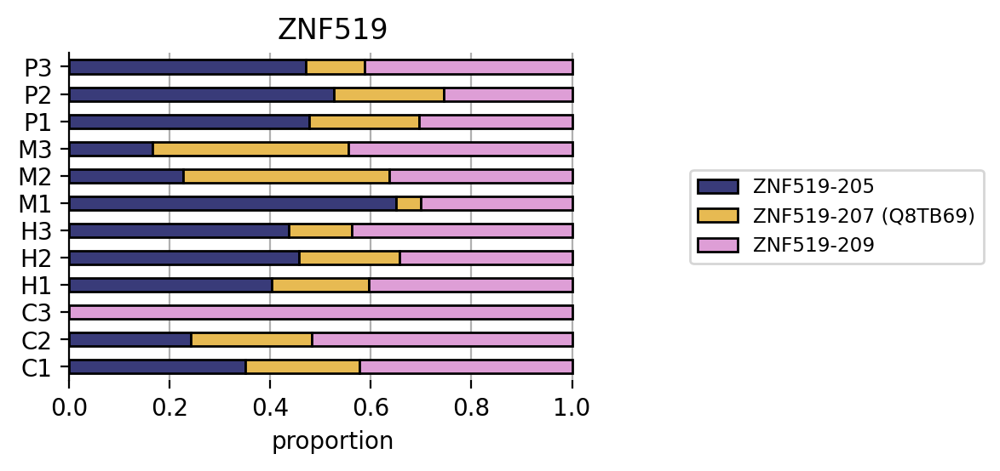

ZNF808


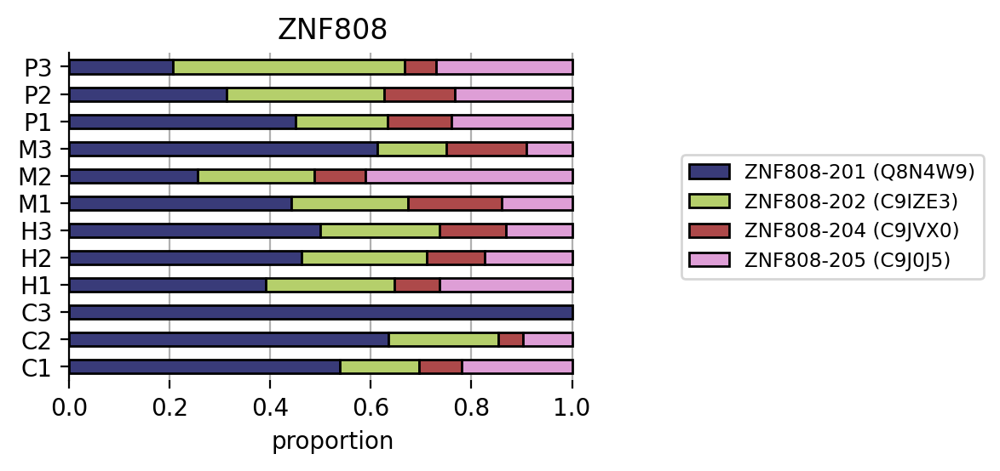

GIT2


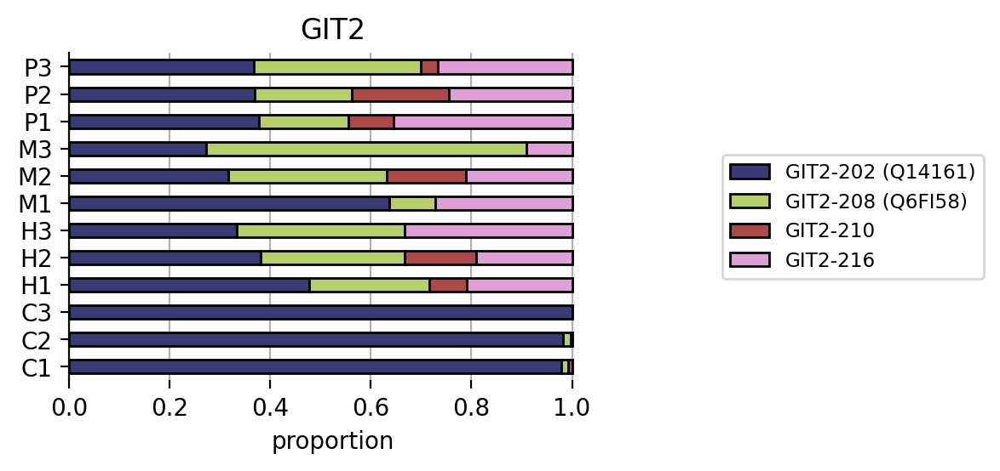

GMEB2


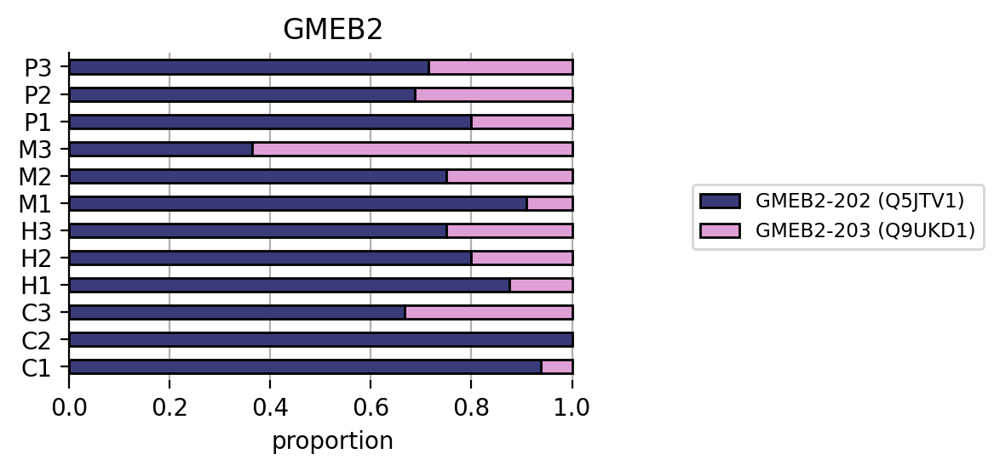

HES4


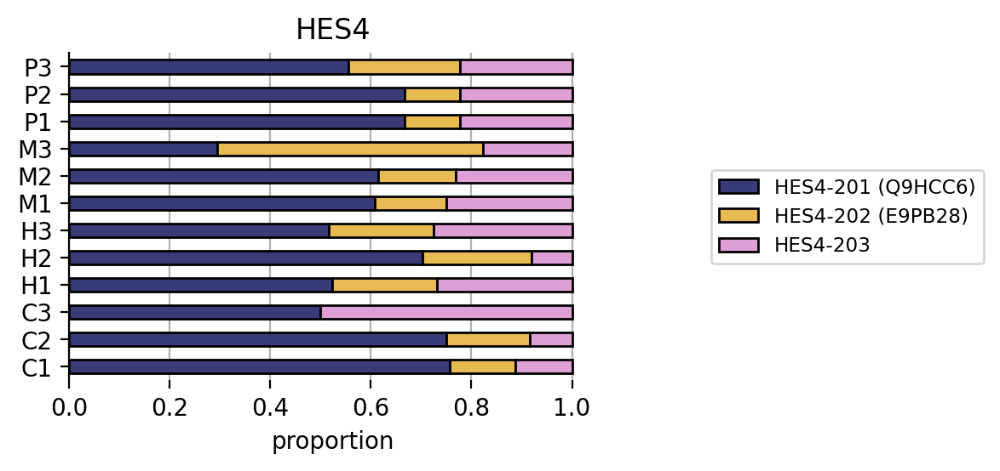

MAF


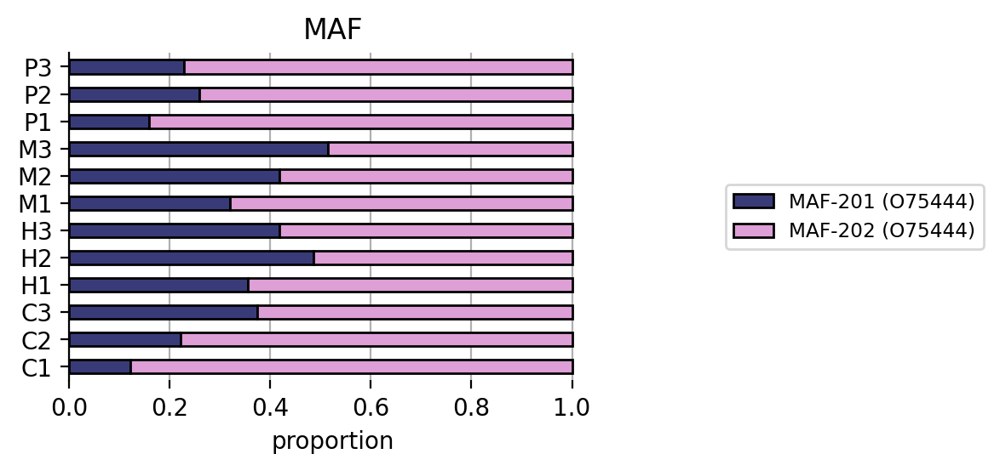

MECOM


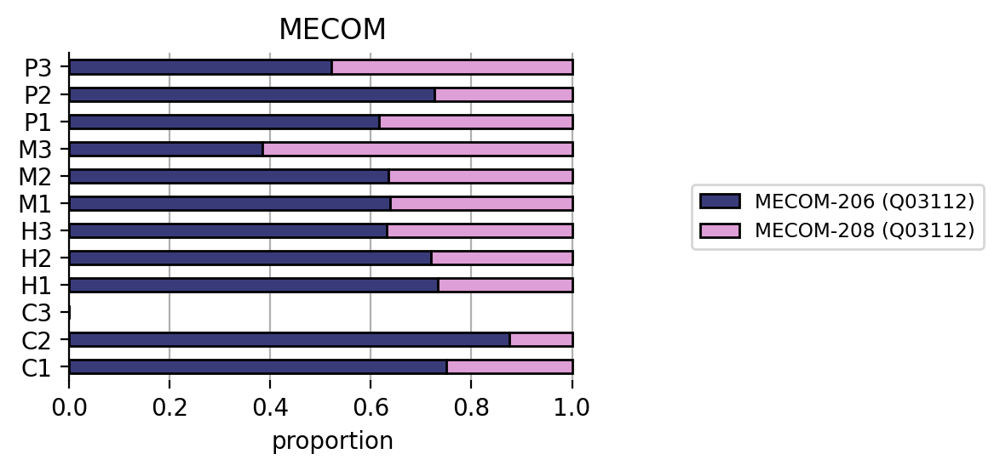

NAP1L1


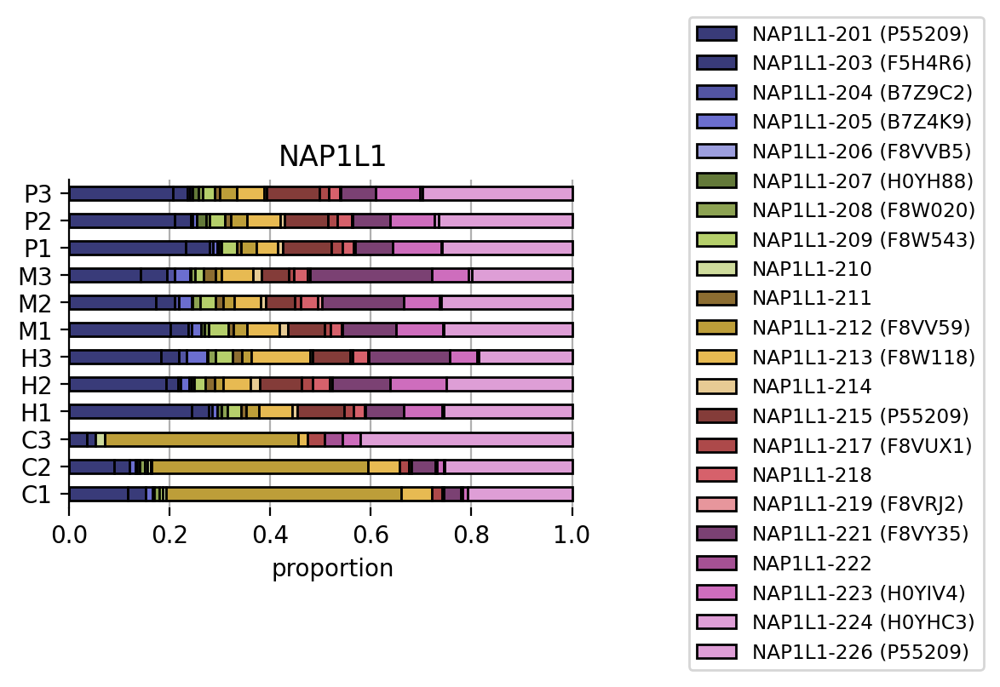

NONO


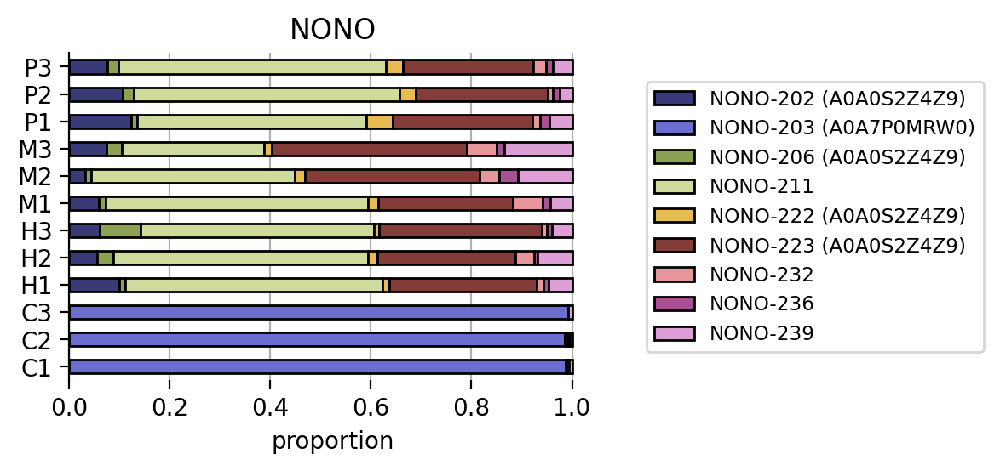

TCF3


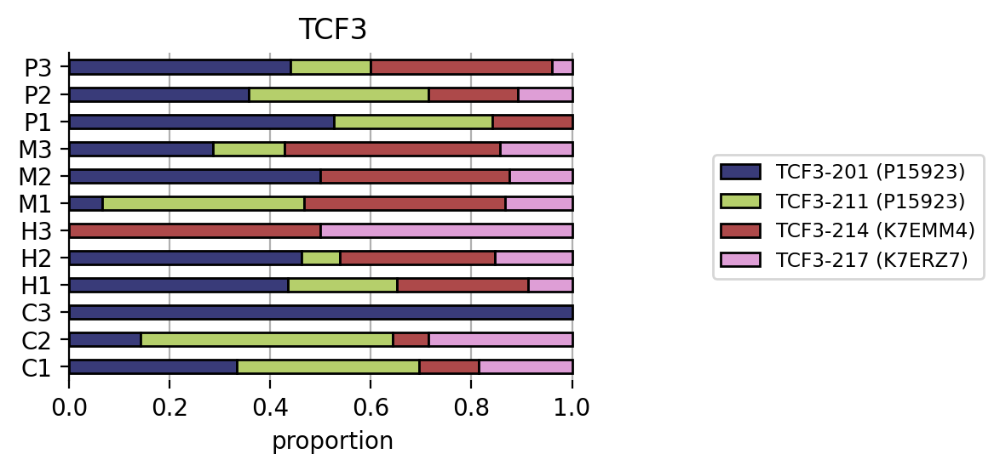

UBTF


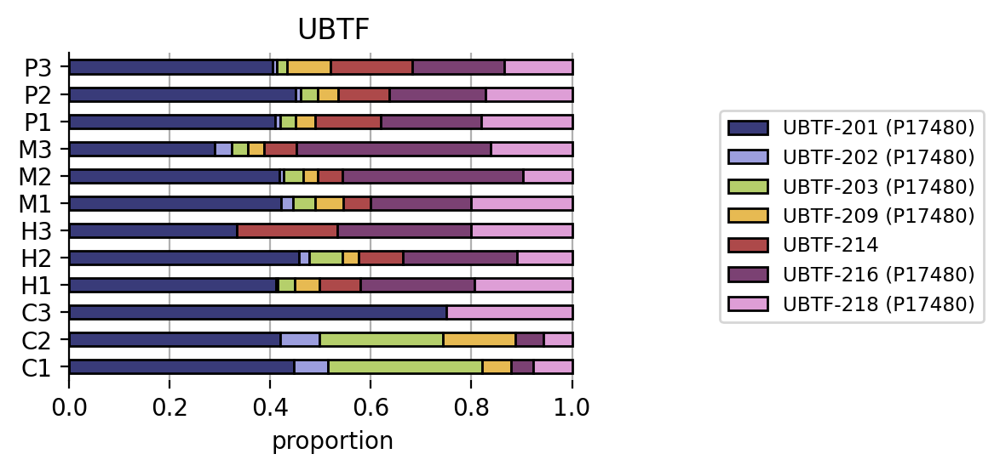

ZFP30


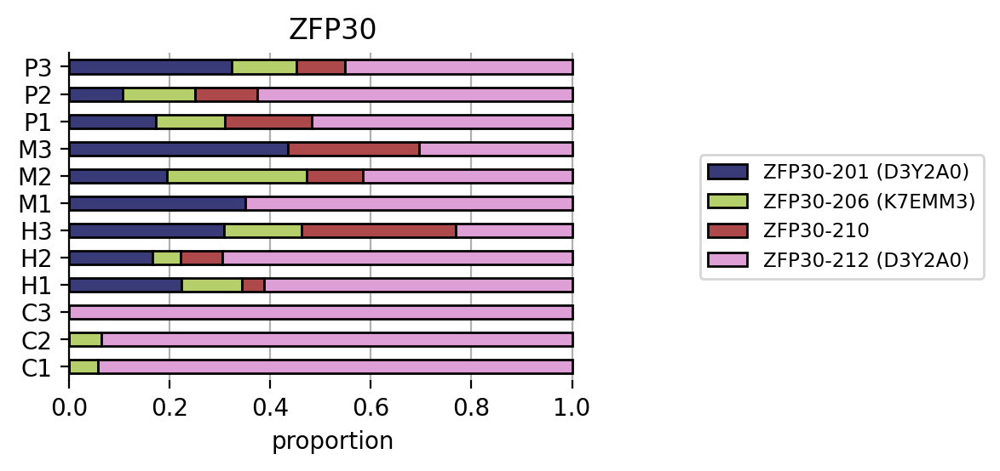

ZNF160


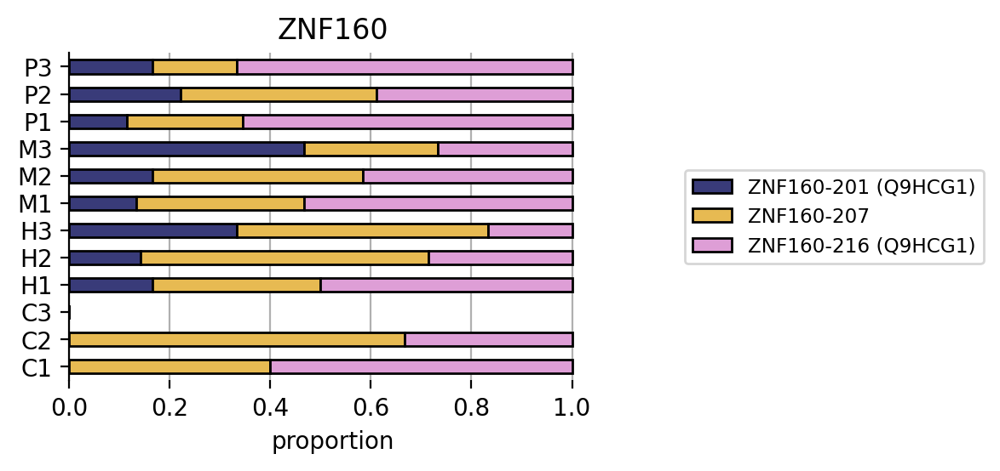

ZNF189


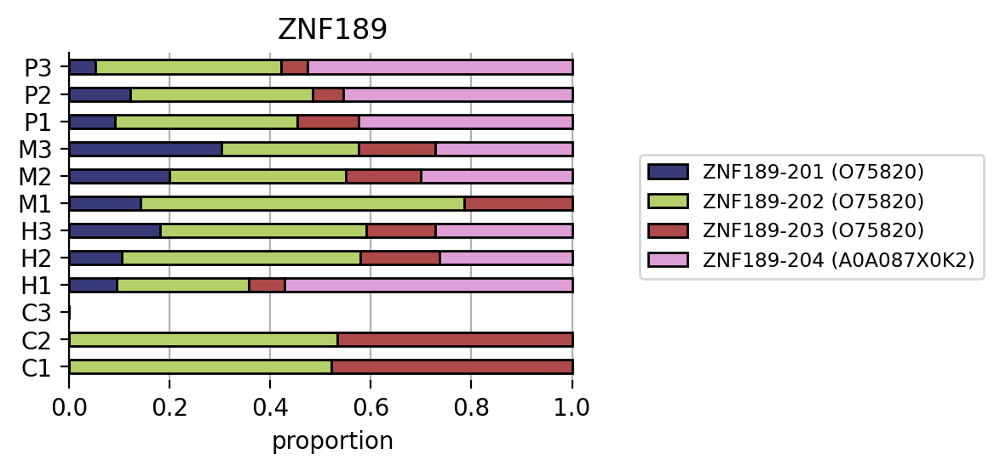

ZNF382


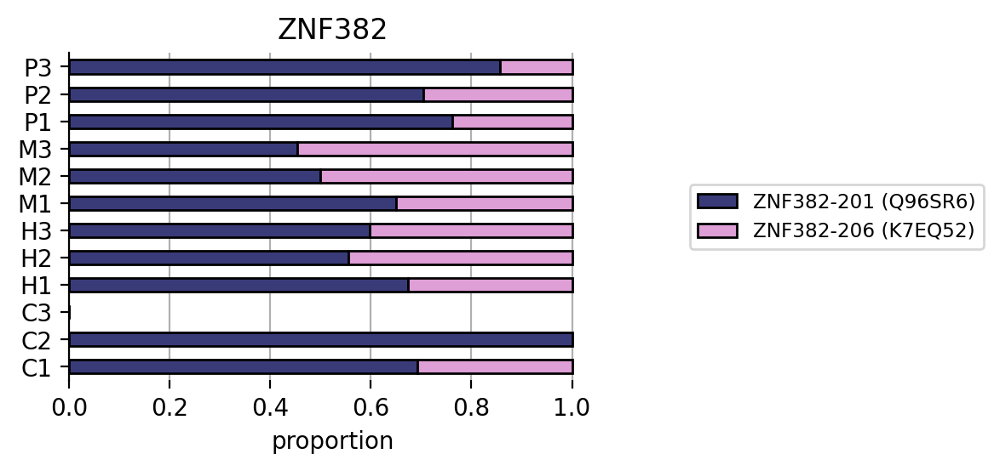

ZNF623


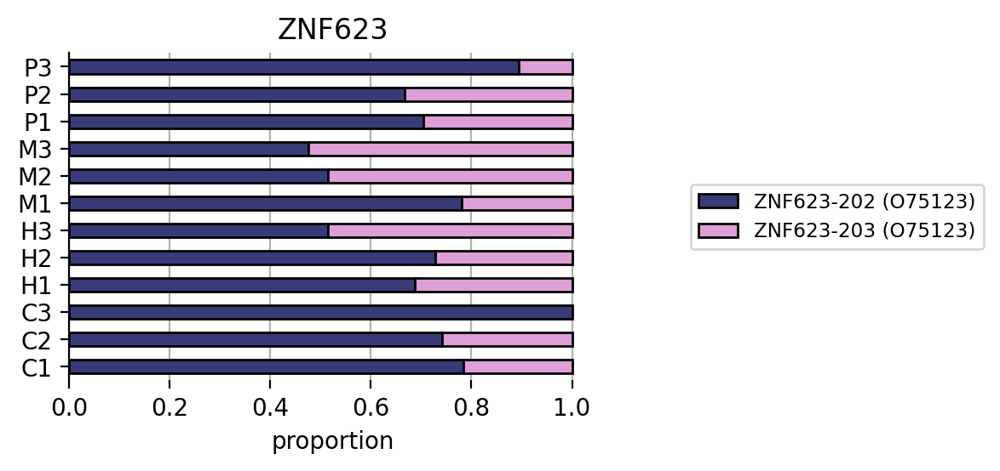

ZNF691


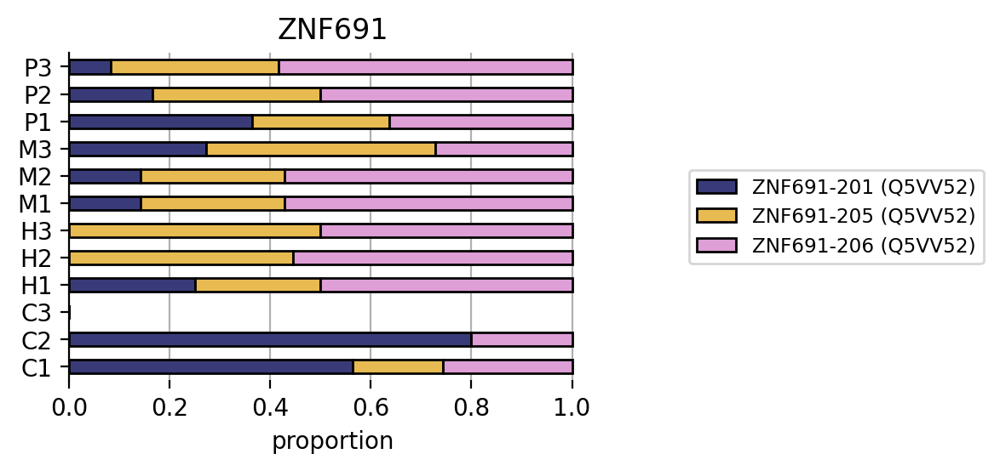

RUNX2


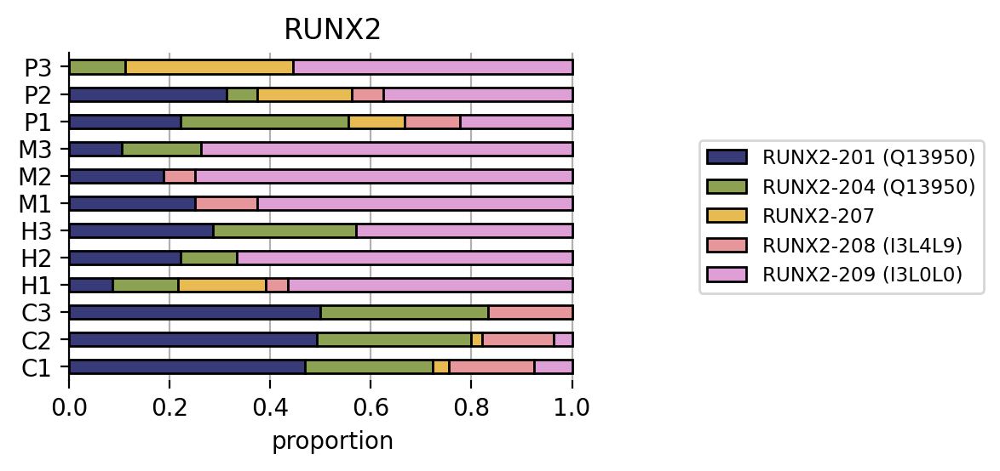

ZBTB1


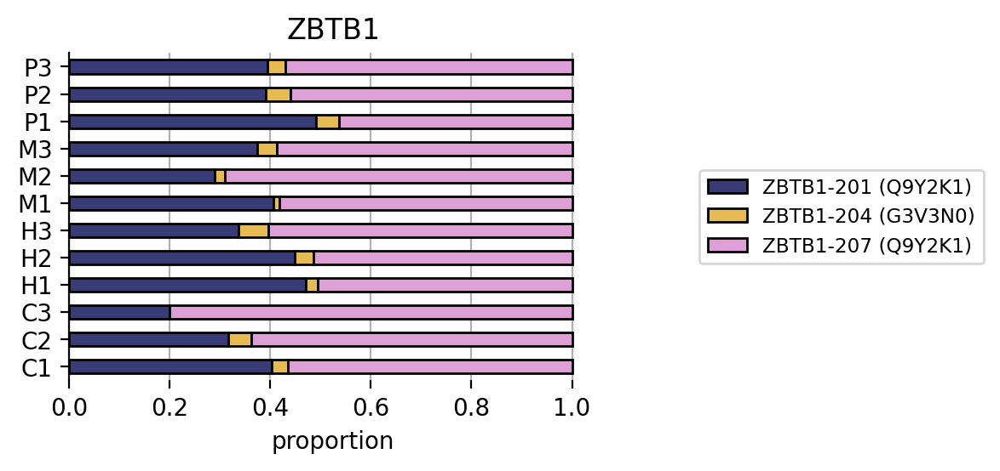

ZIK1


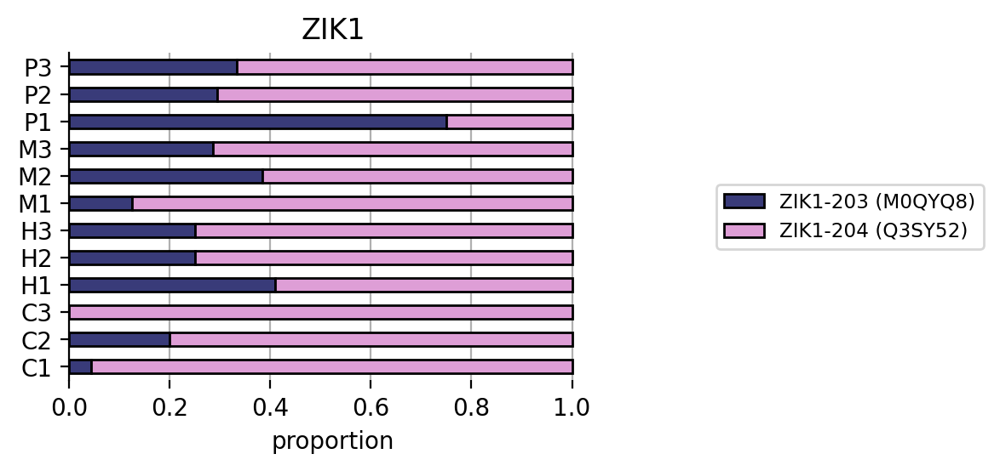

ZNF575


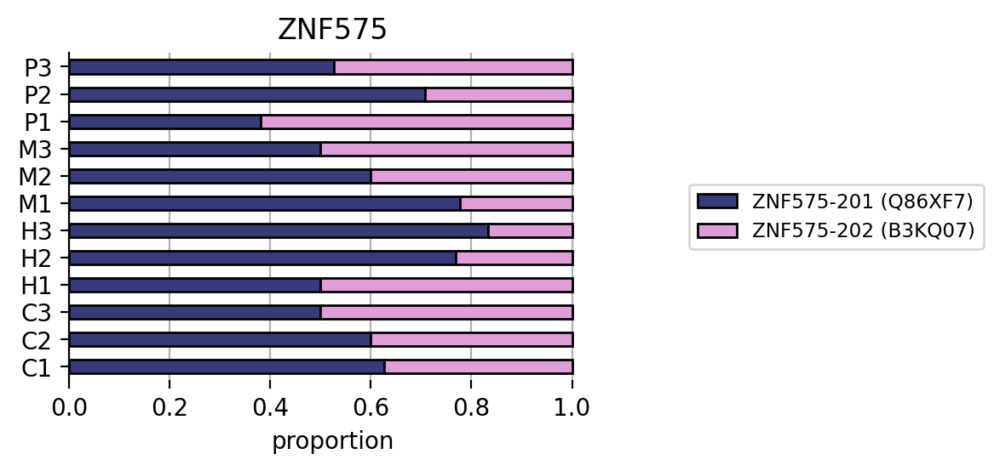

ZNF606


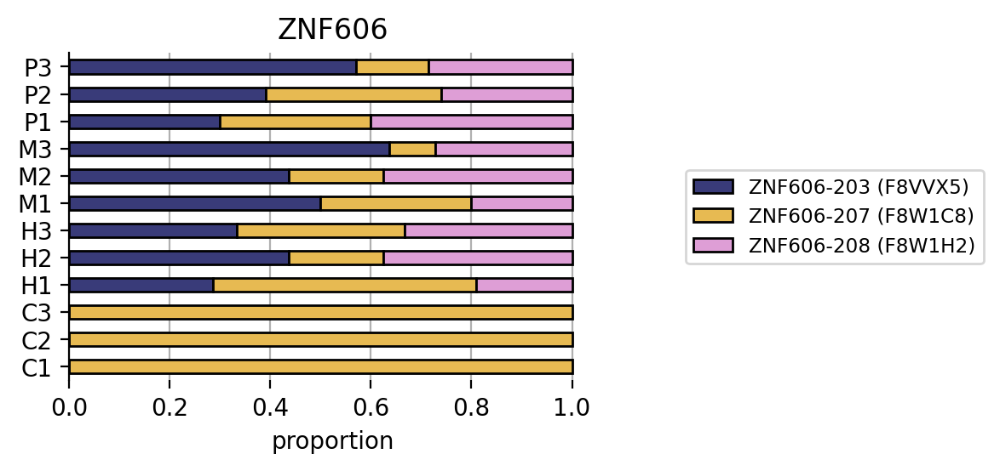

ZNF701


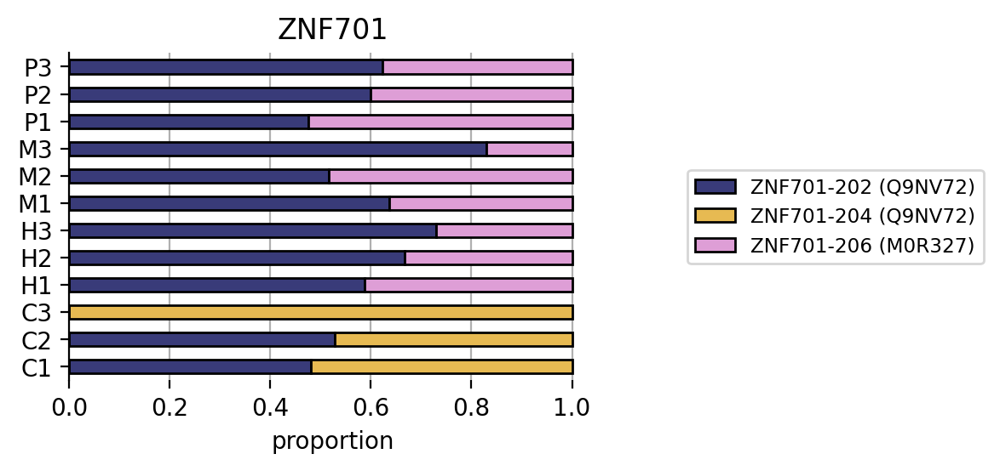

EWSR1


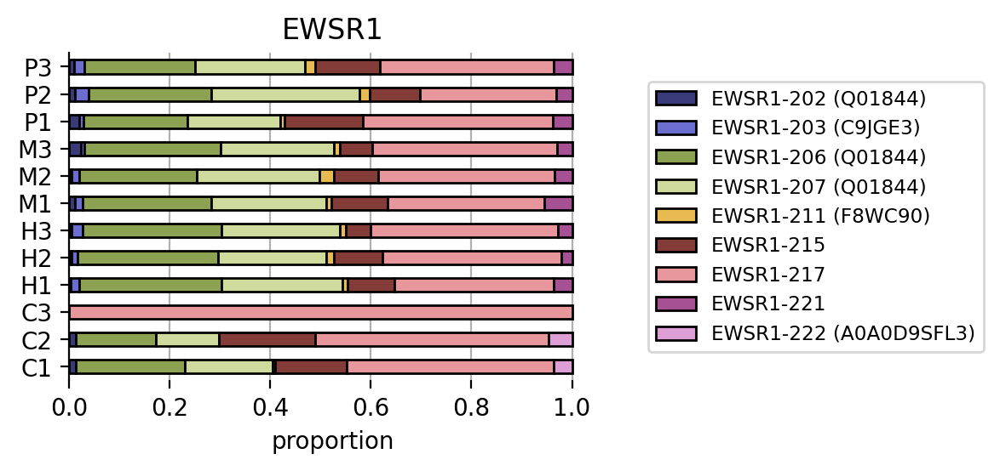

IRF1


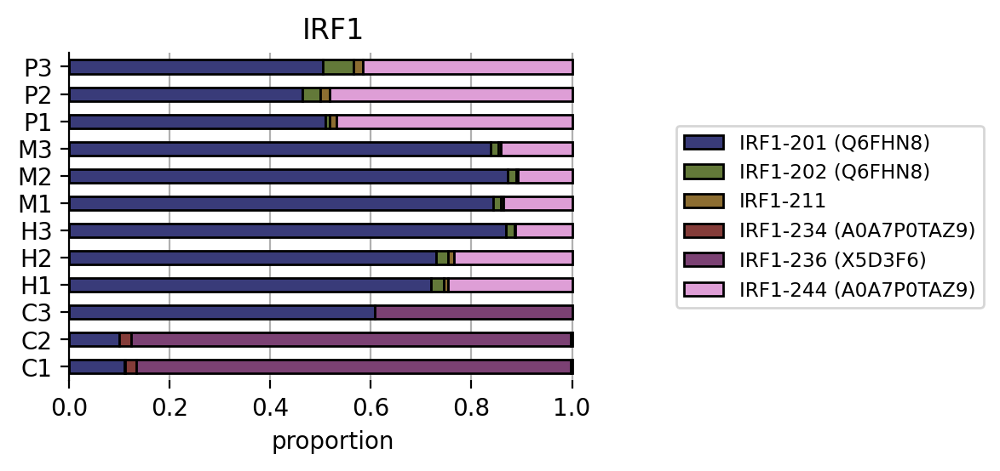

SP140


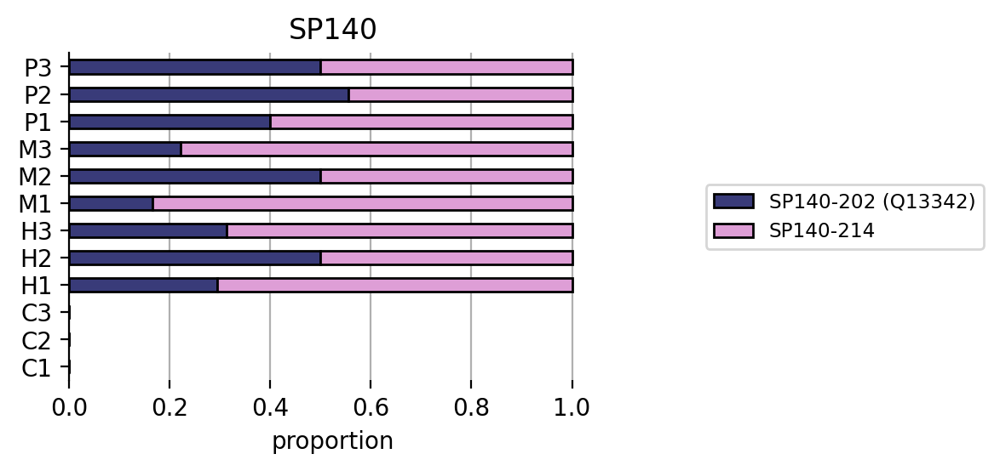

ZEB2


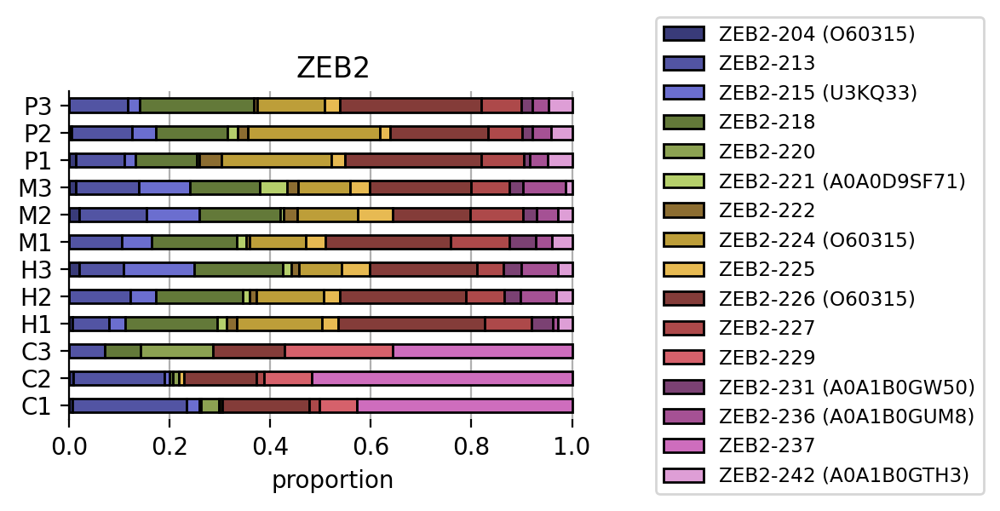

DIDO1


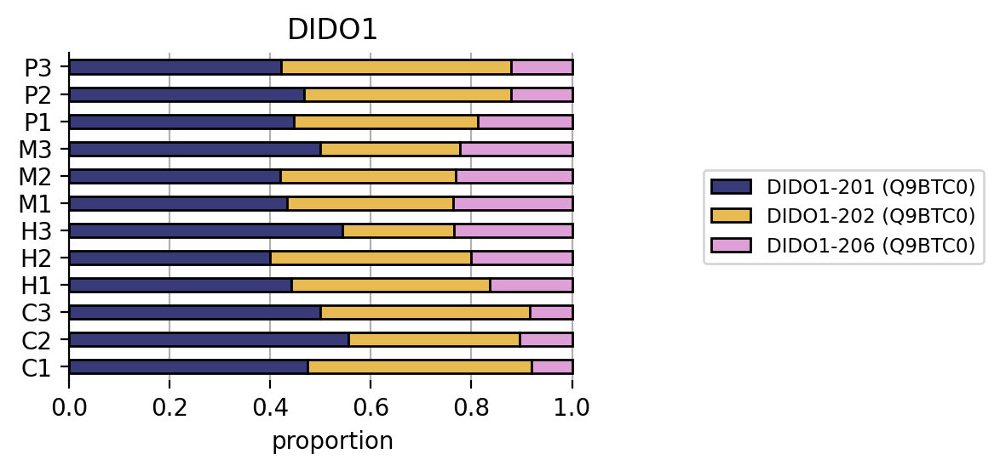

KDM4C


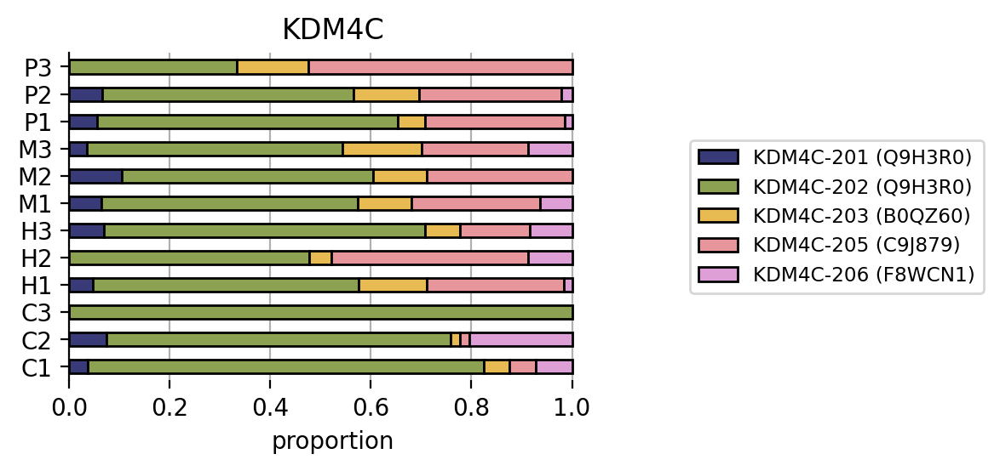

TEAD4


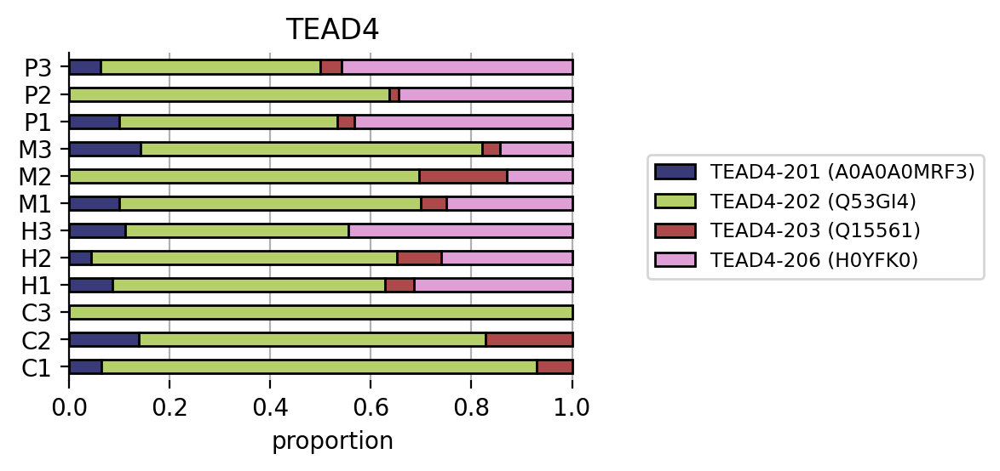

TRIM28


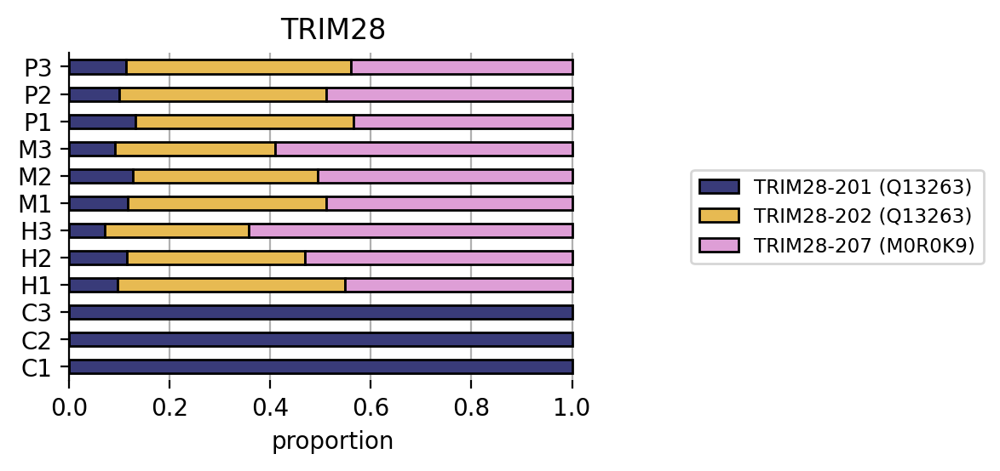

ZNF286A


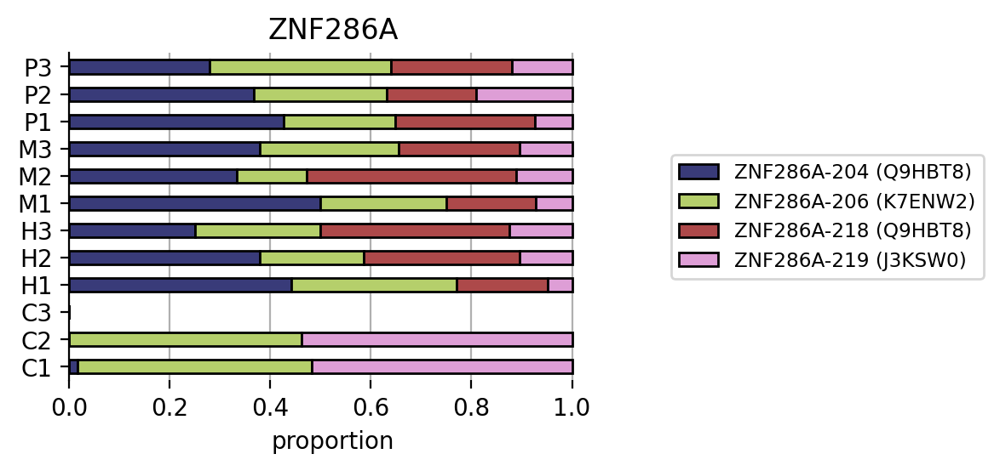

ZNF578


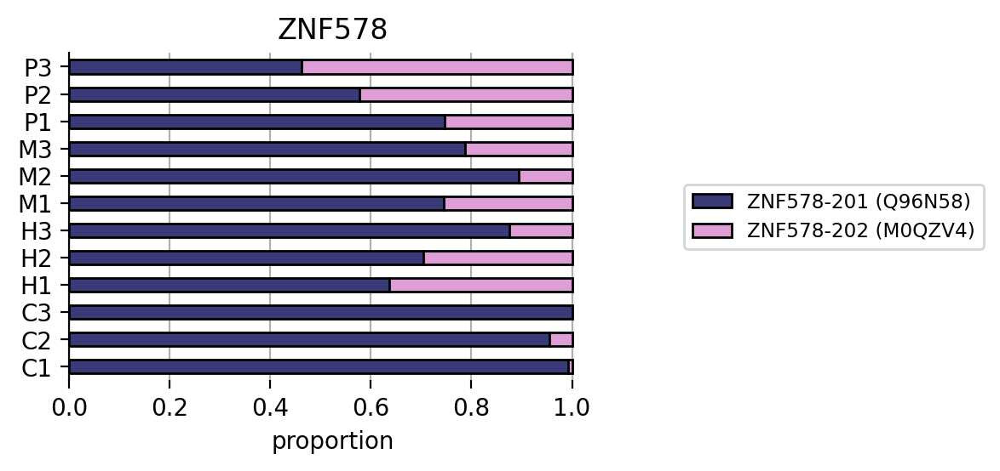

ZNF772


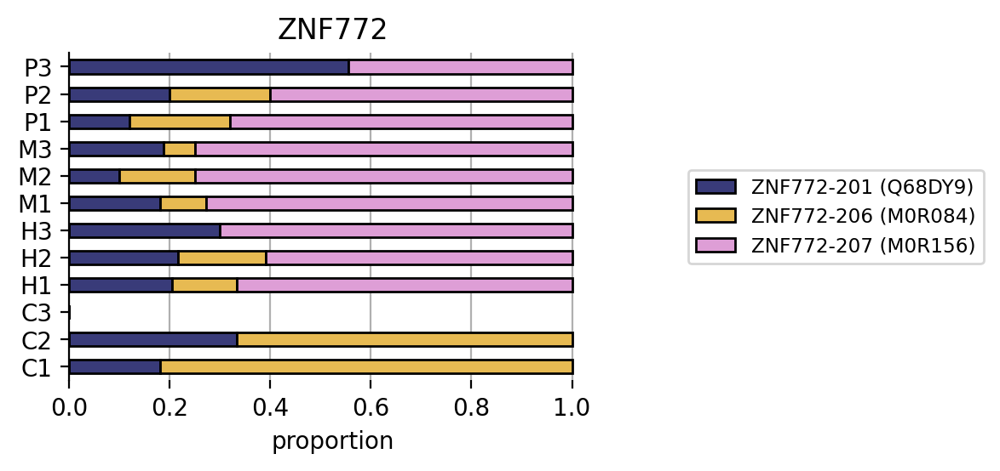

ZSCAN5A


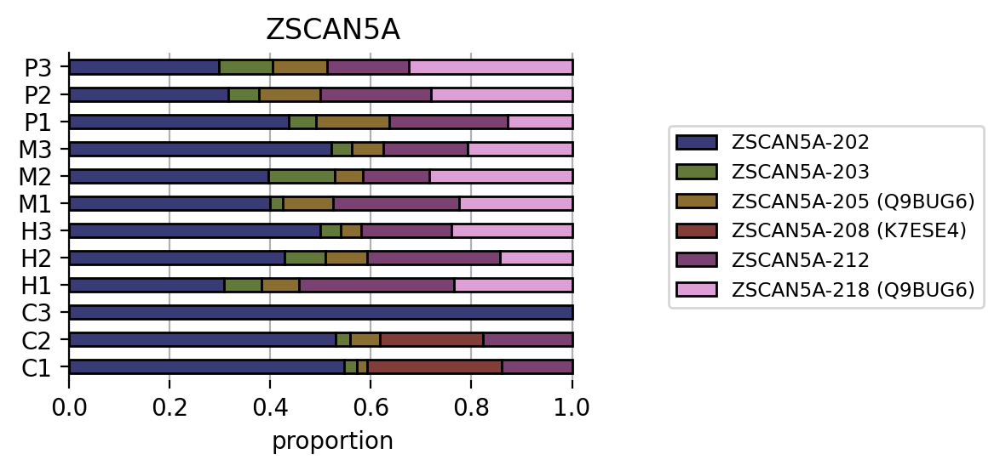

In [31]:
plot_df = pdf.copy()
print(plot_df.columns)
print()

annotation_cols = ['transcript_name', 'transcript_type', 'uniprot', 'A3', 'A5', 'AF', 'AL', 'MX', 'RI', 'SE']


# results = results[results['group'] != 'Control']


counter = 0

for gene in results['gene_name'].unique():#values:
    print(gene)

    gene_df = plot_df[plot_df['gene_name'] == gene].reset_index()

    # Option 1: using np.where
    gene_df['annotation'] = (
        gene_df['transcript_name']
        + np.where(
            gene_df['uniprot'].notna(),
            ' (' + gene_df['uniprot'] + ')',
            ''
        )
    )
    
    tmp = gene_df.set_index('annotation').copy()
    tmp = tmp[cols]
    tmp.columns = [x.replace("_pct", "") for x in tmp.columns]

    plt.rcParams['figure.dpi'] = 200
    plt.rcParams['figure.figsize'] = 4, 2.5 #3.75, 1.5

    # 1) Plot figure without legend
    fig1, ax1 = plt.subplots()
    tmp.T.plot(
        kind='barh',
        stacked=True,
        ec='k',
        zorder=10,
        width=0.5,
        cmap='tab20b',
        ax=ax1
    )
    ax1.grid(axis='x', zorder=0)
    ax1.set_xlabel("proportion")
    sns.move_legend(
        ax1,
        loc='center right',
        title="",
        bbox_to_anchor=(1.75, 0.5),
        fontsize='small',
    )
    ax1.set_title(gene)
    sns.despine(bottom=True)
    plt.show()
    
    # break
    # # break
    # counter += 1
    # if counter >= 10:
    #     break
    


63
MYOD1


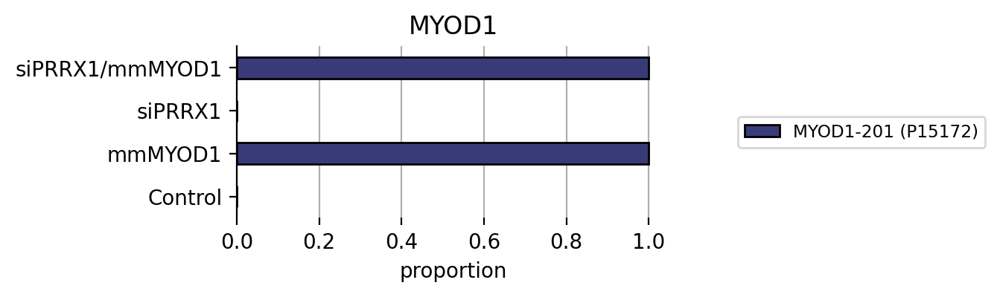

PRRX1


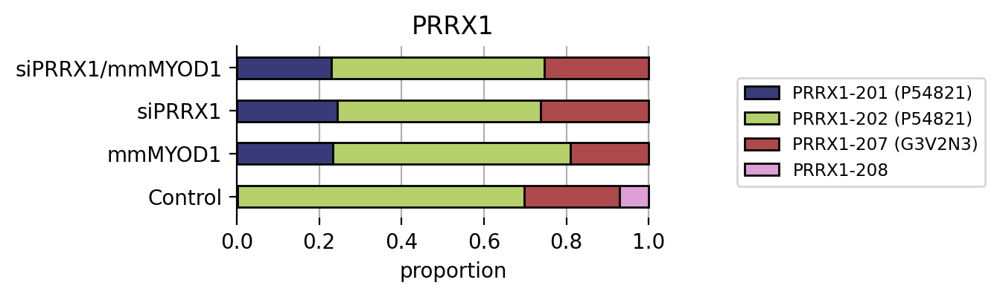

CEBPB


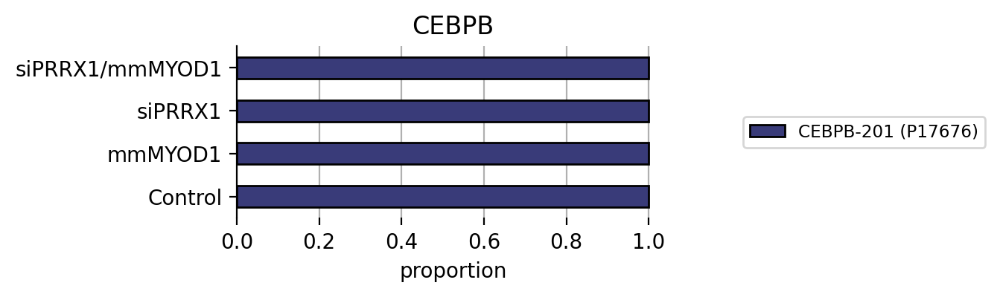

TWIST1


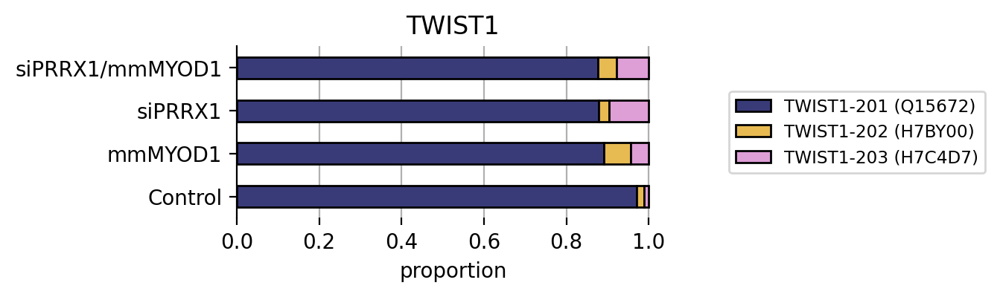

TWIST2


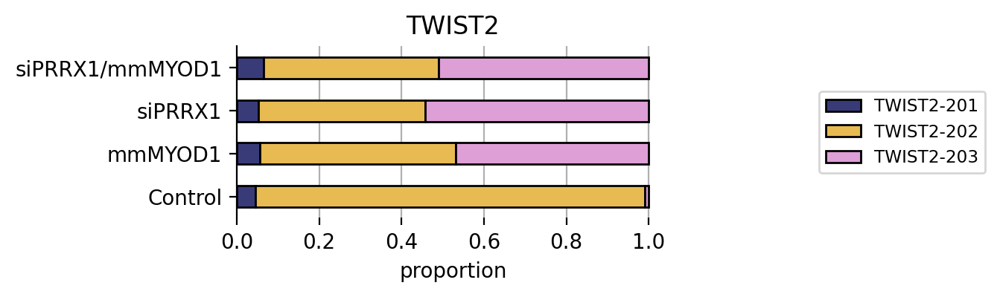

ZEB1


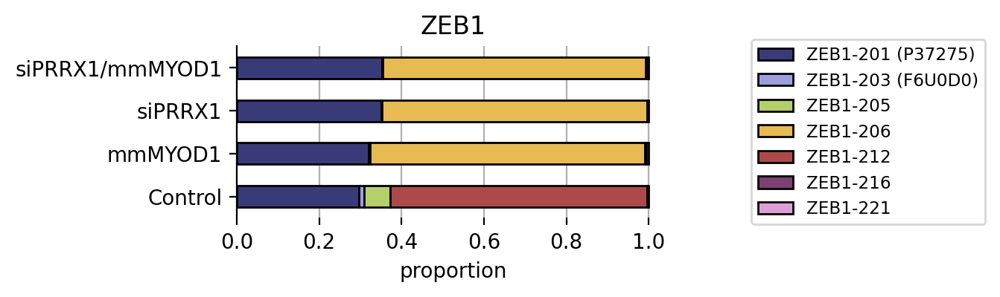

VGLL4


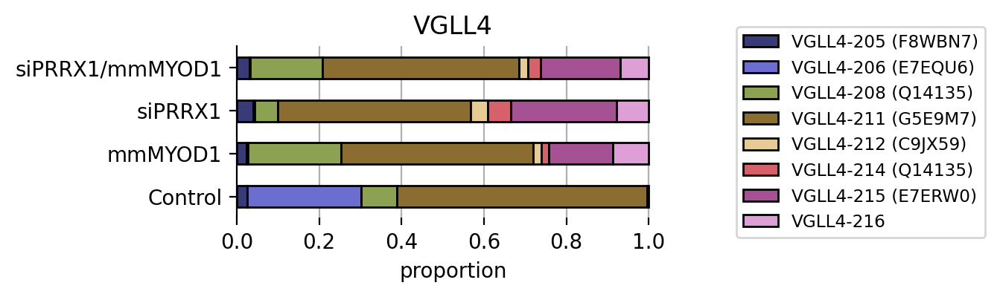

SIX1


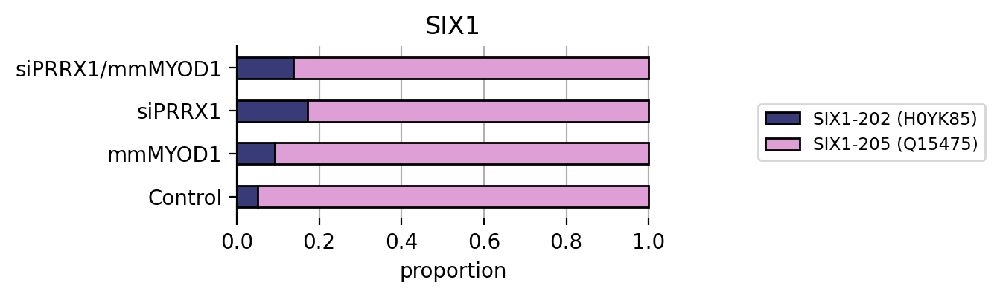

PBX1


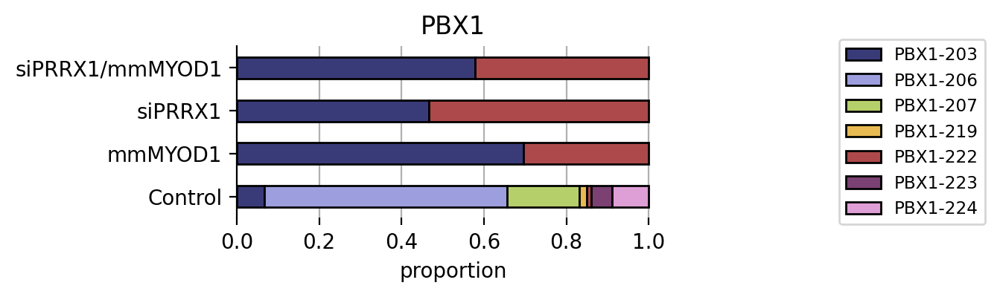

CHD2


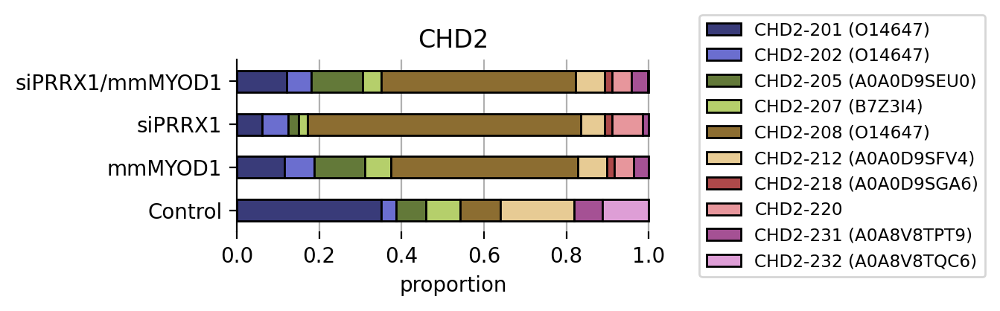

ID1


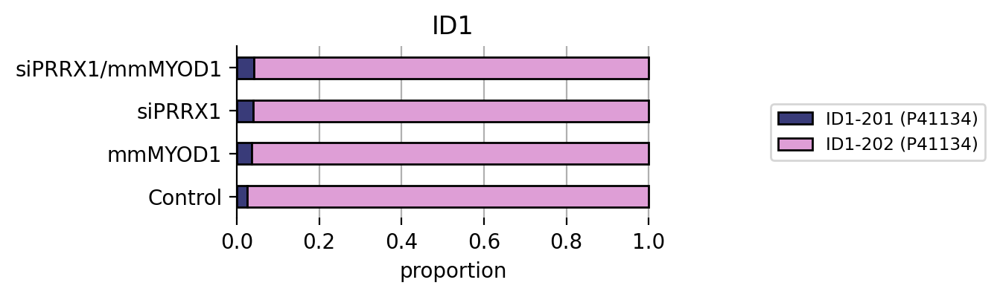

ID2


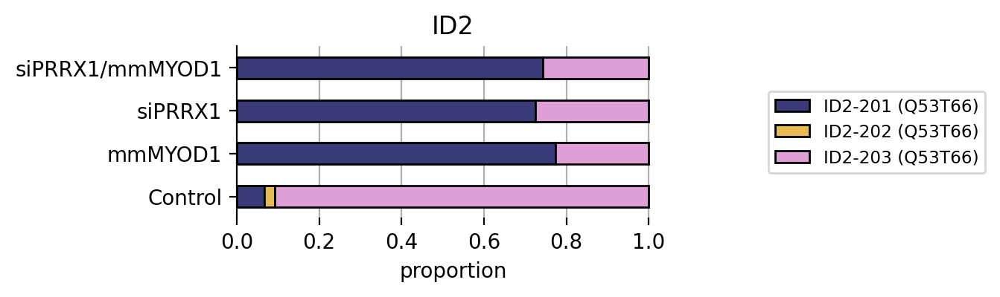

ID3


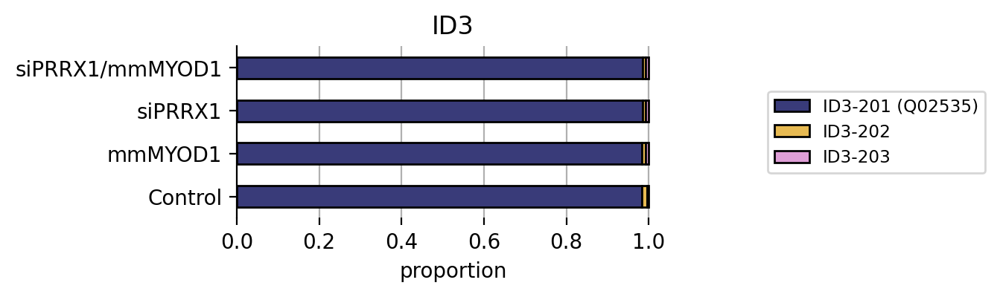

SP1


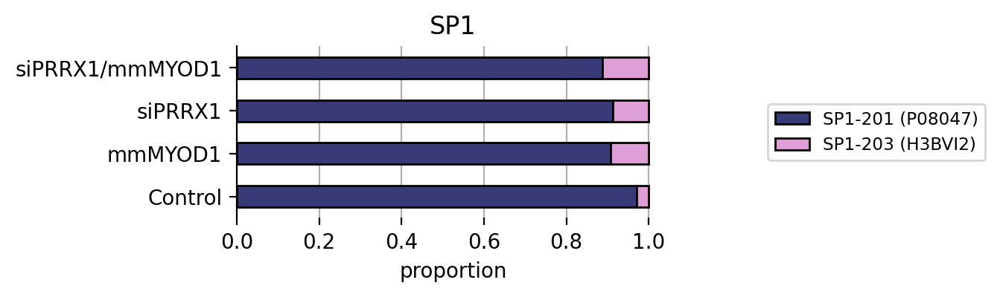

SNAI1


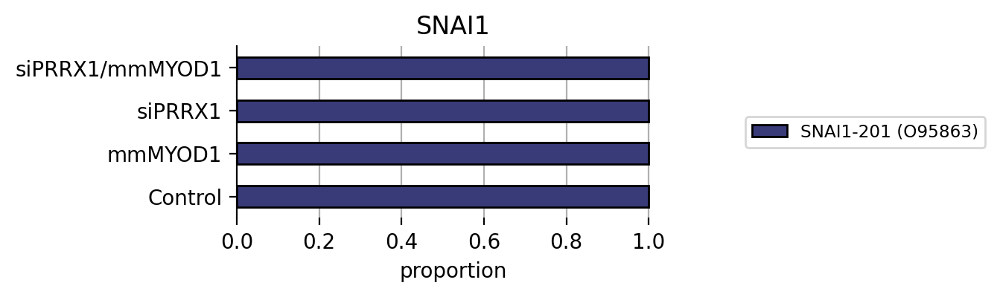

SNAI2


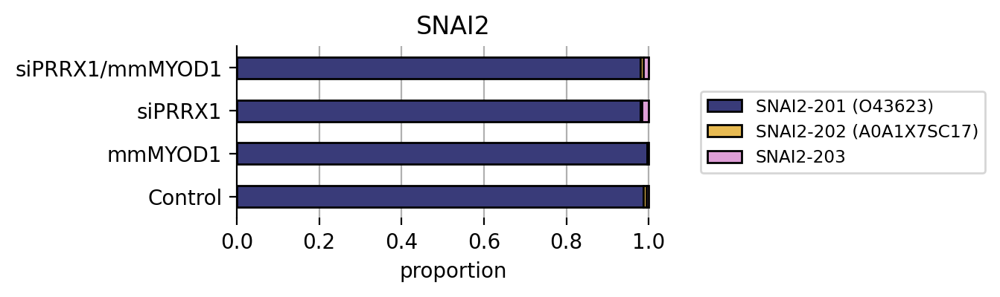

TGFBR1


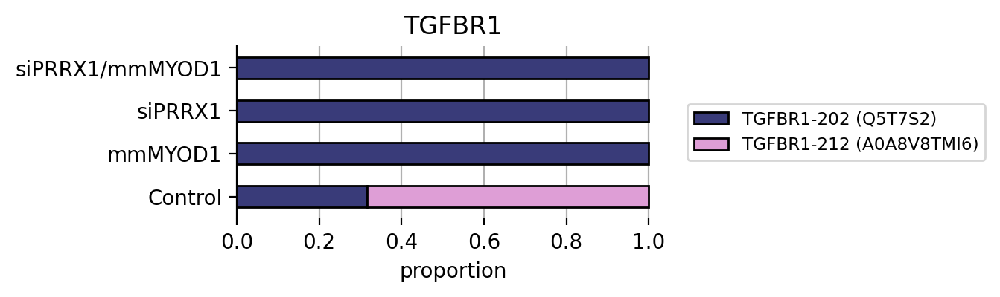

EP300


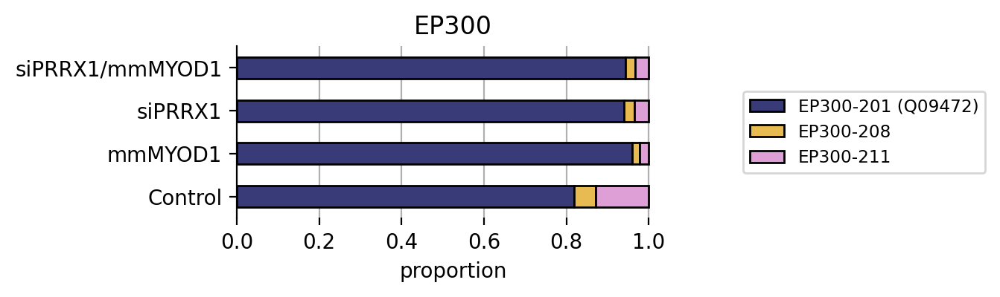

CREBBP


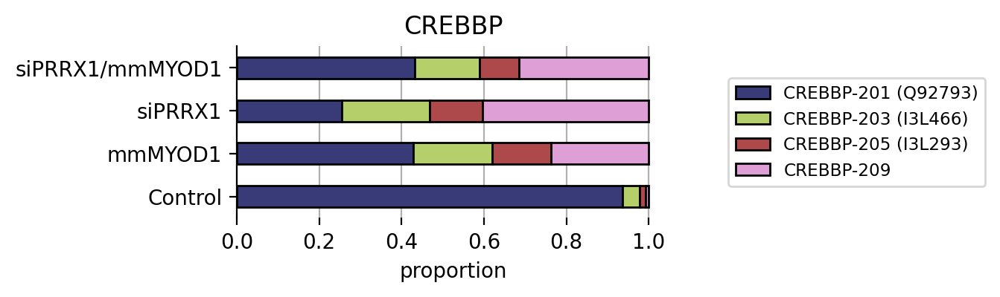

KAT2B


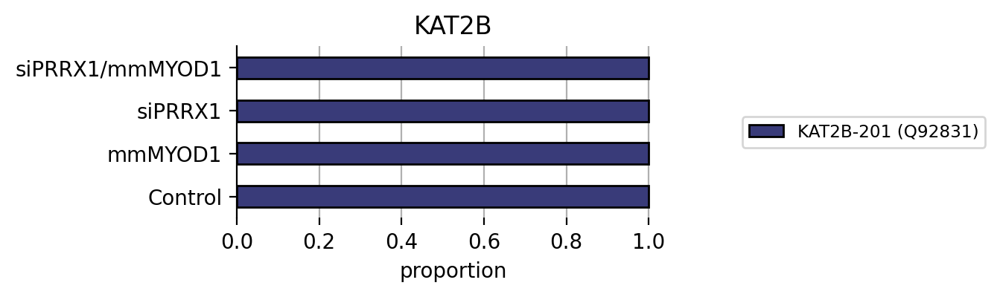

HDAC1


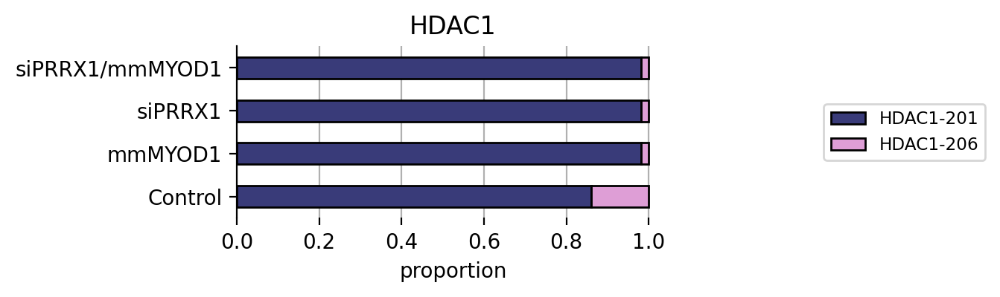

HDAC9


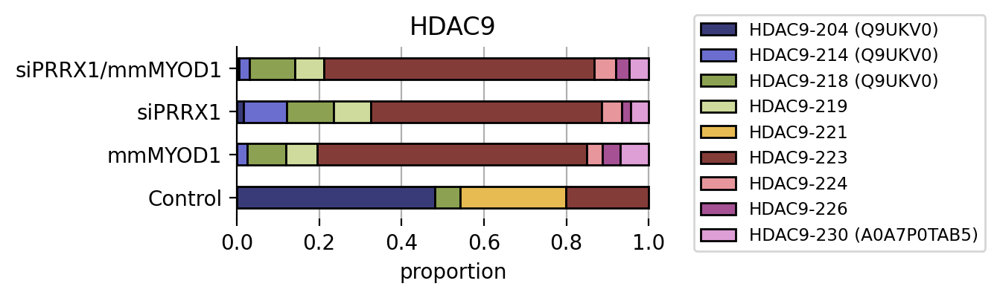

EZH2


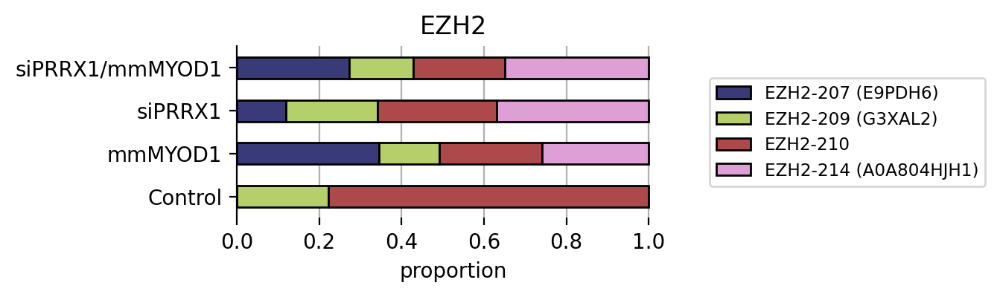

CCND1


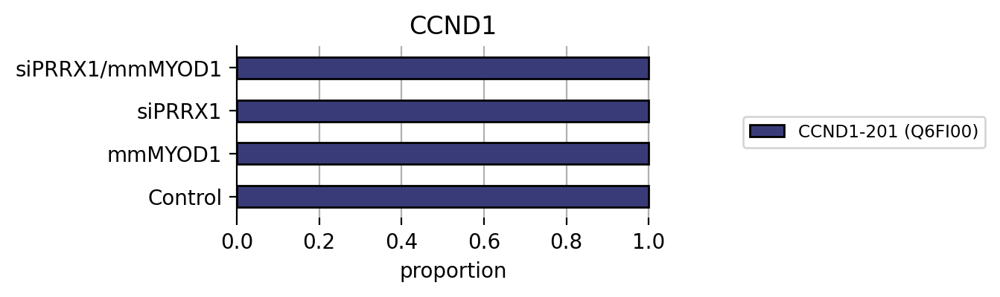

CHEK2


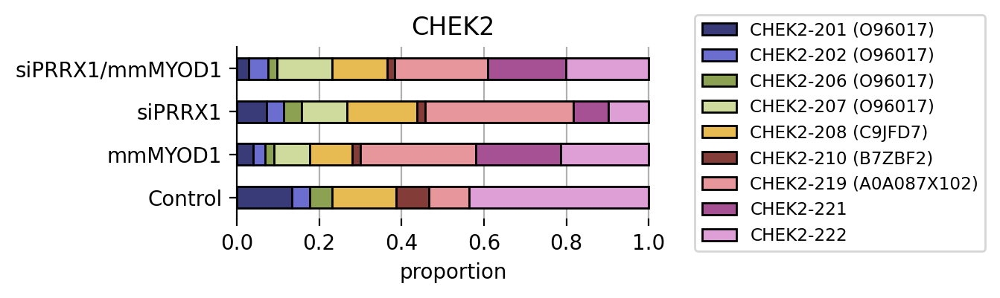

CDK1


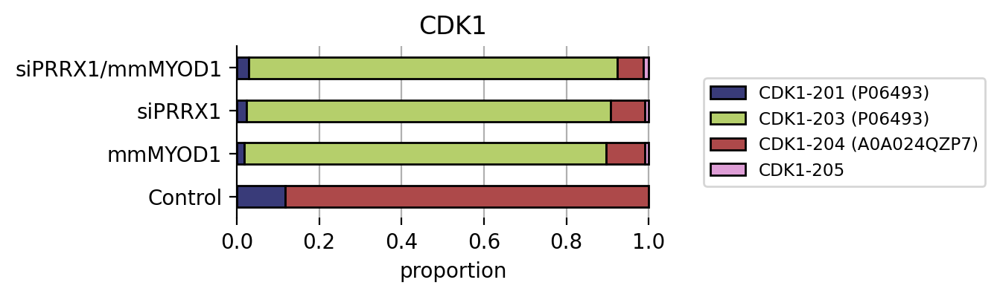

CDK4


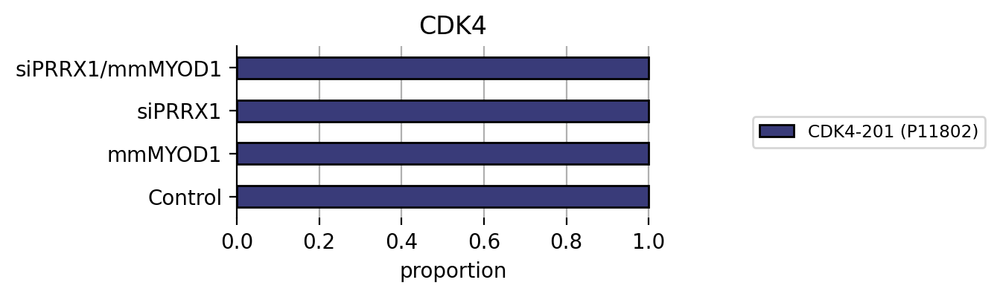

UBE2C


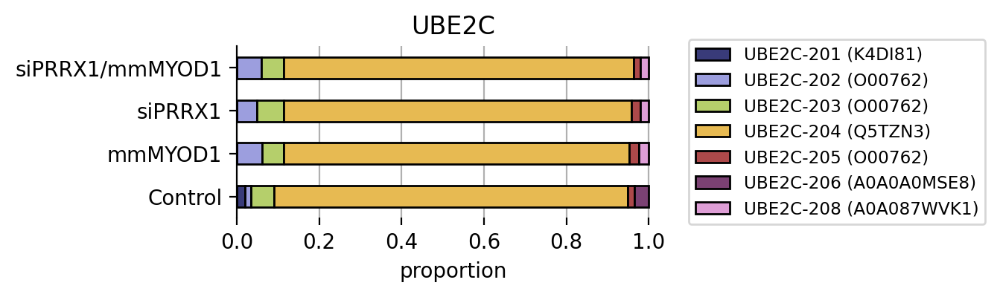

MYC


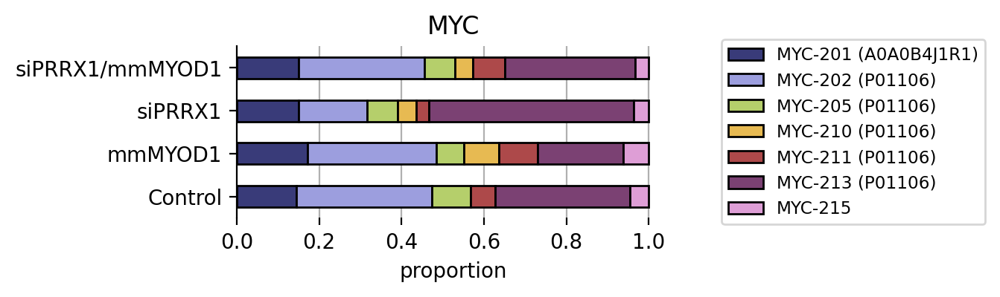

FOXM1


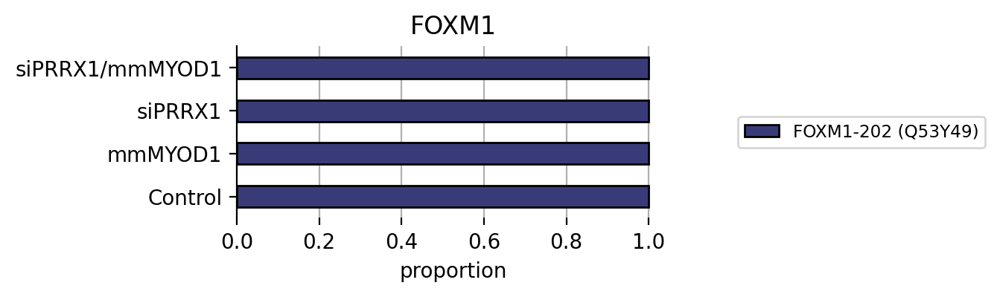

MYBL2


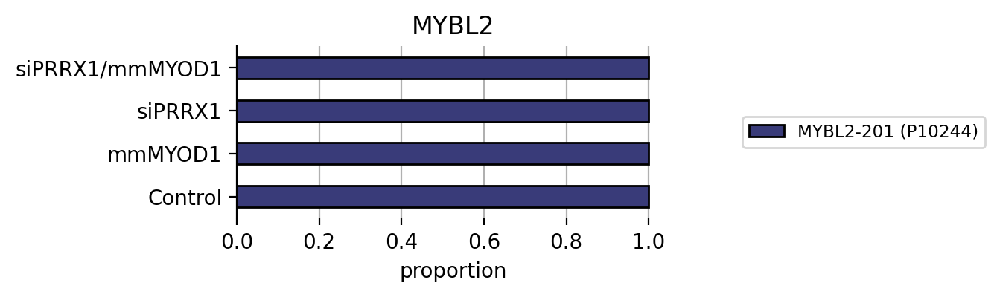

LEO1


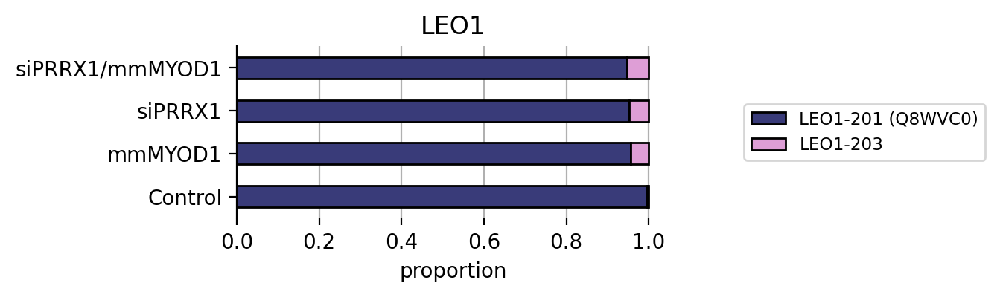

RBL1


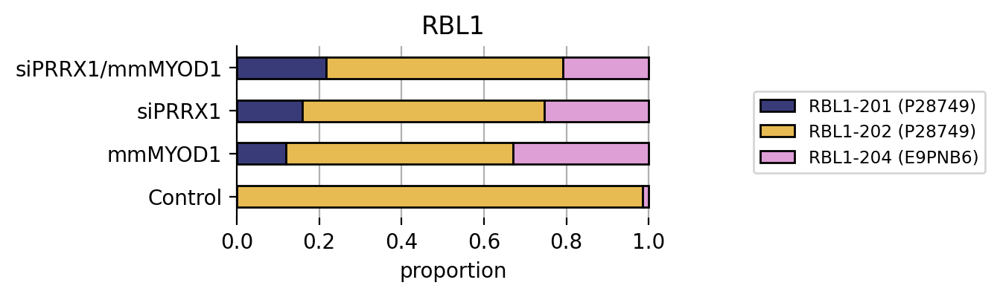

RBL1


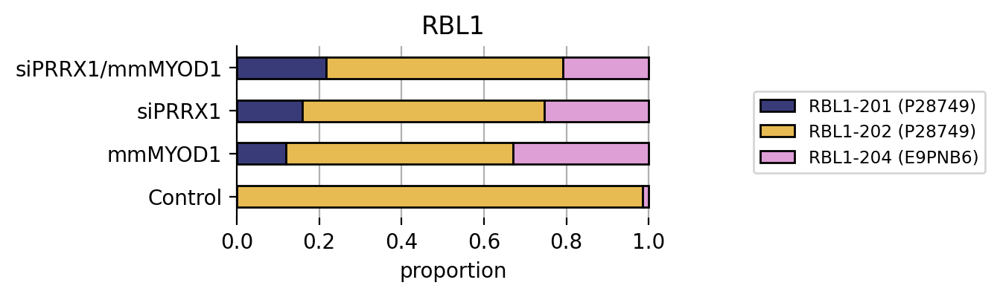

RB1


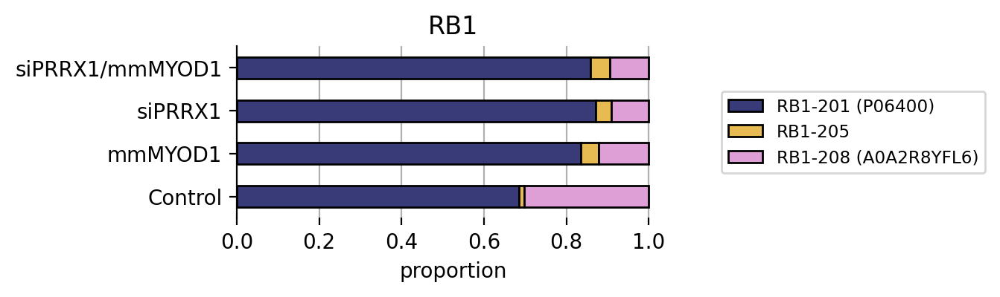

ITGB1


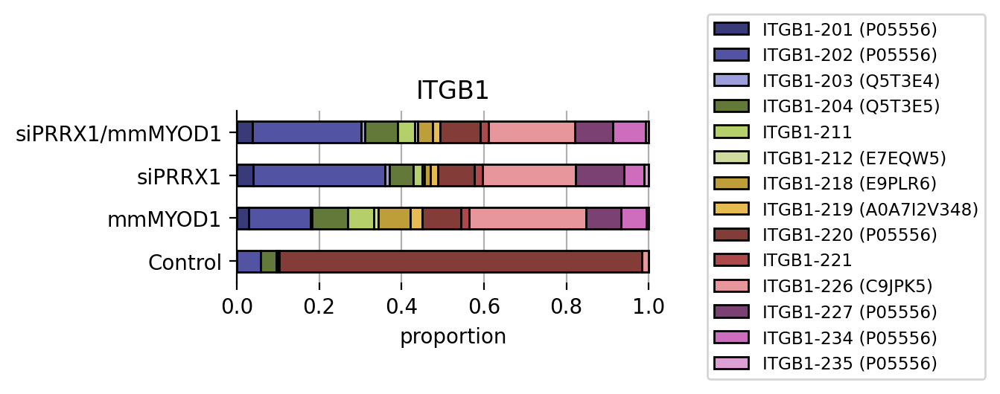

RUNX1


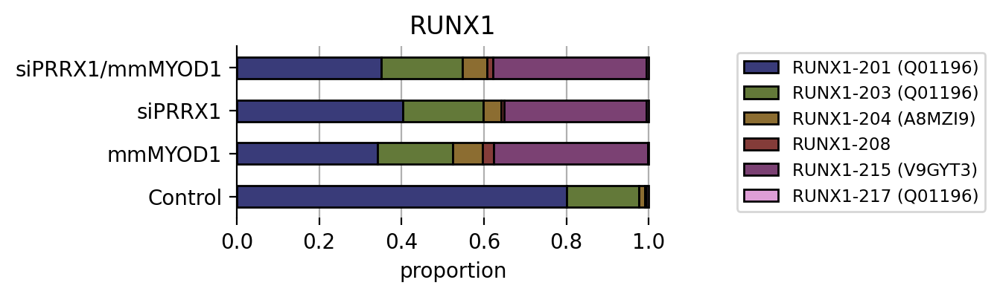

NFKB1


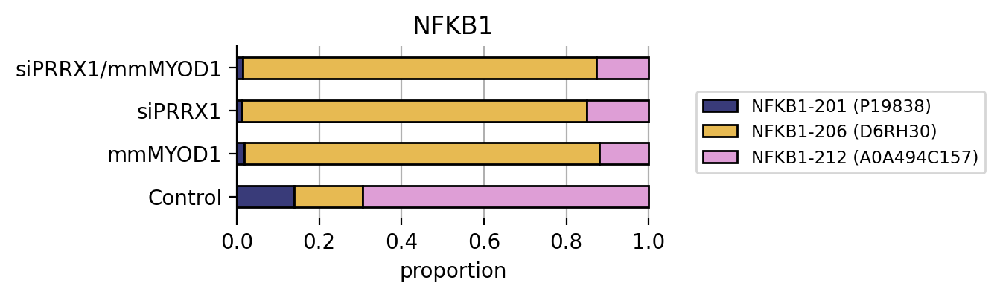

JUN


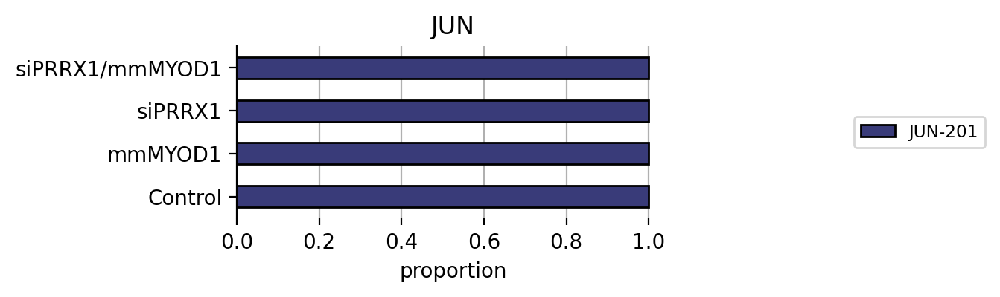

JUNB


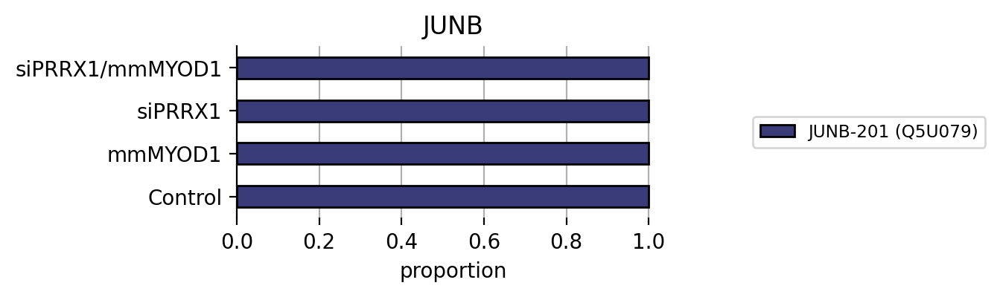

FOS


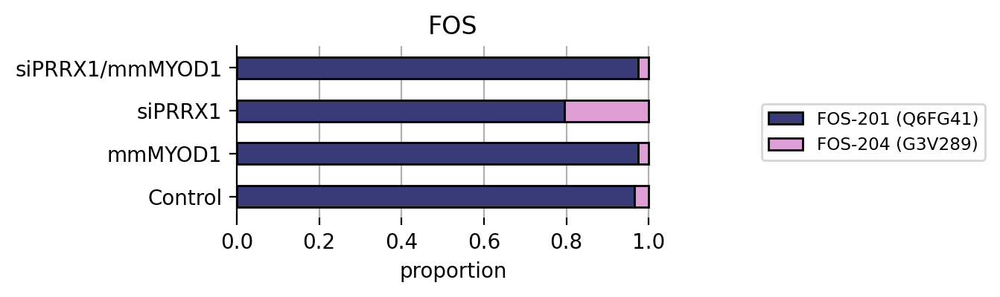

FOSB


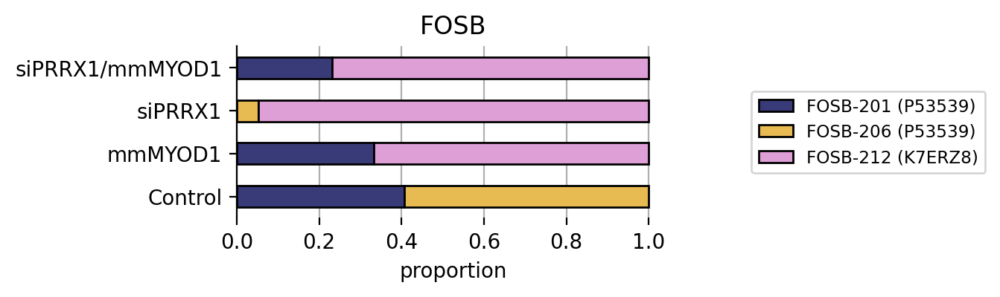

COL1A1


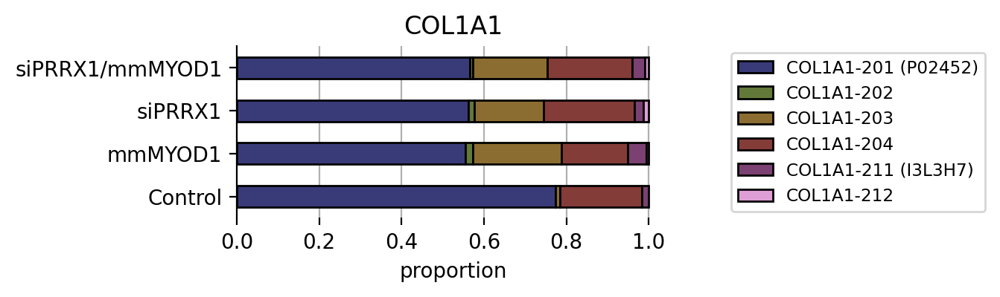

COL1A2


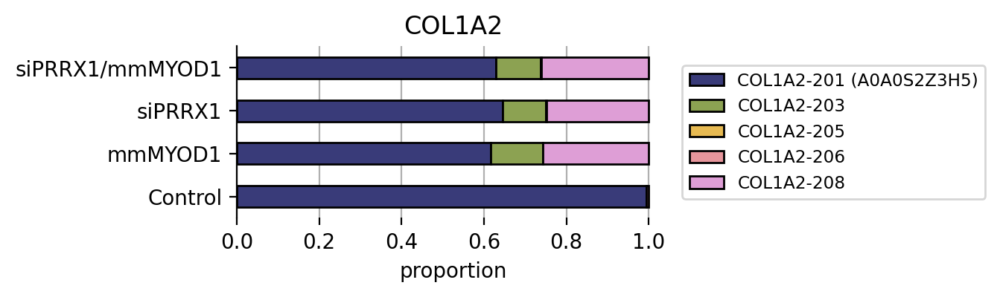

S100A6


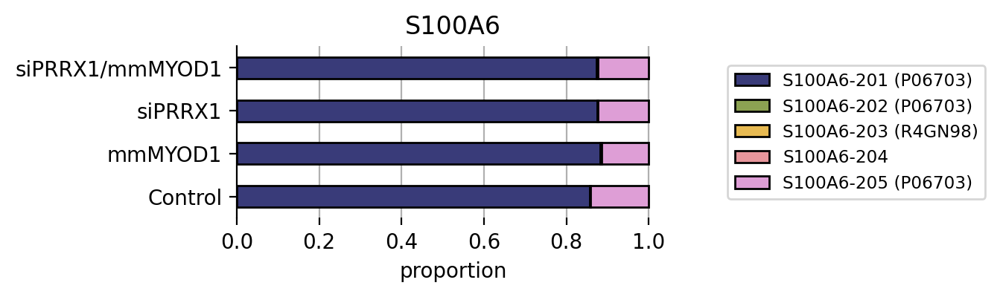

PPP2CA


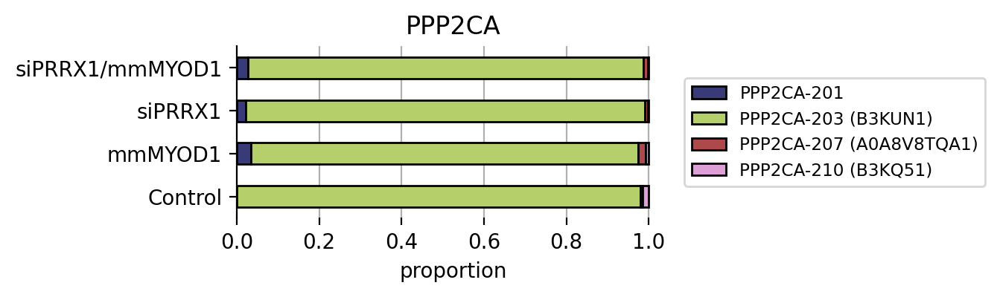

PPP1CA


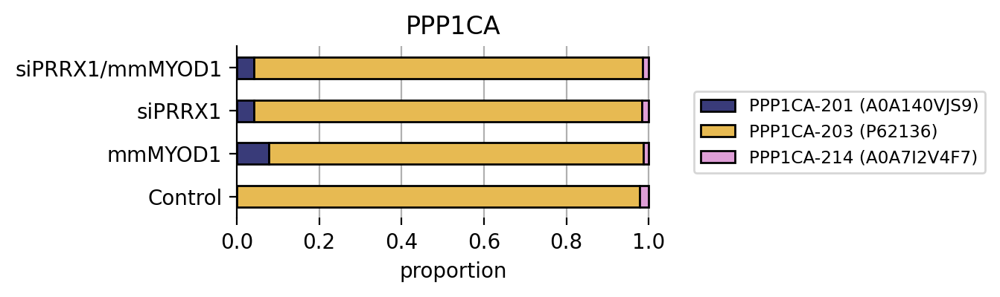

MEF2A


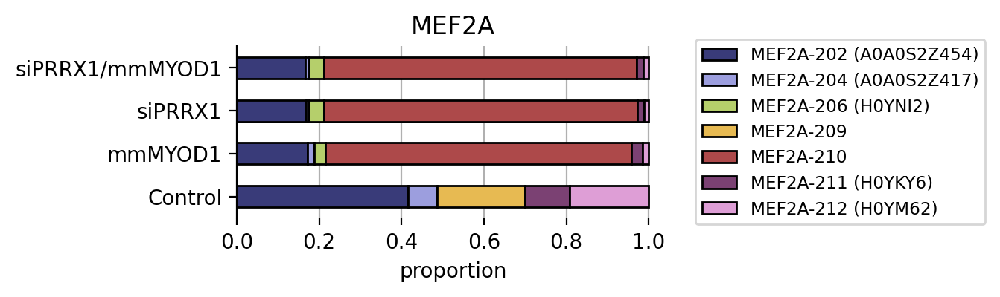

PCLAF


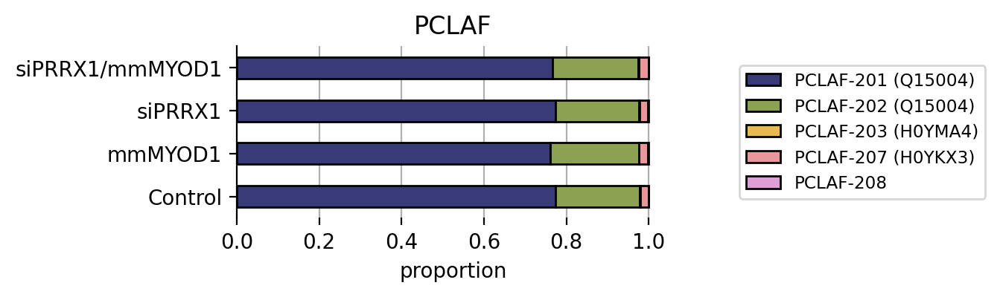

NUMB


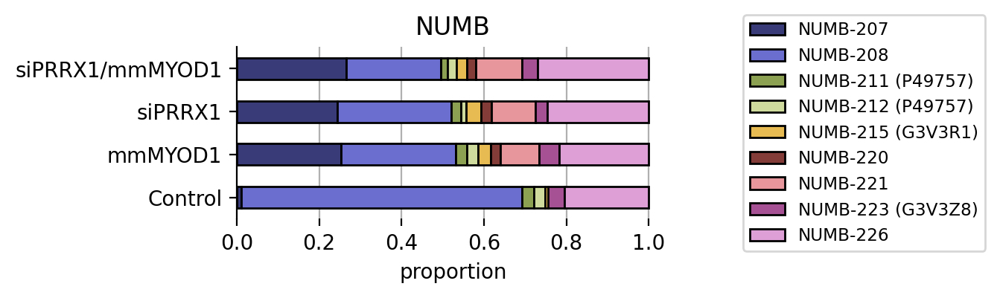

PARD3


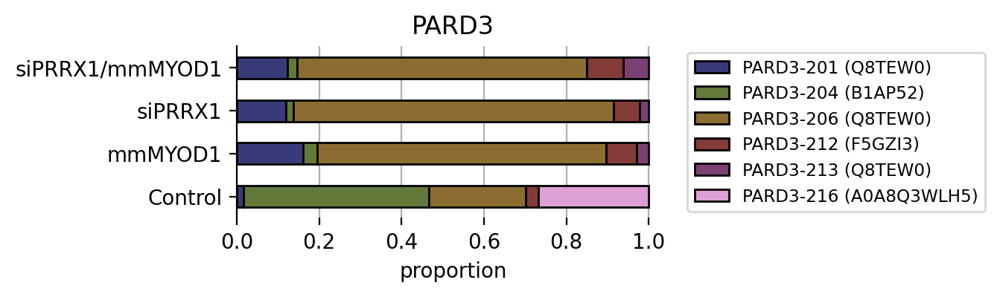

CDC42


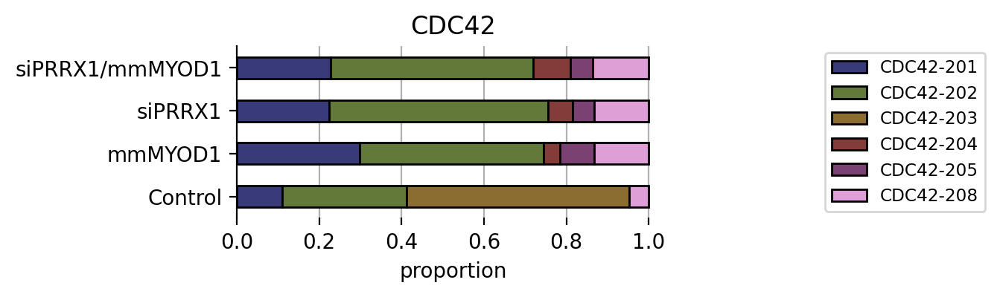

NOTCH2


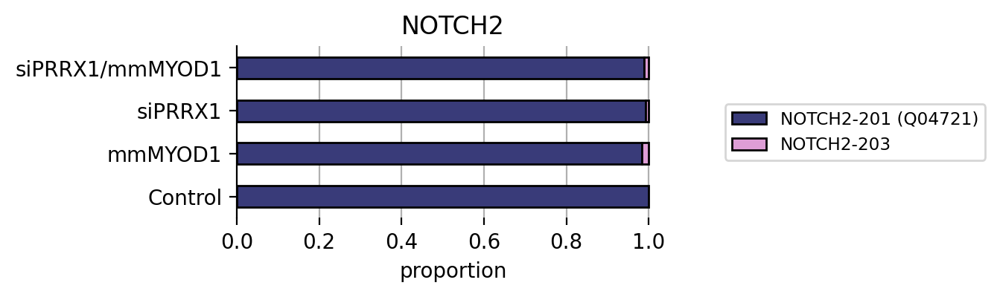

SAV1


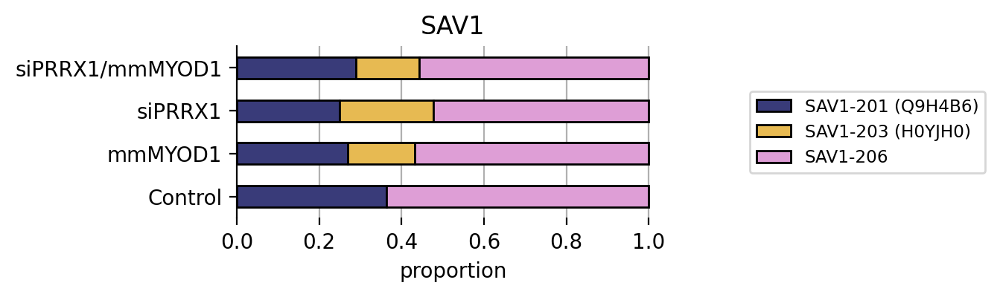

YAP1


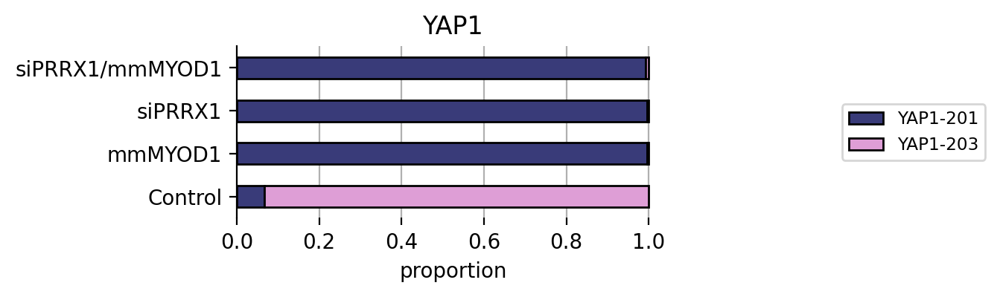

MOB1A


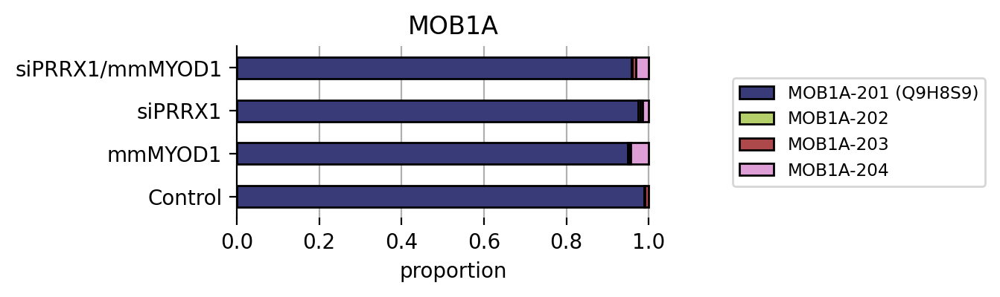

LATS1


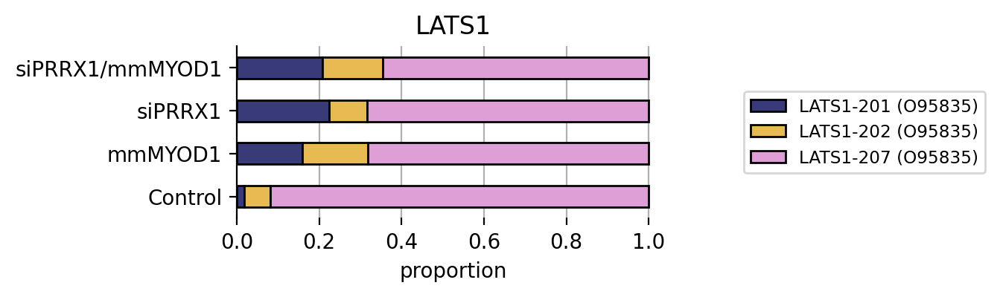

LATS2


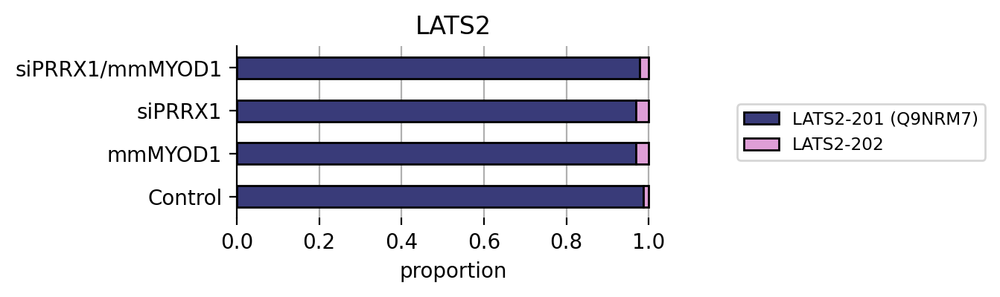

WWTR1


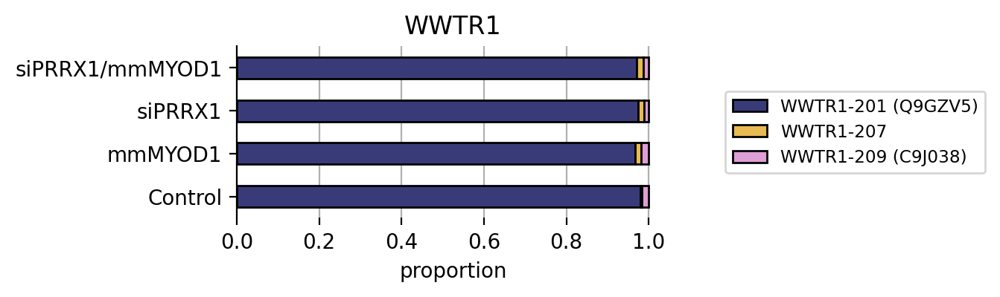

TEAD1


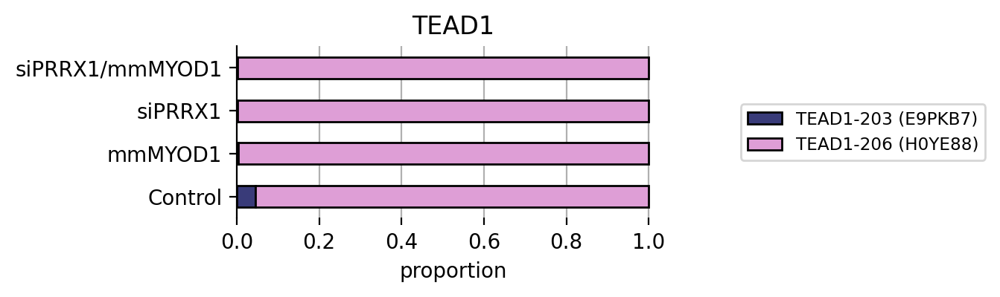

STAT1


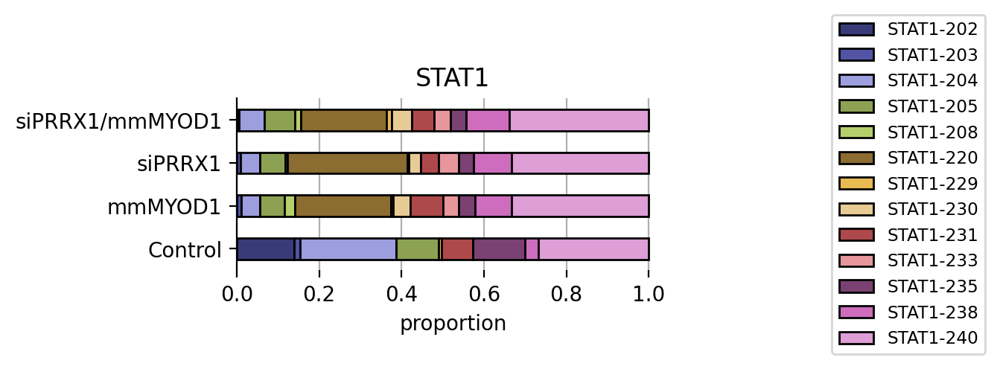

CTCF


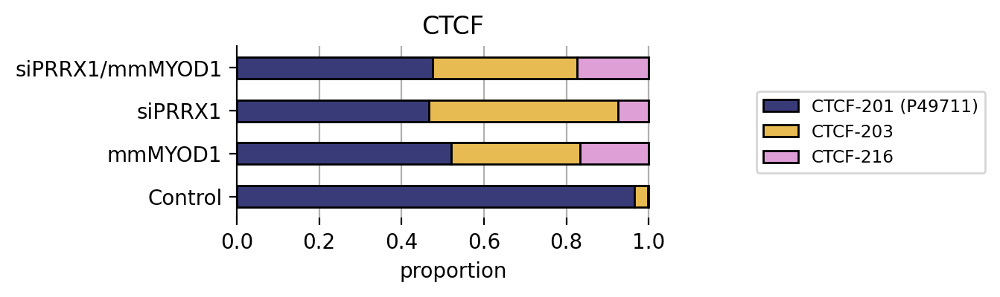

KLF4


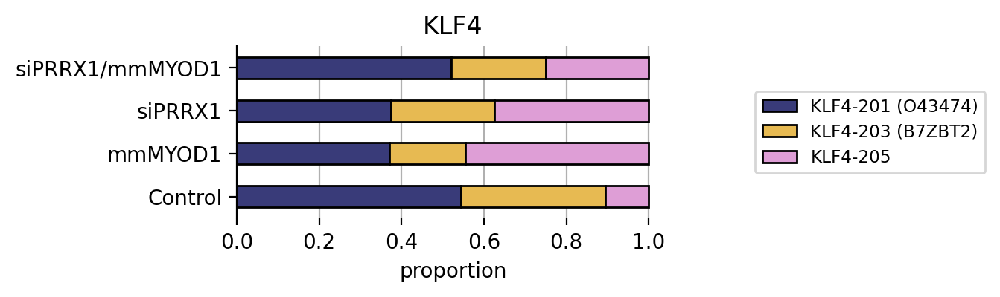

In [25]:
plot_df = pdf.copy()

genes_of_interest = [
    'MYOD1', 'PRRX1', 'CEBPB', 'TWIST1', 'TWIST2', 'ZEB1', 'VGLL4', 'SIX1', 'PBX1', 'CHD2', 'ID1', 'ID2', 'ID3', 'SP1', 'SNAI1', 'SNAI2',
    'TGFBR1', 'EP300', 'CREBBP', 'KAT2B', 'HDAC1', 'HDAC9', 'EZH2', 'CCND1', 'CHEK2', 'CDK1', 'CDK4', 'UBE2C', 'MYC', 'FOXM1', 'MYBL2', 'LEO1', 
    'RBL1', 'RBL1', 'RB1', 'ITGB1', 'RUNX1', 'NFKB1', 'JUN', 'JUNB', 'FOS', 'FOSB', 'COL1A1', 'COL1A2', 'S100A6', 'PPP2CA', 'PPP1CA', 'MEF2A',
    'PCLAF', 'NUMB', 'PARD3', 'CDC42', 'NOTCH2', 'SAV1', 'YAP1', 'MOB1A', 'LATS1', 'LATS2', 'WWTR1', 'TEAD1', 'STAT1', 'CTCF', 'KLF4', 
]

genes_of_interest = [g for g in genes_of_interest if g in plot_df['gene_name'].unique()]
print(len(genes_of_interest))

for gene in genes_of_interest:
    print(gene)

    gene_df = plot_df[plot_df['gene_name'] == gene].reset_index()

    # Option 1: using np.where
    gene_df['annotation'] = (
        gene_df['transcript_name']
        + np.where(
            gene_df['uniprot'].notna(),
            ' (' + gene_df['uniprot'] + ')',
            ''
        )
    )
    
    tmp = gene_df.set_index('annotation').copy()
    tmp = tmp[['Control_pct', 'mmMYOD1_pct', 'siPRRX1_pct', 'siPRRX1/mmMYOD1_pct']]
    tmp.columns = [x.replace("_pct", "") for x in tmp.columns]

    plt.rcParams['figure.dpi'] = 200
    plt.rcParams['figure.figsize'] = 3.75, 1.5

    # 1) Plot figure without legend
    fig1, ax1 = plt.subplots()
    tmp.T.plot(
        kind='barh',
        stacked=True,
        ec='k',
        zorder=10,
        width=0.5,
        cmap='tab20b',
        ax=ax1
    )
    ax1.grid(axis='x', zorder=0)
    ax1.set_xlabel("proportion")
    sns.move_legend(
        ax1,
        loc='center right',
        title="",
        bbox_to_anchor=(1.75, 0.5),
        fontsize='small',
    )
    ax1.set_title(gene)
    sns.despine(bottom=True)
    plt.show()

In [32]:
# adata.obsm["X_umap"] = adata.obs[["UMAP 1", "UMAP 2"]].to_numpy()

# adata.var.set_index('transcript_name', inplace=True)

layer_name= 'log_norm'

if sp.issparse(adata.layers[layer_name]):
    adata.layers[layer_name].data = adata.layers[layer_name].data.astype("float32")
else:
    adata.layers[layer_name] = adata.layers[layer_name].astype("float32")

adata

AnnData object with n_obs × n_vars = 16367 × 51242
    obs: 'dataset', 'n_reads', 'n_transcripts', 'UMAP 1', 'UMAP 2', 'cluster', 'pooled_condition'
    var: 'gene_id', 'gene_name', 'gene_type', 'transcript_type', 'Chromosome', 'Start', 'End', 'transcript_id', 'UniProtKB', 'n_counts', 'n_cells'
    uns: 'log1p'
    obsm: 'X_umap'
    layers: 'counts', 'log_norm'

In [40]:
adata.var['transcript_name'] = adata.var.index
adata.var.head()

,gene_id,gene_name,gene_type,transcript_type,Chromosome,Start,End,transcript_id,UniProtKB,n_counts,n_cells,transcript_name
transcript_name,,,,,,,,,,,,
ARF5-201,ENSG00000004059,ARF5,protein_coding,protein_coding,chr7,127588410,127591700,ENST00000000233,P84085,15182.0,9091,ARF5-201
M6PR-201,ENSG00000003056,M6PR,protein_coding,protein_coding,chr12,8940360,8949645,ENST00000000412,P20645,4602.0,3871,M6PR-201
ESRRA-201,ENSG00000173153,ESRRA,protein_coding,protein_coding,chr11,64305523,64316743,ENST00000000442,P11474,225.0,220,ESRRA-201
FKBP4-201,ENSG00000004478,FKBP4,protein_coding,protein_coding,chr12,2794969,2805423,ENST00000001008,Q02790,2906.0,2531,FKBP4-201
NDUFAF7-201,ENSG00000003509,NDUFAF7,protein_coding,protein_coding,chr2,37231657,37249160,ENST00000002125,Q7L592,490.0,478,NDUFAF7-201


In [41]:
def get_transcripts(query, adata=adata):

    df = adata.var[adata.var['gene_name'] == query].copy()

    columns = [
        'gene_name',
        'gene_type',
        'transcript_name',
        'transcript_type',
        'UniProtKB',
    ]

    df = df[columns]

    return df

gene_name      gene_type transcript_name transcript_type UniProtKB
     RARB protein_coding        RARB-201  protein_coding    P10826
     RARB protein_coding        RARB-205  protein_coding       NaN


ValueError: 'c' argument must be a color, a sequence of colors, or a sequence of numbers, not array([<cupyx.scipy.sparse._csr.csr_matrix object at 0x1533bc66ced0>],
      dtype=object)

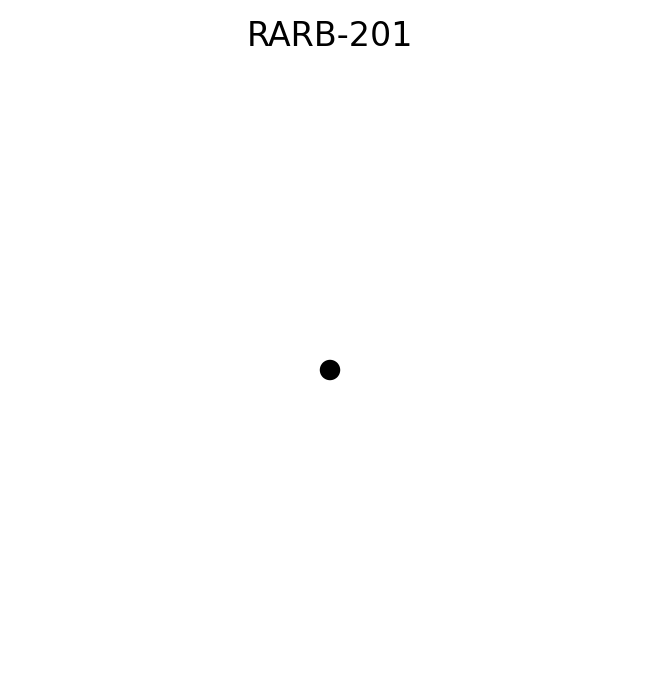

In [44]:
query = 'RARB'
label_df = get_transcripts(query)
print(label_df.to_string(index=False))

color = label_df.index.to_list()

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    ncols=4,
    sort_order=True,
    color='RARB-201',
    size=75,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    cmap='magma',
    colorbar_loc=None,
    frameon=False,
    layer='counts',
)

In [46]:
color = ['RARB-201', 'RARB-205']


plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    ncols=3,
    sort_order=True,
    color=color,
    size=75,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    cmap='magma',
    # colorbar_loc=None,
    frameon=False,
    # layer='log_norm',
)

AttributeError: 'list' object has no attribute 'to_list'

In [25]:
select = [
    'PICK1', 'RFX7', 'SALL1', 'SOX5', 'ZNF520', 
    'ZNF343', 'FOXP2', 'KLF4', 'SP140', 'RARB',
    'SOX6', 'TCF7L2', 'GPANK1', 'TIGD7', 'TRIM69',
    'FOSB', 'IKZF4', 'LHX9', 'NR1H3', 'TCF3', 'YWHAZ',
    'ZNF616', 'AEBP2', 'MIOS', 'NCOA2', 'NNT', 'PKM',
    'SMAD3', 'SMAD6', 'TRIB2', 'ZFP90', 'CNOT3', 'CPEB1',
    'EPAS1', 'ETV4', 'HDAC2', 'IRF1', 'MAPK1', 'MEF2C',
    'MZF1', 'NFIX', 'NR1H3', 'PRDM15', 'RUNX2', 'TP53',
    'TRIM28', 'ZNF232', 'ZNF358',
]

databases = [
    "GO_Biological_Process_2025",
    "Reactome_Pathways_2024",
    "KEGG_2021_Human",
    "WikiPathways_2024_Human",
    'MSigDB_Hallmark_2020',
    'BioPlanet_2019',
    'Panther_2016',
    'CellMarker_2024',
    'PanglaoDB_Augmented_2021',
]

# pd.set_option('display.max_colwidth', None)



n_terms = 5
alpha = 0.05

for database in databases:
    print(f"Running Enrichment with database: {database}...")

    
    enr = gget.enrichr(
        select,
        database=database,
        save=False,
    )

    
    display(enr[['path_name', 'overlapping_genes', 'adj_p_val']].head())
    print("------------------------------------------------------")

21:31:29 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.


Running Enrichment with database: GO_Biological_Process_2025...


,path_name,overlapping_genes,adj_p_val
0,Regulation of Transcription by RNA Polymerase II (GO:0006357),"[ZNF232, HDAC2, NFIX, EPAS1, SP140, PRDM15, IKZF4, SALL1, SOX6, SOX5, ZNF343, TCF7L2, NCOA2, MEF2C, SMAD3, NR1H3, KLF4, SMAD6, YWHAZ, ETV4, FOXP2, ZFP90, RUNX2, PKM, AEBP2, RFX7, ZNF616, IRF1, RARB, FOSB, ZNF358, MZF1, TP53, LHX9]",3.089714e-19
1,Regulation of DNA-templated Transcription (GO:0006355),"[ZNF232, HDAC2, NFIX, EPAS1, SP140, PRDM15, IKZF4, SALL1, TRIM28, SOX6, SOX5, ZNF343, TCF7L2, NCOA2, MEF2C, SMAD3, NR1H3, KLF4, SMAD6, ETV4, FOXP2, ZFP90, RUNX2, AEBP2, RFX7, ZNF616, IRF1, FOSB, ZNF358, MZF1, TP53, LHX9]",1.007500e-17
2,Positive Regulation of DNA-templated Transcription (GO:0045893),"[TCF7L2, NCOA2, HDAC2, MEF2C, SMAD3, NFIX, EPAS1, PRDM15, NR1H3, KLF4, ETV4, ZFP90, RUNX2, SALL1, PKM, TRIM28, RFX7, IRF1, RARB, MZF1, TP53]",6.228301e-11
3,Positive Regulation of Transcription by RNA Polymerase II (GO:0045944),"[TCF7L2, NCOA2, HDAC2, MEF2C, SMAD3, NFIX, EPAS1, PRDM15, NR1H3, KLF4, ETV4, RUNX2, SALL1, PKM, RFX7, IRF1, RARB, MZF1, TP53]",6.228301e-11
4,Negative Regulation of DNA-templated Transcription (GO:0045892),"[TCF7L2, HDAC2, MEF2C, SMAD3, NFIX, NR1H3, KLF4, YWHAZ, FOXP2, IKZF4, RUNX2, SALL1, TRIM28, IRF1, RARB, FOSB, MZF1, TP53, LHX9]",7.510357e-11


21:31:29 - INFO - Performing Enrichr analysis using database Reactome_Pathways_2024.


------------------------------------------------------
Running Enrichment with database: Reactome_Pathways_2024...


,path_name,overlapping_genes,adj_p_val
0,Gene Expression (Transcription),"[TCF7L2, NCOA2, HDAC2, MEF2C, SMAD3, NFIX, NR1H3, KLF4, SMAD6, YWHAZ, ZFP90, RUNX2, AEBP2, TRIM28, ZNF616, CNOT3, RARB, MAPK1, TCF3, TP53, ZNF343]",1.133972e-08
1,Generic Transcription Pathway,"[TCF7L2, HDAC2, MEF2C, SMAD3, NR1H3, KLF4, SMAD6, YWHAZ, ZFP90, RUNX2, TRIM28, ZNF616, CNOT3, RARB, MAPK1, TCF3, TP53, ZNF343]",3.780295e-08
2,RNA Polymerase II Transcription,"[TCF7L2, HDAC2, MEF2C, SMAD3, NR1H3, KLF4, SMAD6, YWHAZ, ZFP90, RUNX2, TRIM28, ZNF616, CNOT3, RARB, MAPK1, TCF3, TP53, ZNF343]",1.279507e-07
3,Developmental Biology,"[TCF7L2, NCOA2, HDAC2, MEF2C, SMAD3, KLF4, CPEB1, SALL1, CNOT3, RARB, MAPK1, TCF3, TP53, LHX9]",3.045769e-04
4,FOXO-mediated Transcription,"[HDAC2, SMAD3, KLF4, YWHAZ]",1.730420e-03


21:31:29 - INFO - Performing Enrichr analysis using database KEGG_2021_Human.


------------------------------------------------------
Running Enrichment with database: KEGG_2021_Human...


,path_name,overlapping_genes,adj_p_val
0,Transcriptional misregulation in cancer,"[HDAC2, MEF2C, TCF3, ETV4, TP53, RUNX2]",0.000927
1,Gastric cancer,"[TCF7L2, SMAD3, RARB, MAPK1, TP53]",0.001606
2,Chronic myeloid leukemia,"[HDAC2, SMAD3, MAPK1, TP53]",0.001606
3,Colorectal cancer,"[TCF7L2, SMAD3, MAPK1, TP53]",0.001959
4,Thyroid cancer,"[TCF7L2, MAPK1, TP53]",0.002779


21:31:30 - INFO - Performing Enrichr analysis using database WikiPathways_2024_Human.


------------------------------------------------------
Running Enrichment with database: WikiPathways_2024_Human...


,path_name,overlapping_genes,adj_p_val
0,TGF Beta Signaling Pathway WP366,"[MEF2C, SMAD3, FOSB, MAPK1, TP53, RUNX2]",0.000201
1,Mesodermal Commitment Pathway WP2857,"[SMAD3, AEBP2, TRIM28, RARB, KLF4, SMAD6]",0.000201
2,Osteoarthritic Chondrocyte Hypertrophy WP5373,"[EPAS1, FOSB, MAPK1, RUNX2]",0.000629
3,TGF Beta In Thyroid Cells For Epithelial Mesenchymal Transition WP3859,"[SMAD3, MAPK1, RUNX2]",0.000629
4,Cell Differentiation Expanded Index WP2023,"[MEF2C, KLF4, RUNX2]",0.000629


21:31:30 - INFO - Performing Enrichr analysis using database MSigDB_Hallmark_2020.


------------------------------------------------------
Running Enrichment with database: MSigDB_Hallmark_2020...


,path_name,overlapping_genes,adj_p_val
0,TNF-alpha Signaling via NF-kB,"[SMAD3, IRF1, FOSB, KLF4]",0.037480
1,Wnt-beta Catenin Signaling,"[HDAC2, TP53]",0.063951
2,TGF-beta Signaling,"[SMAD3, SMAD6]",0.069575
3,KRAS Signaling Up,"[KLF4, TRIB2, ETV4]",0.085730
4,UV Response Dn,"[SMAD3, MIOS]",0.194200


21:31:30 - INFO - Performing Enrichr analysis using database BioPlanet_2019.


------------------------------------------------------
Running Enrichment with database: BioPlanet_2019...


,path_name,overlapping_genes,adj_p_val
0,SMAD2/3 nuclear pathway,"[NCOA2, HDAC2, MEF2C, SMAD3, TCF3, RUNX2]",0.000018
1,Generic transcription pathway,"[NCOA2, SMAD3, TRIM28, ZNF616, RARB, NR1H3, ZFP90, RUNX2, ZNF343]",0.000039
2,TGF-beta signaling pathway,"[MEF2C, SMAD3, FOSB, MAPK1, SMAD6, TP53, RUNX2]",0.000039
3,Nuclear beta-catenin signaling and target gene transcription regulation,"[TCF7L2, NCOA2, HDAC2, KLF4, YWHAZ]",0.000129
4,Regular glucocorticoid receptor pathway,"[NCOA2, HDAC2, IRF1, MAPK1, TP53]",0.000129


21:31:30 - INFO - Performing Enrichr analysis using database Panther_2016.


------------------------------------------------------
Running Enrichment with database: Panther_2016...


,path_name,overlapping_genes,adj_p_val
0,TGF-beta signaling pathway Homo sapiens P00052,"[SMAD3, MAPK1, SMAD6]",0.040716
1,Parkinson disease Homo sapiens P00049,"[MAPK1, YWHAZ]",0.119730
2,P53 pathway feedback loops 1 Homo sapiens P04392,[TP53],0.119730
3,Pyruvate metabolism Homo sapiens P02772,[PKM],0.119730
4,FGF signaling pathway Homo sapiens P00021,"[MAPK1, YWHAZ]",0.119730


21:31:31 - INFO - Performing Enrichr analysis using database CellMarker_2024.


------------------------------------------------------
Running Enrichment with database: CellMarker_2024...


,path_name,overlapping_genes,adj_p_val
0,Embryonic Stem Cell Undefined Human,"[TRIM28, CNOT3, TCF3, KLF4]",0.000831
1,B Cell Lymph Human,"[RFX7, TCF3, TP53]",0.001774
2,Chondrocyte Bone Mouse,"[SOX6, SOX5]",0.001774
3,Chondrogenic Cell Adipose Tissue Mouse,"[SOX6, SOX5]",0.001774
4,Deep Layer Neuron Cortex Human,"[FOXP2, SOX5]",0.001774


21:31:31 - INFO - Performing Enrichr analysis using database PanglaoDB_Augmented_2021.


------------------------------------------------------
Running Enrichment with database: PanglaoDB_Augmented_2021...


,path_name,overlapping_genes,adj_p_val
0,Embryonic Stem Cells,"[SMAD3, TRIM28, KLF4]",0.354657
1,Chondrocytes,"[SOX6, RUNX2]",0.354657
2,Mesangial Cells,"[NCOA2, MEF2C]",0.354657
3,Endothelial Cells (Aorta),"[EPAS1, SMAD6]",0.354657
4,Adipocytes,"[EPAS1, NR1H3]",0.354657


------------------------------------------------------


In [26]:
# enr = gget.enrichr(
#     select,
#     database=database,
#     save=False,
# )

enr = gget.enrichr(select, "GO_Biological_Process_2025", save=False)

display(enr[['path_name', 'overlapping_genes', 'adj_p_val']].head(15))


21:36:25 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.


,path_name,overlapping_genes,adj_p_val
0,Regulation of Transcription by RNA Polymerase II (GO:0006357),"[ZNF232, HDAC2, NFIX, EPAS1, SP140, PRDM15, IKZF4, SALL1, SOX6, SOX5, ZNF343, TCF7L2, NCOA2, MEF2C, SMAD3, NR1H3, KLF4, SMAD6, YWHAZ, ETV4, FOXP2, ZFP90, RUNX2, PKM, AEBP2, RFX7, ZNF616, IRF1, RARB, FOSB, ZNF358, MZF1, TP53, LHX9]",3.089714e-19
1,Regulation of DNA-templated Transcription (GO:0006355),"[ZNF232, HDAC2, NFIX, EPAS1, SP140, PRDM15, IKZF4, SALL1, TRIM28, SOX6, SOX5, ZNF343, TCF7L2, NCOA2, MEF2C, SMAD3, NR1H3, KLF4, SMAD6, ETV4, FOXP2, ZFP90, RUNX2, AEBP2, RFX7, ZNF616, IRF1, FOSB, ZNF358, MZF1, TP53, LHX9]",1.007500e-17
2,Positive Regulation of DNA-templated Transcription (GO:0045893),"[TCF7L2, NCOA2, HDAC2, MEF2C, SMAD3, NFIX, EPAS1, PRDM15, NR1H3, KLF4, ETV4, ZFP90, RUNX2, SALL1, PKM, TRIM28, RFX7, IRF1, RARB, MZF1, TP53]",6.228301e-11
3,Positive Regulation of Transcription by RNA Polymerase II (GO:0045944),"[TCF7L2, NCOA2, HDAC2, MEF2C, SMAD3, NFIX, EPAS1, PRDM15, NR1H3, KLF4, ETV4, RUNX2, SALL1, PKM, RFX7, IRF1, RARB, MZF1, TP53]",6.228301e-11
4,Negative Regulation of DNA-templated Transcription (GO:0045892),"[TCF7L2, HDAC2, MEF2C, SMAD3, NFIX, NR1H3, KLF4, YWHAZ, FOXP2, IKZF4, RUNX2, SALL1, TRIM28, IRF1, RARB, FOSB, MZF1, TP53, LHX9]",7.510357e-11
5,Positive Regulation of RNA Biosynthetic Process (GO:1902680),"[TCF7L2, HDAC2, MEF2C, SALL1, SMAD3, TRIM28, IRF1, NR1H3, KLF4, TP53, ZFP90, RUNX2]",6.238178e-07
6,Negative Regulation of RNA Biosynthetic Process (GO:1902679),"[TCF7L2, HDAC2, SALL1, TRIM28, IRF1, KLF4, TP53, FOXP2, IKZF4, LHX9, RUNX2]",1.012499e-06
7,Negative Regulation of Transcription by RNA Polymerase II (GO:0000122),"[TCF7L2, HDAC2, MEF2C, SMAD3, NFIX, NR1H3, KLF4, YWHAZ, SALL1, RARB, FOSB, MZF1, TP53]",1.012499e-06
8,Positive Regulation of Multicellular Organismal Process (GO:0051240),"[TCF7L2, NCOA2, HDAC2, SMAD3, EPAS1, CNOT3, SOX6, ETV4, SOX5]",3.647552e-05
9,Chondrocyte Differentiation (GO:0002062),"[MEF2C, SOX6, RUNX2, SOX5]",7.204749e-05
